# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

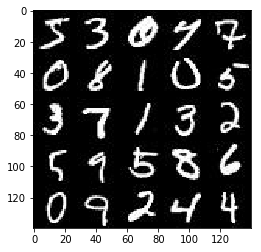

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

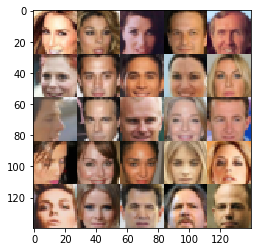

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests
import importlib
importlib.reload(tests)

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_real = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], name='input_real')
    inputs_z = tf.placeholder(tf.float32, [None, z_dim], name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def lrelu(tensor, alpha=0.2):
    """
    Leaky ReLU implementation
    :param tensor: Input Tensor
    :param alpha: Leak scaling for negative inputs
    :return: Leaky ReLU output
    """
    return tf.maximum(tensor * alpha, tensor)

def discriminator(images, reuse=False, alpha=0.2, training=True):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    Optional
    :param alpha: Leak factor for Leaky ReLU
    :param training: Boolean for batch normalization to use batch or population statistics
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    # input is 28x28x1 or 28x28x3
    with tf.variable_scope('discriminator', reuse=reuse):
        x = tf.layers.conv2d(images, filters=64, kernel_size=5, strides=2, padding='same', activation=None)
        x = lrelu(x, alpha)
        # Now 14x14x64
        
        # 2 conv layers for 7x7x128 -> 4x4x256
        for filter_depth in [128, 256]:
            x = tf.layers.conv2d(x, filters=filter_depth, kernel_size=5, strides=2, padding='same', activation=None, use_bias=False)
            # Use batch normalization
            x = tf.layers.batch_normalization(x, training=training)
            x = lrelu(x, alpha)
        # Now 4x4x256
        
        flat = tf.reshape(x, [-1, 4*4*256])
        logits = tf.layers.dense(flat, 1, activation=None)
        out = tf.sigmoid(logits)
        #print(x.shape, flat.shape, logits.shape)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


# Current Discriminator

In [7]:
def lrelu(tensor, alpha=0.2):
    """
    Leaky ReLU implementation
    :param tensor: Input Tensor
    :param alpha: Leak scaling for negative inputs
    :return: Leaky ReLU output
    """
    return tf.maximum(tensor * alpha, tensor)

def discriminator(images, reuse=False, alpha=0.2, training=True, init_stddev=None):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    Optional
    :param alpha: Leak factor for Leaky ReLU
    :param training: Boolean for batch normalization to use batch or population statistics
    :init_stddev: Standard Deviation for the kernel initializer. If None, don't use initializer
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    kernel_initializer = None
    if init_stddev is not None:
        kernel_initializer = tf.truncated_normal_initializer(stddev=init_stddev)
    # input is 28x28x1 or 28x28x3
    with tf.variable_scope('discriminator', reuse=reuse):
        x = tf.layers.conv2d(images, filters=64, kernel_size=5, strides=2, padding='same', activation=None, 
                             use_bias=True, kernel_initializer=kernel_initializer)
        x = lrelu(x, alpha)
        # Now 14x14x64
        
        # 2 conv layers for 7x7x128 -> 4x4x256 -> 2x2x512
        for filter_depth in [128, 256, 512]:
            x = tf.layers.conv2d(x, filters=filter_depth, kernel_size=5, strides=2, padding='same', activation=None, 
                                 use_bias=False, kernel_initializer=kernel_initializer)
            # Use batch normalization
            x = tf.layers.batch_normalization(x, training=training)
            x = lrelu(x, alpha)
        # Now 2x2x512
        
        
        #flat = tf.reshape(x, [-1, 4*4*256])
        flat = tf.reshape(x, [-1, 2*2*512])
        logits = tf.layers.dense(flat, 1, activation=None)
        out = tf.sigmoid(logits)
        #print(x.shape, flat.shape, logits.shape)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    Optional
    :param alpha: Leak factor for Leaky ReLU
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    # during training, don't reuse, during generation, reuse variables
    with tf.variable_scope('generator', reuse=not is_train):
        # Fully connected layer
        x = tf.layers.dense(z, 2*2*512, activation=None, use_bias=False)
        # Reshape to start the conv stack
        x = tf.reshape(x, (-1, 2, 2, 512))
        x = lrelu(x, alpha)
        # Now 2x2x1024
        
        x = tf.layers.conv2d_transpose(x, 256, kernel_size=5, strides=2, padding='valid', activation=None, use_bias=False)
        x = tf.layers.batch_normalization(x, training=is_train)
        x = lrelu(x, alpha)
        # 7x7x512
        
        #print(x.shape)
        x = tf.layers.conv2d_transpose(x, 128, kernel_size=5, strides=2, padding='same', activation=None, use_bias=False)
        x = tf.layers.batch_normalization(x, training=is_train)
        x = lrelu(x, alpha)
        # 14x14x256
        
        #print(x.shape)
        logits = tf.layers.conv2d_transpose(x, out_channel_dim, kernel_size=5, strides=2, padding='same')
        #logits = tf.layers.conv2d(logits, out_channel_dim, kernel_size=1, strides=1, padding='same')
        # 28x28xout_channel_dim
        
        #print(logits.shape)
        # the real images from get_batches are scaled between -0.5 and 0.5
        #scale = 0.5
        #out = tf.multiply(tf.tanh(logits), scale)
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


In [9]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    Optional
    :param alpha: Leak factor for Leaky ReLU
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    # during training, don't reuse, during generation, reuse variables
    with tf.variable_scope('generator', reuse=not is_train):
        # Fully connected layer
        x = tf.layers.dense(z, 2*2*512, activation=None, use_bias=False)
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.nn.relu(x)
        # Reshape to start the conv stack
        x = tf.reshape(x, (-1, 2, 2, 512))
        
        #x = lrelu(x, alpha)
        
        # Now 2x2x1024
        
        x = tf.layers.conv2d_transpose(x, 256, kernel_size=5, strides=2, padding='valid', activation=None, use_bias=False)
        x = tf.layers.batch_normalization(x, training=is_train)
        #x = lrelu(x, alpha)
        x = tf.nn.relu(x)
        # 7x7x512
        
        #print(x.shape)
        x = tf.layers.conv2d_transpose(x, 128, kernel_size=5, strides=2, padding='same', activation=None, use_bias=False)
        x = tf.layers.batch_normalization(x, training=is_train)
        #x = lrelu(x, alpha)
        x = tf.nn.relu(x)
        # 14x14x256
        
        #print(x.shape)
        logits = tf.layers.conv2d_transpose(x, out_channel_dim, kernel_size=5, strides=2, padding='same', activation=None)
        #logits = tf.layers.conv2d(logits, out_channel_dim, kernel_size=1, strides=1, padding='same')
        # 28x28xout_channel_dim
        
        #print(logits.shape)
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


In [10]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2, drop_rate=0.0):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    Optional
    :param alpha: Leak factor for Leaky ReLU
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    # during training, don't reuse, during generation, reuse variables
    with tf.variable_scope('generator', reuse=not is_train):
        # Fully connected layer
        x = tf.layers.dense(z, 2*2*1024, activation=None, use_bias=False)
        #x = tf.layers.batch_normalization(x, training=is_train)
        #x = tf.nn.relu(x)
        # Reshape to start the conv stack
        x = tf.reshape(x, (-1, 2, 2, 1024))
        #x = tf.layers.dropout(x, rate=drop_rate, training=is_train)
        
        x = lrelu(x, alpha)
        
        # Now 2x2x1024
        
        x = tf.layers.conv2d_transpose(x, 512, kernel_size=5, strides=2, padding='valid', activation=None, use_bias=False)
        x = tf.layers.batch_normalization(x, training=is_train)
        x = lrelu(x, alpha)
        #x = tf.nn.relu(x)
        #x = tf.layers.dropout(x, rate=drop_rate, training=is_train)
        # 7x7x512
        
        #print(x.shape)
        x = tf.layers.conv2d_transpose(x, 256, kernel_size=5, strides=2, padding='same', activation=None, use_bias=False)
        x = tf.layers.batch_normalization(x, training=is_train)
        x = lrelu(x, alpha)
        #x = tf.nn.relu(x)
        #x = tf.layers.dropout(x, rate=drop_rate, training=is_train)
        # 14x14x256
        
        #print(x.shape)
        logits = tf.layers.conv2d_transpose(x, out_channel_dim, kernel_size=5, strides=2, padding='same', activation=None)
        #logits = tf.layers.conv2d(logits, out_channel_dim, kernel_size=1, strides=1, padding='same')
        # 28x28xout_channel_dim
        
        #print(logits.shape)
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


# Current Generator

In [11]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2, drop_rate=0.5, init_stddev=None):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    Optional
    :param alpha: Leak factor for Leaky ReLU
    :init_stddev: Standard Deviation for the kernel initializer. If None, don't use initializer
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    kernel_initializer = None
    if init_stddev is not None:
        kernel_initializer = tf.truncated_normal_initializer(stddev=init_stddev)
    
    # during training, don't reuse, during generation, reuse variables
    with tf.variable_scope('generator', reuse=not is_train):
        # Fully connected layer
        x = tf.layers.dense(z, 2*2*1024, activation=None, use_bias=False)
        #x = tf.layers.batch_normalization(x, training=is_train)
        
        # Reshape to start the conv stack
        x = tf.reshape(x, (-1, 2, 2, 1024))
        x = tf.layers.dropout(x, rate=drop_rate, training=is_train)
        #x = tf.nn.relu(x)
        x = lrelu(x, alpha)
        
        # Now 2x2x1024
        
        x = tf.layers.conv2d_transpose(x, 512, kernel_size=5, strides=2, padding='valid', activation=None, 
                                       use_bias=False, kernel_initializer=kernel_initializer)
        x = tf.layers.batch_normalization(x, training=is_train)
        x = lrelu(x, alpha)
        #x = tf.nn.relu(x)
        x = tf.layers.dropout(x, rate=drop_rate, training=is_train)
        # 7x7x512
        
        #print(x.shape)
        x = tf.layers.conv2d_transpose(x, 256, kernel_size=5, strides=2, padding='same', activation=None, 
                                       use_bias=False, kernel_initializer=kernel_initializer)
        x = tf.layers.batch_normalization(x, training=is_train)
        x = lrelu(x, alpha)
        #x = tf.nn.relu(x)
        x = tf.layers.dropout(x, rate=drop_rate, training=is_train)
        # 14x14x256
        
        #print(x.shape)
        logits = tf.layers.conv2d_transpose(x, out_channel_dim, kernel_size=5, strides=2, padding='same', activation=None)
        #logits = tf.layers.conv2d(logits, out_channel_dim, kernel_size=1, strides=1, padding='same', activation=None)
        # 28x28xout_channel_dim
        
        #print(logits.shape)
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [12]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2, label_smooth=0.1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    Optional
    :param alpha: Leak factor for Leaky ReLU
    :param label_smooth: Label smoothing for better discriminator generalization
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real) * (1 - label_smooth)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [13]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    # Get batch normalization variables to update
    d_update_opts = tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='discriminator')
    g_update_opts = tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='generator')
    
    with tf.control_dependencies(d_update_opts):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    with tf.control_dependencies(g_update_opts):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [14]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [15]:
try:
    from tqdm import tqdm
except ImportError:
    def tqdm(x):
        return x

In [16]:
!mkdir checkpoints

A subdirectory or file checkpoints already exists.


In [17]:
def plot_losses(losses):
    """
    Plot training losses
    :param losses: list of tuples of (discriminator loss, generator loss)
    """
    import matplotlib.pyplot as plt
    fig, ax = plt.subplots()
    # each row in losses is (discriminator loss, generator loss)
    losses = np.array(losses)
    # transpose of losses would give all discriminator losses as first row and generator losses as second row
    plt.plot(losses.T[0], label='Discriminator', alpha=0.3)
    plt.plot(losses.T[1], label='Generator')
    plt.title('Training Losses')
    plt.legend()

In [18]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode, alpha=0.2, 
          print_every=10, show_every=100, show_n_images=25):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    Optional
    :param alpha: Leak factor for Leaky ReLU
    :param print_every: Print loss every n steps
    :param show_every: Show images generated every n steps
    :param show_n_images: Number of images to show each time
    """
    # TODO: Build Model
    
    # data_shape is (samples x width x height x channels)
    input_real, input_z, learn_rate = model_inputs(*data_shape[1:], z_dim)
    out_channel_dim = data_shape[-1]
    d_loss, g_loss = model_loss(input_real, input_z, out_channel_dim, alpha=alpha)
    d_opt, g_opt = model_opt(d_loss, g_loss, learn_rate, beta1)
    
    saver = tf.train.Saver()
    steps = 0
    losses = []
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        epoch_pbar = tqdm(range(epoch_count), desc='Epochs', unit='epoch')
        
        #for epoch_i in range(epoch_count):
        for epoch_i in epoch_pbar:
            batch_count = data_shape[0]//batch_size
            batch_pbar = tqdm(get_batches(batch_size), desc='Batches', unit='batch', miniters=show_every, 
                              total=batch_count, maxinterval=360)
            batch_i = 0
            #for batch_images in get_batches(batch_size):
            for batch_images in batch_pbar:
                # TODO: Train Model
                steps += 1
                batch_i += 1
                # the real images from get_batches are scaled between -0.5 and 0.5, so we scale to -1 to 1 to match generator
                batch_images *= 2
                # Sample random noise for Generator
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, learn_rate: learning_rate})
                # Train generator twice to meet loss lower than discriminator requirement
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, learn_rate: learning_rate})
                #_ = sess.run(g_opt, feed_dict={input_z: batch_z, learn_rate: learning_rate})
                
                if steps % print_every == 0:
                    train_loss_d = d_loss.eval({input_real: batch_images, input_z: batch_z})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    
                    print('Epoch {}/{}...'.format(epoch_i, epoch_count),
                          'Batch {}/{}...'.format(batch_i, batch_count),
                          'Discriminator loss: {:.4f}'.format(train_loss_d),
                          'Generator loss: {:.4f}'.format(train_loss_g))
                    losses.append((train_loss_d, train_loss_g))
                
                if steps % show_every == 0:
                    show_generator_output(sess, show_n_images, input_z, out_channel_dim, data_image_mode)
        saver.save(sess, './checkpoints/generator_bs{}_zd{}_lr{}_b{}_ep{}.ckpt'.format(batch_size, z_dim, learning_rate, beta1, epoch_count))
    plot_losses(losses)

In [19]:
z_dim = 100
beta1 = 0.5
# Generate some random faces
def generate_faces(checkpoint=None, z_dim=z_dim, beta1=beta1, show_n_images=25):
    graph = tf.Graph()
    if not checkpoint:
        checkpoint = tf.train.latest_checkpoint('checkpoints')
    print('Generating faces from saved checkpoint:', checkpoint)
    with graph.as_default():
        input_real, input_z, learn_rate = model_inputs(28, 28, 3, z_dim)
        d_loss, g_loss = model_loss(input_real, input_z, 3)
        d_opt, g_opt = model_opt(d_loss, g_loss, learn_rate, beta1)
        #dummy = tf.Variable(0)
        saver = tf.train.Saver()
        with tf.Session() as sess:
            #sess.run(tf.global_variables_initializer())
            saver.restore(sess, checkpoint)
            show_generator_output(sess, show_n_images, input_z, 3, 'RGB')

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

In [20]:
mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
mnist_dataset.shape

(60000, 28, 28, 1)

In [21]:
celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
celeba_dataset.shape

(202599, 28, 28, 3)

Batches:   0%|                                                                                    | 0/468 [00:00<?, ?batch/s]

Epoch 0/2... Batch 10/468... Discriminator loss: 0.4917 Generator loss: 5.2180
Epoch 0/2... Batch 20/468... Discriminator loss: 3.6643 Generator loss: 0.0700
Epoch 0/2... Batch 30/468... Discriminator loss: 2.1145 Generator loss: 3.2754
Epoch 0/2... Batch 40/468... Discriminator loss: 1.9406 Generator loss: 1.6231
Epoch 0/2... Batch 50/468... Discriminator loss: 0.8335 Generator loss: 1.9555
Epoch 0/2... Batch 60/468... Discriminator loss: 1.3331 Generator loss: 0.9221
Epoch 0/2... Batch 70/468... Discriminator loss: 1.4760 Generator loss: 0.5973
Epoch 0/2... Batch 80/468... Discriminator loss: 0.9745 Generator loss: 2.3600
Epoch 0/2... Batch 90/468... Discriminator loss: 0.8449 Generator loss: 1.4911
Epoch 0/2... Batch 100/468... Discriminator loss: 0.8251 Generator loss: 1.5158


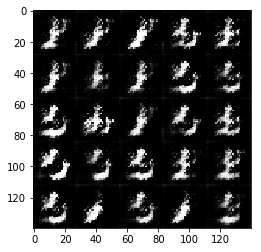


Batches:  21%|███████████████▊                                                          | 100/468 [00:26<01:38,  3.73batch/s]

Epoch 0/2... Batch 110/468... Discriminator loss: 1.2290 Generator loss: 1.7586
Epoch 0/2... Batch 120/468... Discriminator loss: 1.5158 Generator loss: 0.6855
Epoch 0/2... Batch 130/468... Discriminator loss: 1.6074 Generator loss: 0.9875
Epoch 0/2... Batch 140/468... Discriminator loss: 2.0240 Generator loss: 0.3558
Epoch 0/2... Batch 150/468... Discriminator loss: 0.9545 Generator loss: 1.3825
Epoch 0/2... Batch 160/468... Discriminator loss: 1.1279 Generator loss: 1.2117
Epoch 0/2... Batch 170/468... Discriminator loss: 1.1458 Generator loss: 1.0389
Epoch 0/2... Batch 180/468... Discriminator loss: 1.1388 Generator loss: 1.1487
Epoch 0/2... Batch 190/468... Discriminator loss: 1.2500 Generator loss: 1.3857
Epoch 0/2... Batch 200/468... Discriminator loss: 1.7996 Generator loss: 0.7772


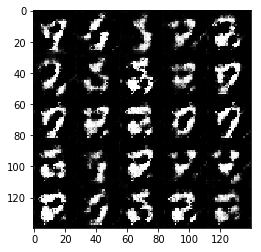


Batches:  43%|███████████████████████████████▌                                          | 200/468 [00:52<01:10,  3.80batch/s]

Epoch 0/2... Batch 210/468... Discriminator loss: 1.2502 Generator loss: 0.8111
Epoch 0/2... Batch 220/468... Discriminator loss: 1.1672 Generator loss: 1.0612
Epoch 0/2... Batch 230/468... Discriminator loss: 1.4713 Generator loss: 0.8002
Epoch 0/2... Batch 240/468... Discriminator loss: 1.1337 Generator loss: 1.2037
Epoch 0/2... Batch 250/468... Discriminator loss: 1.2027 Generator loss: 1.0628
Epoch 0/2... Batch 260/468... Discriminator loss: 1.2021 Generator loss: 1.3674
Epoch 0/2... Batch 270/468... Discriminator loss: 1.4274 Generator loss: 0.6277
Epoch 0/2... Batch 280/468... Discriminator loss: 1.2764 Generator loss: 1.0985
Epoch 0/2... Batch 290/468... Discriminator loss: 1.1557 Generator loss: 1.0927
Epoch 0/2... Batch 300/468... Discriminator loss: 1.2954 Generator loss: 0.8428


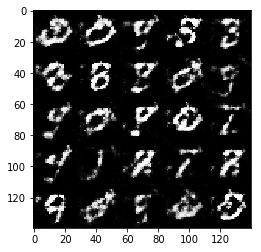


Batches:  64%|███████████████████████████████████████████████▍                          | 300/468 [01:19<00:44,  3.75batch/s]

Epoch 0/2... Batch 310/468... Discriminator loss: 1.3570 Generator loss: 1.0544
Epoch 0/2... Batch 320/468... Discriminator loss: 1.3732 Generator loss: 1.0085
Epoch 0/2... Batch 330/468... Discriminator loss: 1.3976 Generator loss: 1.1268
Epoch 0/2... Batch 340/468... Discriminator loss: 1.3836 Generator loss: 1.1496
Epoch 0/2... Batch 350/468... Discriminator loss: 1.2577 Generator loss: 1.3831
Epoch 0/2... Batch 360/468... Discriminator loss: 1.4038 Generator loss: 0.8038
Epoch 0/2... Batch 370/468... Discriminator loss: 1.4000 Generator loss: 1.0657
Epoch 0/2... Batch 380/468... Discriminator loss: 1.2514 Generator loss: 0.8665
Epoch 0/2... Batch 390/468... Discriminator loss: 1.4491 Generator loss: 0.6437
Epoch 0/2... Batch 400/468... Discriminator loss: 1.2428 Generator loss: 0.9599


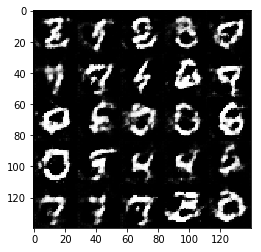


Batches:  85%|███████████████████████████████████████████████████████████████▏          | 400/468 [01:44<00:17,  3.82batch/s]

Epoch 0/2... Batch 410/468... Discriminator loss: 1.4123 Generator loss: 1.3603
Epoch 0/2... Batch 420/468... Discriminator loss: 1.4848 Generator loss: 0.4702
Epoch 0/2... Batch 430/468... Discriminator loss: 1.3709 Generator loss: 0.9749
Epoch 0/2... Batch 440/468... Discriminator loss: 1.3116 Generator loss: 1.0834
Epoch 0/2... Batch 450/468... Discriminator loss: 1.2400 Generator loss: 1.0020
Epoch 0/2... Batch 460/468... Discriminator loss: 1.2240 Generator loss: 1.1380



Batches:   0%|                                                                                    | 0/468 [00:00<?, ?batch/s]

Epoch 1/2... Batch 2/468... Discriminator loss: 1.3871 Generator loss: 0.7944
Epoch 1/2... Batch 12/468... Discriminator loss: 1.2662 Generator loss: 0.7959
Epoch 1/2... Batch 22/468... Discriminator loss: 1.3655 Generator loss: 0.6302
Epoch 1/2... Batch 32/468... Discriminator loss: 1.4927 Generator loss: 0.9913


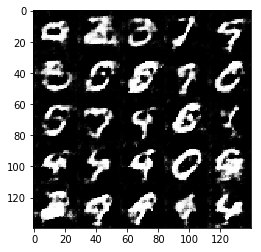

Epoch 1/2... Batch 42/468... Discriminator loss: 1.2931 Generator loss: 0.7734
Epoch 1/2... Batch 52/468... Discriminator loss: 1.3677 Generator loss: 0.6417
Epoch 1/2... Batch 62/468... Discriminator loss: 1.4126 Generator loss: 0.6299
Epoch 1/2... Batch 72/468... Discriminator loss: 1.3792 Generator loss: 0.6583
Epoch 1/2... Batch 82/468... Discriminator loss: 1.3868 Generator loss: 0.8547
Epoch 1/2... Batch 92/468... Discriminator loss: 1.2090 Generator loss: 0.9803



Batches:  21%|███████████████▊                                                          | 100/468 [00:24<01:31,  4.02batch/s]

Epoch 1/2... Batch 102/468... Discriminator loss: 1.3643 Generator loss: 0.9544
Epoch 1/2... Batch 112/468... Discriminator loss: 1.3566 Generator loss: 0.9705
Epoch 1/2... Batch 122/468... Discriminator loss: 1.3685 Generator loss: 0.8042
Epoch 1/2... Batch 132/468... Discriminator loss: 1.2974 Generator loss: 1.1905


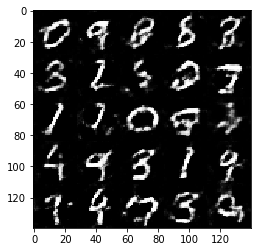

Epoch 1/2... Batch 142/468... Discriminator loss: 1.3170 Generator loss: 0.6889
Epoch 1/2... Batch 152/468... Discriminator loss: 1.2391 Generator loss: 0.8194
Epoch 1/2... Batch 162/468... Discriminator loss: 1.4350 Generator loss: 0.9195
Epoch 1/2... Batch 172/468... Discriminator loss: 1.4016 Generator loss: 0.6460
Epoch 1/2... Batch 182/468... Discriminator loss: 1.3350 Generator loss: 0.6979
Epoch 1/2... Batch 192/468... Discriminator loss: 1.4232 Generator loss: 0.8011



Batches:  43%|███████████████████████████████▌                                          | 200/468 [00:49<01:06,  4.04batch/s]

Epoch 1/2... Batch 202/468... Discriminator loss: 1.5059 Generator loss: 1.2567
Epoch 1/2... Batch 212/468... Discriminator loss: 1.3714 Generator loss: 0.9867
Epoch 1/2... Batch 222/468... Discriminator loss: 1.3557 Generator loss: 1.4190
Epoch 1/2... Batch 232/468... Discriminator loss: 1.3524 Generator loss: 0.9505


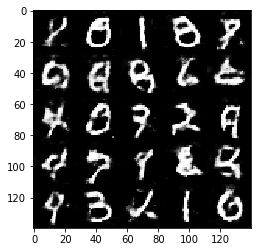

Epoch 1/2... Batch 242/468... Discriminator loss: 1.4540 Generator loss: 0.6657
Epoch 1/2... Batch 252/468... Discriminator loss: 1.3012 Generator loss: 1.1714
Epoch 1/2... Batch 262/468... Discriminator loss: 1.4659 Generator loss: 0.8659
Epoch 1/2... Batch 272/468... Discriminator loss: 1.3775 Generator loss: 1.1010
Epoch 1/2... Batch 282/468... Discriminator loss: 1.2365 Generator loss: 0.8836
Epoch 1/2... Batch 292/468... Discriminator loss: 1.3333 Generator loss: 0.8778



Batches:  64%|███████████████████████████████████████████████▍                          | 300/468 [01:14<00:41,  4.03batch/s]

Epoch 1/2... Batch 302/468... Discriminator loss: 1.2817 Generator loss: 1.0011
Epoch 1/2... Batch 312/468... Discriminator loss: 1.4207 Generator loss: 1.0578
Epoch 1/2... Batch 322/468... Discriminator loss: 1.4541 Generator loss: 0.5665
Epoch 1/2... Batch 332/468... Discriminator loss: 1.3423 Generator loss: 0.7892


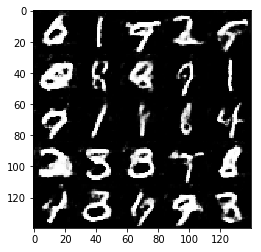

Epoch 1/2... Batch 342/468... Discriminator loss: 1.3868 Generator loss: 0.6084
Epoch 1/2... Batch 352/468... Discriminator loss: 1.3785 Generator loss: 1.1364
Epoch 1/2... Batch 362/468... Discriminator loss: 1.3157 Generator loss: 0.7466
Epoch 1/2... Batch 372/468... Discriminator loss: 1.4727 Generator loss: 1.4169
Epoch 1/2... Batch 382/468... Discriminator loss: 1.4244 Generator loss: 0.7485
Epoch 1/2... Batch 392/468... Discriminator loss: 1.3714 Generator loss: 0.9000



Batches:  85%|███████████████████████████████████████████████████████████████▏          | 400/468 [01:40<00:17,  3.96batch/s]

Epoch 1/2... Batch 402/468... Discriminator loss: 1.4589 Generator loss: 1.1114
Epoch 1/2... Batch 412/468... Discriminator loss: 1.3919 Generator loss: 1.0841
Epoch 1/2... Batch 422/468... Discriminator loss: 1.4290 Generator loss: 0.5822
Epoch 1/2... Batch 432/468... Discriminator loss: 1.4165 Generator loss: 1.2199


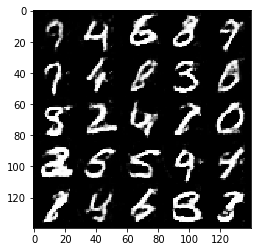

Epoch 1/2... Batch 442/468... Discriminator loss: 1.3519 Generator loss: 0.7808
Epoch 1/2... Batch 452/468... Discriminator loss: 1.3349 Generator loss: 0.8850
Epoch 1/2... Batch 462/468... Discriminator loss: 1.3478 Generator loss: 0.7168



Epochs: 100%|██████████████████████████████████████████████████████████████████████████████| 2/2 [04:00<00:00, 120.68s/epoch]


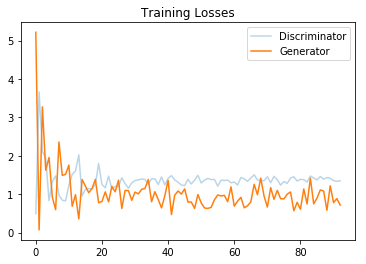

In [17]:
batch_size = 128
z_dim = 100
learning_rate = 0.0005
beta1 = 0.5
alpha = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode, alpha)

Batches:   0%|                                                                                    | 0/468 [00:00<?, ?batch/s]

Epoch 0/2... Batch 10/468... Discriminator loss: 0.5276 Generator loss: 10.8238
Epoch 0/2... Batch 20/468... Discriminator loss: 1.0177 Generator loss: 1.2484
Epoch 0/2... Batch 30/468... Discriminator loss: 0.5807 Generator loss: 5.7405
Epoch 0/2... Batch 40/468... Discriminator loss: 0.8952 Generator loss: 5.8976
Epoch 0/2... Batch 50/468... Discriminator loss: 0.8477 Generator loss: 1.7638
Epoch 0/2... Batch 60/468... Discriminator loss: 0.7665 Generator loss: 3.0581
Epoch 0/2... Batch 70/468... Discriminator loss: 0.3629 Generator loss: 4.9508
Epoch 0/2... Batch 80/468... Discriminator loss: 0.3568 Generator loss: 3.9063
Epoch 0/2... Batch 90/468... Discriminator loss: 0.5071 Generator loss: 2.7326
Epoch 0/2... Batch 100/468... Discriminator loss: 0.4973 Generator loss: 2.2868


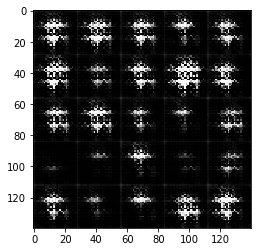


Batches:  21%|███████████████▊                                                          | 100/468 [00:22<01:20,  4.54batch/s]

Epoch 0/2... Batch 110/468... Discriminator loss: 0.3839 Generator loss: 3.4783
Epoch 0/2... Batch 120/468... Discriminator loss: 0.3857 Generator loss: 3.8299
Epoch 0/2... Batch 130/468... Discriminator loss: 0.4355 Generator loss: 3.5925
Epoch 0/2... Batch 140/468... Discriminator loss: 0.4820 Generator loss: 2.3410
Epoch 0/2... Batch 150/468... Discriminator loss: 0.4463 Generator loss: 4.3951
Epoch 0/2... Batch 160/468... Discriminator loss: 0.4444 Generator loss: 2.7295
Epoch 0/2... Batch 170/468... Discriminator loss: 0.5380 Generator loss: 2.7138
Epoch 0/2... Batch 180/468... Discriminator loss: 0.4241 Generator loss: 3.1654
Epoch 0/2... Batch 190/468... Discriminator loss: 0.5436 Generator loss: 2.1707
Epoch 0/2... Batch 200/468... Discriminator loss: 0.3933 Generator loss: 3.9273


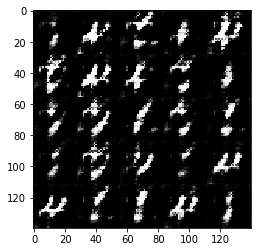


Batches:  43%|███████████████████████████████▌                                          | 200/468 [00:41<00:57,  4.68batch/s]

Epoch 0/2... Batch 210/468... Discriminator loss: 2.4332 Generator loss: 0.2621
Epoch 0/2... Batch 220/468... Discriminator loss: 0.7157 Generator loss: 1.4761
Epoch 0/2... Batch 230/468... Discriminator loss: 0.7007 Generator loss: 1.6344
Epoch 0/2... Batch 240/468... Discriminator loss: 0.7204 Generator loss: 1.5255
Epoch 0/2... Batch 250/468... Discriminator loss: 0.9452 Generator loss: 4.3255
Epoch 0/2... Batch 260/468... Discriminator loss: 0.6209 Generator loss: 2.1056
Epoch 0/2... Batch 270/468... Discriminator loss: 0.6551 Generator loss: 1.6616
Epoch 0/2... Batch 280/468... Discriminator loss: 0.9598 Generator loss: 1.5997
Epoch 0/2... Batch 290/468... Discriminator loss: 0.8146 Generator loss: 3.2394
Epoch 0/2... Batch 300/468... Discriminator loss: 2.2029 Generator loss: 7.5208


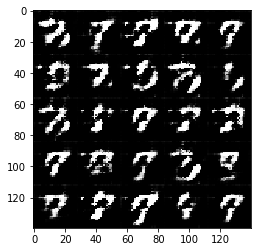


Batches:  64%|███████████████████████████████████████████████▍                          | 300/468 [01:01<00:35,  4.80batch/s]

Epoch 0/2... Batch 310/468... Discriminator loss: 0.6272 Generator loss: 1.8735
Epoch 0/2... Batch 320/468... Discriminator loss: 0.7596 Generator loss: 4.8352
Epoch 0/2... Batch 330/468... Discriminator loss: 0.7281 Generator loss: 2.5624
Epoch 0/2... Batch 340/468... Discriminator loss: 0.7142 Generator loss: 2.2613
Epoch 0/2... Batch 350/468... Discriminator loss: 0.9687 Generator loss: 1.1564
Epoch 0/2... Batch 360/468... Discriminator loss: 0.5931 Generator loss: 1.9618
Epoch 0/2... Batch 370/468... Discriminator loss: 0.6889 Generator loss: 2.1036
Epoch 0/2... Batch 380/468... Discriminator loss: 0.8824 Generator loss: 1.1000
Epoch 0/2... Batch 390/468... Discriminator loss: 1.7783 Generator loss: 0.3899
Epoch 0/2... Batch 400/468... Discriminator loss: 0.6511 Generator loss: 1.6803


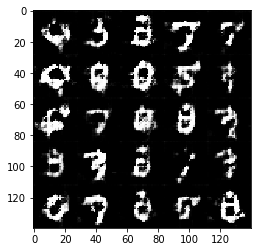


Batches:  85%|███████████████████████████████████████████████████████████████▏          | 400/468 [01:21<00:13,  4.88batch/s]

Epoch 0/2... Batch 410/468... Discriminator loss: 1.5803 Generator loss: 4.7267
Epoch 0/2... Batch 420/468... Discriminator loss: 0.6428 Generator loss: 1.9340
Epoch 0/2... Batch 430/468... Discriminator loss: 0.6856 Generator loss: 4.0463
Epoch 0/2... Batch 440/468... Discriminator loss: 0.5592 Generator loss: 3.1131
Epoch 0/2... Batch 450/468... Discriminator loss: 0.7119 Generator loss: 1.6788
Epoch 0/2... Batch 460/468... Discriminator loss: 0.7463 Generator loss: 2.0135



Batches:   0%|                                                                                    | 0/468 [00:00<?, ?batch/s]

Epoch 1/2... Batch 2/468... Discriminator loss: 0.6756 Generator loss: 1.6750
Epoch 1/2... Batch 12/468... Discriminator loss: 0.6713 Generator loss: 1.9824
Epoch 1/2... Batch 22/468... Discriminator loss: 0.7212 Generator loss: 1.5530
Epoch 1/2... Batch 32/468... Discriminator loss: 0.8256 Generator loss: 1.4590


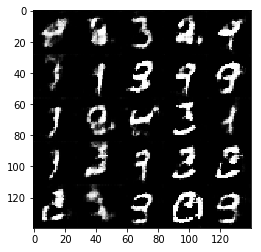

Epoch 1/2... Batch 42/468... Discriminator loss: 0.7885 Generator loss: 1.3726
Epoch 1/2... Batch 52/468... Discriminator loss: 1.2844 Generator loss: 0.8431
Epoch 1/2... Batch 62/468... Discriminator loss: 0.9366 Generator loss: 1.0991
Epoch 1/2... Batch 72/468... Discriminator loss: 0.7430 Generator loss: 1.5047
Epoch 1/2... Batch 82/468... Discriminator loss: 0.7397 Generator loss: 1.9594
Epoch 1/2... Batch 92/468... Discriminator loss: 0.7495 Generator loss: 1.3729



Batches:  21%|███████████████▊                                                          | 100/468 [00:19<01:12,  5.08batch/s]

Epoch 1/2... Batch 102/468... Discriminator loss: 0.7066 Generator loss: 1.8430
Epoch 1/2... Batch 112/468... Discriminator loss: 0.7678 Generator loss: 1.5486
Epoch 1/2... Batch 122/468... Discriminator loss: 0.8085 Generator loss: 1.5926
Epoch 1/2... Batch 132/468... Discriminator loss: 0.6200 Generator loss: 1.8569


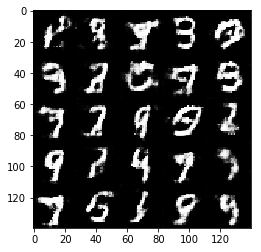

Epoch 1/2... Batch 142/468... Discriminator loss: 0.6432 Generator loss: 2.1480
Epoch 1/2... Batch 152/468... Discriminator loss: 0.9398 Generator loss: 2.8467
Epoch 1/2... Batch 162/468... Discriminator loss: 0.8252 Generator loss: 2.0909
Epoch 1/2... Batch 172/468... Discriminator loss: 1.4719 Generator loss: 0.5931
Epoch 1/2... Batch 182/468... Discriminator loss: 0.6010 Generator loss: 2.8173
Epoch 1/2... Batch 192/468... Discriminator loss: 0.9052 Generator loss: 1.3625



Batches:  43%|███████████████████████████████▌                                          | 200/468 [00:39<00:53,  5.04batch/s]

Epoch 1/2... Batch 202/468... Discriminator loss: 0.6683 Generator loss: 1.5380
Epoch 1/2... Batch 212/468... Discriminator loss: 0.8407 Generator loss: 2.0896
Epoch 1/2... Batch 222/468... Discriminator loss: 0.5841 Generator loss: 1.8311
Epoch 1/2... Batch 232/468... Discriminator loss: 0.8387 Generator loss: 1.3967


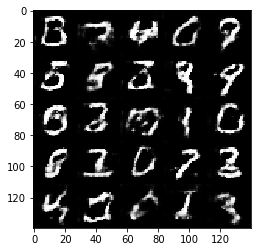

Epoch 1/2... Batch 242/468... Discriminator loss: 0.8252 Generator loss: 2.7298
Epoch 1/2... Batch 252/468... Discriminator loss: 0.8804 Generator loss: 1.0784
Epoch 1/2... Batch 262/468... Discriminator loss: 0.9078 Generator loss: 1.1657
Epoch 1/2... Batch 272/468... Discriminator loss: 0.7571 Generator loss: 1.7382
Epoch 1/2... Batch 282/468... Discriminator loss: 0.8183 Generator loss: 2.4915
Epoch 1/2... Batch 292/468... Discriminator loss: 0.7935 Generator loss: 1.2919



Batches:  64%|███████████████████████████████████████████████▍                          | 300/468 [00:59<00:33,  5.03batch/s]

Epoch 1/2... Batch 302/468... Discriminator loss: 0.7288 Generator loss: 1.3625
Epoch 1/2... Batch 312/468... Discriminator loss: 0.8608 Generator loss: 1.8315
Epoch 1/2... Batch 322/468... Discriminator loss: 0.7261 Generator loss: 1.5596
Epoch 1/2... Batch 332/468... Discriminator loss: 0.9134 Generator loss: 2.4081


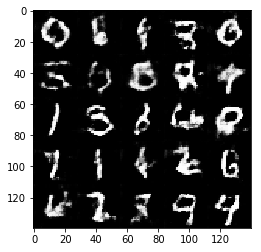

Epoch 1/2... Batch 342/468... Discriminator loss: 0.8954 Generator loss: 2.9678
Epoch 1/2... Batch 352/468... Discriminator loss: 0.6479 Generator loss: 1.7159
Epoch 1/2... Batch 362/468... Discriminator loss: 1.0429 Generator loss: 0.9280
Epoch 1/2... Batch 372/468... Discriminator loss: 0.6682 Generator loss: 1.6983
Epoch 1/2... Batch 382/468... Discriminator loss: 0.7471 Generator loss: 1.3952
Epoch 1/2... Batch 392/468... Discriminator loss: 0.7271 Generator loss: 2.3171



Batches:  85%|███████████████████████████████████████████████████████████████▏          | 400/468 [01:20<00:13,  5.01batch/s]

Epoch 1/2... Batch 402/468... Discriminator loss: 0.9929 Generator loss: 0.9491
Epoch 1/2... Batch 412/468... Discriminator loss: 0.7145 Generator loss: 1.8250
Epoch 1/2... Batch 422/468... Discriminator loss: 1.1318 Generator loss: 3.4888
Epoch 1/2... Batch 432/468... Discriminator loss: 1.7643 Generator loss: 0.3674


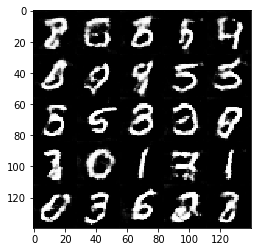

Epoch 1/2... Batch 442/468... Discriminator loss: 0.9126 Generator loss: 1.2251
Epoch 1/2... Batch 452/468... Discriminator loss: 0.8201 Generator loss: 1.1317
Epoch 1/2... Batch 462/468... Discriminator loss: 0.6605 Generator loss: 1.4213



Epochs: 100%|███████████████████████████████████████████████████████████████████████████████| 2/2 [03:08<00:00, 94.05s/epoch]


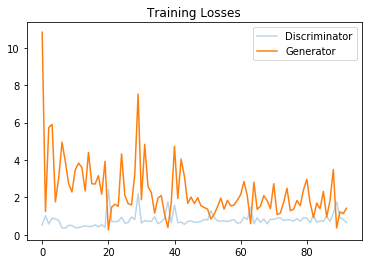

In [22]:
batch_size = 128
z_dim = 100
learning_rate = 0.0005
beta1 = 0.5
alpha = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode, alpha)

Batches:   0%|                                                                                    | 0/468 [00:00<?, ?batch/s]

Epoch 0/2... Batch 10/468... Discriminator loss: 0.7584 Generator loss: 5.3699
Epoch 0/2... Batch 20/468... Discriminator loss: 2.4666 Generator loss: 0.1406
Epoch 0/2... Batch 30/468... Discriminator loss: 0.7925 Generator loss: 9.4287
Epoch 0/2... Batch 40/468... Discriminator loss: 0.3795 Generator loss: 5.9584
Epoch 0/2... Batch 50/468... Discriminator loss: 1.1000 Generator loss: 7.2505
Epoch 0/2... Batch 60/468... Discriminator loss: 0.5541 Generator loss: 1.9540
Epoch 0/2... Batch 70/468... Discriminator loss: 0.3851 Generator loss: 3.4890
Epoch 0/2... Batch 80/468... Discriminator loss: 0.3647 Generator loss: 4.8026
Epoch 0/2... Batch 90/468... Discriminator loss: 0.8181 Generator loss: 4.4051
Epoch 0/2... Batch 100/468... Discriminator loss: 0.3786 Generator loss: 3.2881


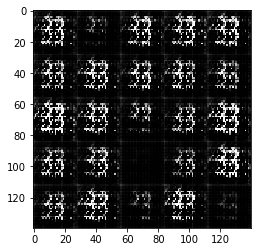


Batches:  21%|███████████████▊                                                          | 100/468 [00:20<01:14,  4.92batch/s]

Epoch 0/2... Batch 110/468... Discriminator loss: 0.6666 Generator loss: 3.8737
Epoch 0/2... Batch 120/468... Discriminator loss: 0.4387 Generator loss: 4.7143
Epoch 0/2... Batch 130/468... Discriminator loss: 0.4404 Generator loss: 6.0495
Epoch 0/2... Batch 140/468... Discriminator loss: 0.4357 Generator loss: 2.7544
Epoch 0/2... Batch 150/468... Discriminator loss: 0.4340 Generator loss: 2.8882
Epoch 0/2... Batch 160/468... Discriminator loss: 0.4734 Generator loss: 2.4464
Epoch 0/2... Batch 170/468... Discriminator loss: 7.0410 Generator loss: 15.2464
Epoch 0/2... Batch 180/468... Discriminator loss: 0.4642 Generator loss: 2.6732
Epoch 0/2... Batch 190/468... Discriminator loss: 0.4217 Generator loss: 3.1814
Epoch 0/2... Batch 200/468... Discriminator loss: 0.4918 Generator loss: 2.6954


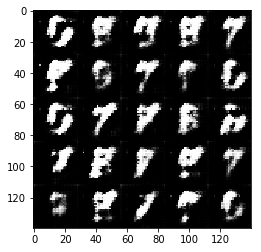


Batches:  43%|███████████████████████████████▌                                          | 200/468 [00:40<00:54,  4.95batch/s]

Epoch 0/2... Batch 210/468... Discriminator loss: 0.5584 Generator loss: 3.4729
Epoch 0/2... Batch 220/468... Discriminator loss: 0.6305 Generator loss: 2.4347
Epoch 0/2... Batch 230/468... Discriminator loss: 0.9001 Generator loss: 1.1609
Epoch 0/2... Batch 240/468... Discriminator loss: 1.5594 Generator loss: 6.5427
Epoch 0/2... Batch 250/468... Discriminator loss: 0.9797 Generator loss: 0.9831
Epoch 0/2... Batch 260/468... Discriminator loss: 0.6784 Generator loss: 4.0941
Epoch 0/2... Batch 270/468... Discriminator loss: 0.4329 Generator loss: 3.0066
Epoch 0/2... Batch 280/468... Discriminator loss: 1.8726 Generator loss: 0.3089
Epoch 0/2... Batch 290/468... Discriminator loss: 0.5775 Generator loss: 1.7169
Epoch 0/2... Batch 300/468... Discriminator loss: 0.5392 Generator loss: 3.3023


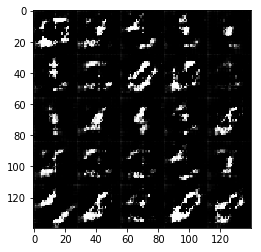


Batches:  64%|███████████████████████████████████████████████▍                          | 300/468 [01:00<00:34,  4.91batch/s]

Epoch 0/2... Batch 310/468... Discriminator loss: 0.6047 Generator loss: 2.4730
Epoch 0/2... Batch 320/468... Discriminator loss: 0.5821 Generator loss: 2.4009
Epoch 0/2... Batch 330/468... Discriminator loss: 0.6764 Generator loss: 1.9864
Epoch 0/2... Batch 340/468... Discriminator loss: 0.6248 Generator loss: 1.9350
Epoch 0/2... Batch 350/468... Discriminator loss: 1.5239 Generator loss: 5.7388
Epoch 0/2... Batch 360/468... Discriminator loss: 0.5757 Generator loss: 4.9555
Epoch 0/2... Batch 370/468... Discriminator loss: 0.6897 Generator loss: 1.5312
Epoch 0/2... Batch 380/468... Discriminator loss: 0.6811 Generator loss: 1.6997
Epoch 0/2... Batch 390/468... Discriminator loss: 0.8400 Generator loss: 1.1727
Epoch 0/2... Batch 400/468... Discriminator loss: 0.5180 Generator loss: 2.4307


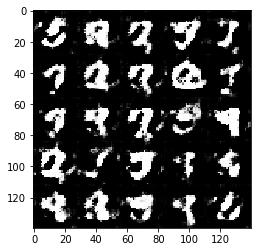


Batches:  85%|███████████████████████████████████████████████████████████████▏          | 400/468 [01:20<00:13,  4.94batch/s]

Epoch 0/2... Batch 410/468... Discriminator loss: 0.5190 Generator loss: 2.9903
Epoch 0/2... Batch 420/468... Discriminator loss: 0.5891 Generator loss: 3.1763
Epoch 0/2... Batch 430/468... Discriminator loss: 0.6481 Generator loss: 3.1068
Epoch 0/2... Batch 440/468... Discriminator loss: 0.5761 Generator loss: 2.2517
Epoch 0/2... Batch 450/468... Discriminator loss: 0.6628 Generator loss: 2.8256
Epoch 0/2... Batch 460/468... Discriminator loss: 0.8552 Generator loss: 1.7399



Batches:   0%|                                                                                    | 0/468 [00:00<?, ?batch/s]

Epoch 1/2... Batch 2/468... Discriminator loss: 1.0100 Generator loss: 0.9066
Epoch 1/2... Batch 12/468... Discriminator loss: 1.0526 Generator loss: 0.8518
Epoch 1/2... Batch 22/468... Discriminator loss: 0.9181 Generator loss: 3.4657
Epoch 1/2... Batch 32/468... Discriminator loss: 1.5789 Generator loss: 5.5238


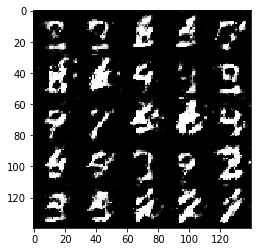

Epoch 1/2... Batch 42/468... Discriminator loss: 0.8977 Generator loss: 1.4499
Epoch 1/2... Batch 52/468... Discriminator loss: 1.0191 Generator loss: 0.9333
Epoch 1/2... Batch 62/468... Discriminator loss: 0.8390 Generator loss: 1.2505
Epoch 1/2... Batch 72/468... Discriminator loss: 1.1070 Generator loss: 0.7947
Epoch 1/2... Batch 82/468... Discriminator loss: 0.9064 Generator loss: 1.5993
Epoch 1/2... Batch 92/468... Discriminator loss: 0.7911 Generator loss: 1.2271



Batches:  21%|███████████████▊                                                          | 100/468 [00:20<01:13,  4.98batch/s]

Epoch 1/2... Batch 102/468... Discriminator loss: 0.7456 Generator loss: 1.7411
Epoch 1/2... Batch 112/468... Discriminator loss: 0.8794 Generator loss: 1.4272
Epoch 1/2... Batch 122/468... Discriminator loss: 0.6905 Generator loss: 1.6899
Epoch 1/2... Batch 132/468... Discriminator loss: 1.0722 Generator loss: 3.5763


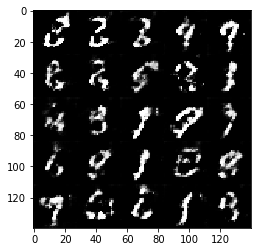

Epoch 1/2... Batch 142/468... Discriminator loss: 0.6383 Generator loss: 2.2431
Epoch 1/2... Batch 152/468... Discriminator loss: 0.7829 Generator loss: 1.4601
Epoch 1/2... Batch 162/468... Discriminator loss: 0.8069 Generator loss: 2.8708
Epoch 1/2... Batch 172/468... Discriminator loss: 0.6609 Generator loss: 1.5603
Epoch 1/2... Batch 182/468... Discriminator loss: 0.9668 Generator loss: 2.5131
Epoch 1/2... Batch 192/468... Discriminator loss: 1.4495 Generator loss: 0.5064



Batches:  43%|███████████████████████████████▌                                          | 200/468 [00:40<00:53,  4.98batch/s]

Epoch 1/2... Batch 202/468... Discriminator loss: 0.8030 Generator loss: 2.0905
Epoch 1/2... Batch 212/468... Discriminator loss: 0.8394 Generator loss: 1.1999
Epoch 1/2... Batch 222/468... Discriminator loss: 0.9862 Generator loss: 4.0008
Epoch 1/2... Batch 232/468... Discriminator loss: 0.7629 Generator loss: 1.8467


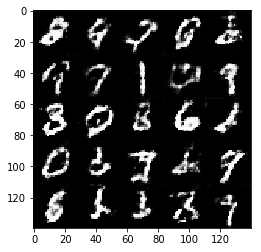

Epoch 1/2... Batch 242/468... Discriminator loss: 1.0034 Generator loss: 0.9496
Epoch 1/2... Batch 252/468... Discriminator loss: 0.6394 Generator loss: 2.2811
Epoch 1/2... Batch 262/468... Discriminator loss: 0.6896 Generator loss: 1.8187
Epoch 1/2... Batch 272/468... Discriminator loss: 0.8042 Generator loss: 1.2310
Epoch 1/2... Batch 282/468... Discriminator loss: 0.7960 Generator loss: 1.1436
Epoch 1/2... Batch 292/468... Discriminator loss: 0.7128 Generator loss: 2.2498



Batches:  64%|███████████████████████████████████████████████▍                          | 300/468 [01:00<00:33,  4.99batch/s]

Epoch 1/2... Batch 302/468... Discriminator loss: 0.6518 Generator loss: 1.6324
Epoch 1/2... Batch 312/468... Discriminator loss: 0.7013 Generator loss: 2.5271
Epoch 1/2... Batch 322/468... Discriminator loss: 0.5737 Generator loss: 2.1479
Epoch 1/2... Batch 332/468... Discriminator loss: 0.7269 Generator loss: 2.3438


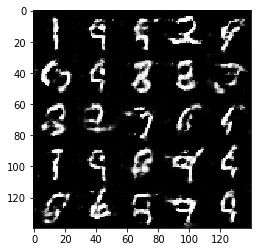

Epoch 1/2... Batch 342/468... Discriminator loss: 0.8191 Generator loss: 1.5248
Epoch 1/2... Batch 352/468... Discriminator loss: 0.9399 Generator loss: 2.2151
Epoch 1/2... Batch 362/468... Discriminator loss: 0.8059 Generator loss: 1.3084
Epoch 1/2... Batch 372/468... Discriminator loss: 0.5668 Generator loss: 1.8334
Epoch 1/2... Batch 382/468... Discriminator loss: 0.8233 Generator loss: 1.4171
Epoch 1/2... Batch 392/468... Discriminator loss: 0.7969 Generator loss: 1.7458



Batches:  85%|███████████████████████████████████████████████████████████████▏          | 400/468 [01:20<00:13,  4.96batch/s]

Epoch 1/2... Batch 402/468... Discriminator loss: 0.7962 Generator loss: 1.1681
Epoch 1/2... Batch 412/468... Discriminator loss: 0.8426 Generator loss: 3.0582
Epoch 1/2... Batch 422/468... Discriminator loss: 1.6311 Generator loss: 4.6694
Epoch 1/2... Batch 432/468... Discriminator loss: 0.8622 Generator loss: 1.0784


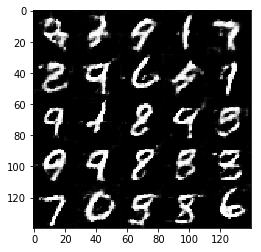

Epoch 1/2... Batch 442/468... Discriminator loss: 0.9384 Generator loss: 0.9152
Epoch 1/2... Batch 452/468... Discriminator loss: 0.7424 Generator loss: 1.6608
Epoch 1/2... Batch 462/468... Discriminator loss: 0.6075 Generator loss: 1.9043



Epochs: 100%|███████████████████████████████████████████████████████████████████████████████| 2/2 [03:08<00:00, 94.37s/epoch]


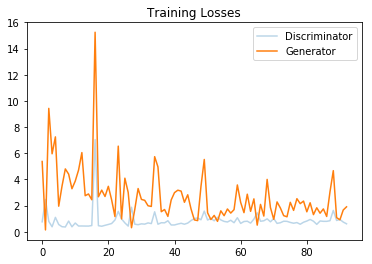

In [24]:
batch_size = 128
z_dim = 200
learning_rate = 0.0005
beta1 = 0.5
alpha = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode, alpha)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

In [ ]:
batch_size = 128
z_dim = 100
learning_rate = 0.0005
beta1 = 0.5
alpha = 0.2
# Generator Losses seem ok, but faces generated are bad

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode, alpha)

In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.0005
beta1 = 0.5
alpha = 0.2
# Generator Losses seem ok, but faces generated are bad

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode, alpha)

In [ ]:
batch_size = 32
z_dim = 100
learning_rate = 0.0005
beta1 = 0.5
alpha = 0.2
# Generator Losses seem ok, but faces generated are bad

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode, alpha)

In [ ]:
batch_size = 32
z_dim = 200 # Try doubling from earlier attempt of 100
learning_rate = 0.0005
beta1 = 0.5
alpha = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode, alpha)

In [ ]:
batch_size = 256
z_dim = 200
learning_rate = 0.01 # too high
beta1 = 0.5
alpha = 0.2
# Generator Losses jumping around too much. Batch size and learning rate seem too high to be stable. Faces are too noisy

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode, alpha)

In [ ]:
batch_size = 32
z_dim = 200
learning_rate = 0.001
beta1 = 0.5
alpha = 0.2
# the visuals on batch 6300 randomly looks acceptable, but unable to get similar results on second run
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode, alpha)

In [ ]:
batch_size = 32
z_dim = 200
learning_rate = 0.001
beta1 = 0.5
alpha = 0.2
# unable to match the visuals of the previous run for some reason

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode, alpha)

In [ ]:
batch_size = 32
z_dim = 200
learning_rate = 0.001
beta1 = 0.3 # the losses seem to vary less, but the visuals are still bad
alpha = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode, alpha)

Batches:   0%|                                                                                   | 0/6331 [00:00<?, ?batch/s]

Epoch 0/1... Batch 10/6331... Discriminator loss: 1.3399 Generator loss: 0.8201
Epoch 0/1... Batch 20/6331... Discriminator loss: 1.7324 Generator loss: 0.5476
Epoch 0/1... Batch 30/6331... Discriminator loss: 0.4606 Generator loss: 7.9876
Epoch 0/1... Batch 40/6331... Discriminator loss: 0.5260 Generator loss: 1.8396
Epoch 0/1... Batch 50/6331... Discriminator loss: 0.5830 Generator loss: 1.6320
Epoch 0/1... Batch 60/6331... Discriminator loss: 0.4227 Generator loss: 2.7862
Epoch 0/1... Batch 70/6331... Discriminator loss: 1.1404 Generator loss: 1.4142
Epoch 0/1... Batch 80/6331... Discriminator loss: 0.4953 Generator loss: 5.5921
Epoch 0/1... Batch 90/6331... Discriminator loss: 0.6212 Generator loss: 1.7884
Epoch 0/1... Batch 100/6331... Discriminator loss: 0.5745 Generator loss: 1.8452


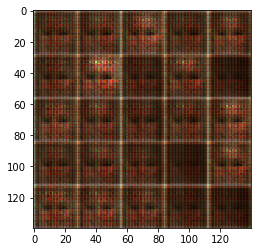


Batches:   2%|█▏                                                                       | 100/6331 [00:12<12:50,  8.09batch/s]

Epoch 0/1... Batch 110/6331... Discriminator loss: 0.3999 Generator loss: 3.1606
Epoch 0/1... Batch 120/6331... Discriminator loss: 0.3787 Generator loss: 4.9515
Epoch 0/1... Batch 130/6331... Discriminator loss: 0.3696 Generator loss: 4.2922
Epoch 0/1... Batch 140/6331... Discriminator loss: 0.3825 Generator loss: 3.3286
Epoch 0/1... Batch 150/6331... Discriminator loss: 0.3594 Generator loss: 5.2996
Epoch 0/1... Batch 160/6331... Discriminator loss: 1.1174 Generator loss: 7.4443
Epoch 0/1... Batch 170/6331... Discriminator loss: 0.4364 Generator loss: 2.7905
Epoch 0/1... Batch 180/6331... Discriminator loss: 0.4557 Generator loss: 2.5275
Epoch 0/1... Batch 190/6331... Discriminator loss: 0.3613 Generator loss: 4.1048
Epoch 0/1... Batch 200/6331... Discriminator loss: 0.3859 Generator loss: 3.1666


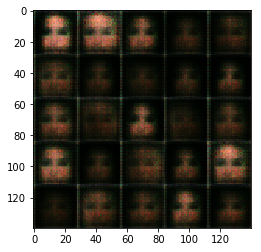


Batches:   3%|██▎                                                                      | 200/6331 [00:23<12:12,  8.37batch/s]

Epoch 0/1... Batch 210/6331... Discriminator loss: 0.4046 Generator loss: 3.5839
Epoch 0/1... Batch 220/6331... Discriminator loss: 0.7993 Generator loss: 1.5176
Epoch 0/1... Batch 230/6331... Discriminator loss: 0.5420 Generator loss: 2.0776
Epoch 0/1... Batch 240/6331... Discriminator loss: 0.4922 Generator loss: 2.3912
Epoch 0/1... Batch 250/6331... Discriminator loss: 0.4466 Generator loss: 4.4218
Epoch 0/1... Batch 260/6331... Discriminator loss: 0.6795 Generator loss: 4.0858
Epoch 0/1... Batch 270/6331... Discriminator loss: 0.4289 Generator loss: 2.8344
Epoch 0/1... Batch 280/6331... Discriminator loss: 0.7438 Generator loss: 2.1600
Epoch 0/1... Batch 290/6331... Discriminator loss: 0.7362 Generator loss: 1.3963
Epoch 0/1... Batch 300/6331... Discriminator loss: 0.8630 Generator loss: 1.3884


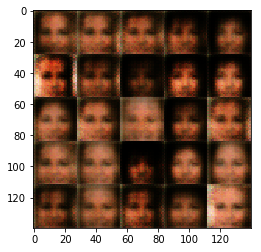


Batches:   5%|███▍                                                                     | 300/6331 [00:34<11:43,  8.58batch/s]

Epoch 0/1... Batch 310/6331... Discriminator loss: 0.4948 Generator loss: 2.2962
Epoch 0/1... Batch 320/6331... Discriminator loss: 1.0603 Generator loss: 3.8882
Epoch 0/1... Batch 330/6331... Discriminator loss: 0.4822 Generator loss: 2.1831
Epoch 0/1... Batch 340/6331... Discriminator loss: 1.2499 Generator loss: 1.1377
Epoch 0/1... Batch 350/6331... Discriminator loss: 0.6824 Generator loss: 2.6157
Epoch 0/1... Batch 360/6331... Discriminator loss: 0.5520 Generator loss: 1.7594
Epoch 0/1... Batch 370/6331... Discriminator loss: 0.8230 Generator loss: 1.1003
Epoch 0/1... Batch 380/6331... Discriminator loss: 0.5146 Generator loss: 2.4558
Epoch 0/1... Batch 390/6331... Discriminator loss: 0.7344 Generator loss: 2.2673
Epoch 0/1... Batch 400/6331... Discriminator loss: 0.6648 Generator loss: 1.6166


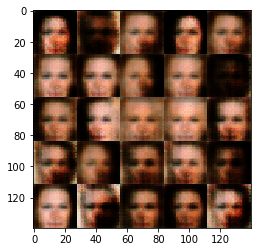


Batches:   6%|████▌                                                                    | 400/6331 [00:45<11:26,  8.64batch/s]

Epoch 0/1... Batch 410/6331... Discriminator loss: 0.5728 Generator loss: 3.8634
Epoch 0/1... Batch 420/6331... Discriminator loss: 0.4544 Generator loss: 2.2667
Epoch 0/1... Batch 430/6331... Discriminator loss: 0.9136 Generator loss: 1.2976
Epoch 0/1... Batch 440/6331... Discriminator loss: 0.4538 Generator loss: 2.6339
Epoch 0/1... Batch 450/6331... Discriminator loss: 0.4440 Generator loss: 4.3567
Epoch 0/1... Batch 460/6331... Discriminator loss: 0.8331 Generator loss: 1.0553
Epoch 0/1... Batch 470/6331... Discriminator loss: 1.6684 Generator loss: 0.4799
Epoch 0/1... Batch 480/6331... Discriminator loss: 0.4322 Generator loss: 2.7221
Epoch 0/1... Batch 490/6331... Discriminator loss: 1.7628 Generator loss: 0.4119
Epoch 0/1... Batch 500/6331... Discriminator loss: 0.5308 Generator loss: 2.8949


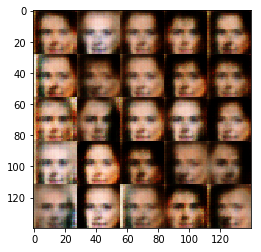


Batches:   8%|█████▊                                                                   | 500/6331 [00:56<11:07,  8.73batch/s]

Epoch 0/1... Batch 510/6331... Discriminator loss: 0.7422 Generator loss: 1.4412
Epoch 0/1... Batch 520/6331... Discriminator loss: 0.9265 Generator loss: 1.1043
Epoch 0/1... Batch 530/6331... Discriminator loss: 1.2777 Generator loss: 0.5277
Epoch 0/1... Batch 540/6331... Discriminator loss: 1.2112 Generator loss: 0.7035
Epoch 0/1... Batch 550/6331... Discriminator loss: 0.5854 Generator loss: 3.4242
Epoch 0/1... Batch 560/6331... Discriminator loss: 0.5445 Generator loss: 2.0334
Epoch 0/1... Batch 570/6331... Discriminator loss: 0.3793 Generator loss: 4.0881
Epoch 0/1... Batch 580/6331... Discriminator loss: 0.3905 Generator loss: 3.9913
Epoch 0/1... Batch 590/6331... Discriminator loss: 0.6084 Generator loss: 1.5713
Epoch 0/1... Batch 600/6331... Discriminator loss: 0.7322 Generator loss: 1.5915


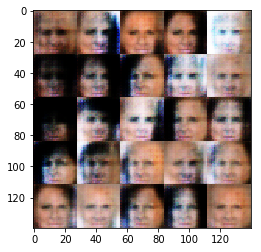


Batches:   9%|██████▉                                                                  | 600/6331 [01:07<10:46,  8.86batch/s]

Epoch 0/1... Batch 610/6331... Discriminator loss: 0.5570 Generator loss: 1.9873
Epoch 0/1... Batch 620/6331... Discriminator loss: 1.3361 Generator loss: 0.6153
Epoch 0/1... Batch 630/6331... Discriminator loss: 0.4961 Generator loss: 3.0143
Epoch 0/1... Batch 640/6331... Discriminator loss: 0.8167 Generator loss: 1.1314
Epoch 0/1... Batch 650/6331... Discriminator loss: 0.6060 Generator loss: 1.7704
Epoch 0/1... Batch 660/6331... Discriminator loss: 0.6252 Generator loss: 2.3136
Epoch 0/1... Batch 670/6331... Discriminator loss: 0.4755 Generator loss: 2.8615
Epoch 0/1... Batch 680/6331... Discriminator loss: 0.9380 Generator loss: 0.8419
Epoch 0/1... Batch 690/6331... Discriminator loss: 0.7433 Generator loss: 2.1497
Epoch 0/1... Batch 700/6331... Discriminator loss: 0.7084 Generator loss: 1.4705


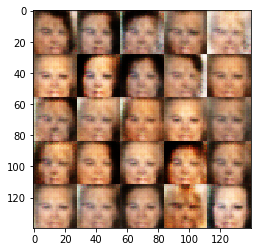


Batches:  11%|████████                                                                 | 700/6331 [01:18<10:28,  8.96batch/s]

Epoch 0/1... Batch 710/6331... Discriminator loss: 0.9542 Generator loss: 0.9641
Epoch 0/1... Batch 720/6331... Discriminator loss: 0.4453 Generator loss: 3.9180
Epoch 0/1... Batch 730/6331... Discriminator loss: 0.7692 Generator loss: 1.2428
Epoch 0/1... Batch 740/6331... Discriminator loss: 0.8664 Generator loss: 1.0745
Epoch 0/1... Batch 750/6331... Discriminator loss: 0.7762 Generator loss: 2.5294
Epoch 0/1... Batch 760/6331... Discriminator loss: 0.6493 Generator loss: 1.5316
Epoch 0/1... Batch 770/6331... Discriminator loss: 0.7837 Generator loss: 1.1296
Epoch 0/1... Batch 780/6331... Discriminator loss: 1.2631 Generator loss: 0.5484
Epoch 0/1... Batch 790/6331... Discriminator loss: 0.9297 Generator loss: 4.1023
Epoch 0/1... Batch 800/6331... Discriminator loss: 0.5754 Generator loss: 1.9185


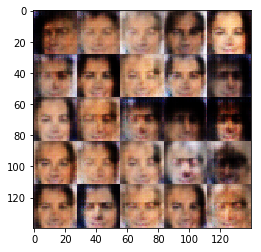


Batches:  13%|█████████▏                                                               | 800/6331 [01:29<10:11,  9.04batch/s]

Epoch 0/1... Batch 810/6331... Discriminator loss: 0.6122 Generator loss: 1.9736
Epoch 0/1... Batch 820/6331... Discriminator loss: 1.0947 Generator loss: 0.7583
Epoch 0/1... Batch 830/6331... Discriminator loss: 0.5479 Generator loss: 2.5456
Epoch 0/1... Batch 840/6331... Discriminator loss: 0.6045 Generator loss: 1.5696
Epoch 0/1... Batch 850/6331... Discriminator loss: 0.8806 Generator loss: 1.1927
Epoch 0/1... Batch 860/6331... Discriminator loss: 1.6714 Generator loss: 0.5306
Epoch 0/1... Batch 870/6331... Discriminator loss: 0.5434 Generator loss: 2.0589
Epoch 0/1... Batch 880/6331... Discriminator loss: 0.6066 Generator loss: 1.8839
Epoch 0/1... Batch 890/6331... Discriminator loss: 0.5937 Generator loss: 1.7419
Epoch 0/1... Batch 900/6331... Discriminator loss: 0.8920 Generator loss: 0.8315


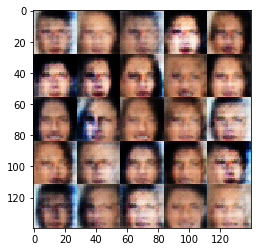


Batches:  14%|██████████▍                                                              | 900/6331 [01:40<09:57,  9.09batch/s]

Epoch 0/1... Batch 910/6331... Discriminator loss: 0.5782 Generator loss: 1.9868
Epoch 0/1... Batch 920/6331... Discriminator loss: 1.6091 Generator loss: 0.5713
Epoch 0/1... Batch 930/6331... Discriminator loss: 0.8062 Generator loss: 1.2248
Epoch 0/1... Batch 940/6331... Discriminator loss: 0.8487 Generator loss: 1.3096
Epoch 0/1... Batch 950/6331... Discriminator loss: 0.7124 Generator loss: 2.1348
Epoch 0/1... Batch 960/6331... Discriminator loss: 0.8506 Generator loss: 2.8392
Epoch 0/1... Batch 970/6331... Discriminator loss: 0.6243 Generator loss: 1.9277
Epoch 0/1... Batch 980/6331... Discriminator loss: 0.6502 Generator loss: 3.0228
Epoch 0/1... Batch 990/6331... Discriminator loss: 0.7986 Generator loss: 3.0111
Epoch 0/1... Batch 1000/6331... Discriminator loss: 0.5021 Generator loss: 2.3844


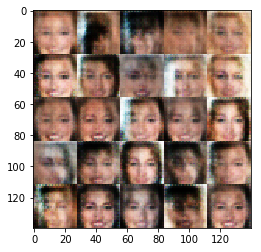


Batches:  16%|███████████▎                                                            | 1000/6331 [01:51<09:46,  9.09batch/s]

Epoch 0/1... Batch 1010/6331... Discriminator loss: 0.6071 Generator loss: 1.7495
Epoch 0/1... Batch 1020/6331... Discriminator loss: 0.6435 Generator loss: 2.5302
Epoch 0/1... Batch 1030/6331... Discriminator loss: 1.2643 Generator loss: 0.5937
Epoch 0/1... Batch 1040/6331... Discriminator loss: 0.5832 Generator loss: 1.8866
Epoch 0/1... Batch 1050/6331... Discriminator loss: 0.9997 Generator loss: 1.0539
Epoch 0/1... Batch 1060/6331... Discriminator loss: 0.7799 Generator loss: 2.3912
Epoch 0/1... Batch 1070/6331... Discriminator loss: 0.9553 Generator loss: 3.5443
Epoch 0/1... Batch 1080/6331... Discriminator loss: 0.9341 Generator loss: 1.3069
Epoch 0/1... Batch 1090/6331... Discriminator loss: 1.4214 Generator loss: 0.5124
Epoch 0/1... Batch 1100/6331... Discriminator loss: 0.6513 Generator loss: 1.6817


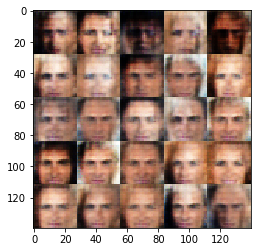


Batches:  17%|████████████▌                                                           | 1100/6331 [02:02<09:35,  9.08batch/s]

Epoch 0/1... Batch 1110/6331... Discriminator loss: 0.7418 Generator loss: 1.1582
Epoch 0/1... Batch 1120/6331... Discriminator loss: 0.6077 Generator loss: 1.8280
Epoch 0/1... Batch 1130/6331... Discriminator loss: 1.6208 Generator loss: 0.7185
Epoch 0/1... Batch 1140/6331... Discriminator loss: 1.0229 Generator loss: 1.0754
Epoch 0/1... Batch 1150/6331... Discriminator loss: 1.2386 Generator loss: 0.6059
Epoch 0/1... Batch 1160/6331... Discriminator loss: 0.7048 Generator loss: 1.1147
Epoch 0/1... Batch 1170/6331... Discriminator loss: 1.2748 Generator loss: 0.7618
Epoch 0/1... Batch 1180/6331... Discriminator loss: 0.7714 Generator loss: 1.1212
Epoch 0/1... Batch 1190/6331... Discriminator loss: 0.5834 Generator loss: 1.7622
Epoch 0/1... Batch 1200/6331... Discriminator loss: 0.9400 Generator loss: 0.9693


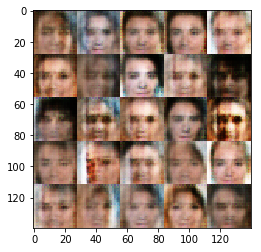


Batches:  19%|█████████████▋                                                          | 1200/6331 [02:13<09:25,  9.07batch/s]

Epoch 0/1... Batch 1210/6331... Discriminator loss: 0.5645 Generator loss: 1.8660
Epoch 0/1... Batch 1220/6331... Discriminator loss: 0.6644 Generator loss: 1.4485
Epoch 0/1... Batch 1230/6331... Discriminator loss: 0.5334 Generator loss: 2.0233
Epoch 0/1... Batch 1240/6331... Discriminator loss: 0.5202 Generator loss: 2.1065
Epoch 0/1... Batch 1250/6331... Discriminator loss: 0.8654 Generator loss: 1.1466
Epoch 0/1... Batch 1260/6331... Discriminator loss: 0.6396 Generator loss: 1.7044
Epoch 0/1... Batch 1270/6331... Discriminator loss: 0.8279 Generator loss: 4.0180
Epoch 0/1... Batch 1280/6331... Discriminator loss: 0.5184 Generator loss: 3.8743
Epoch 0/1... Batch 1290/6331... Discriminator loss: 0.7301 Generator loss: 1.2180
Epoch 0/1... Batch 1300/6331... Discriminator loss: 0.6293 Generator loss: 4.0534


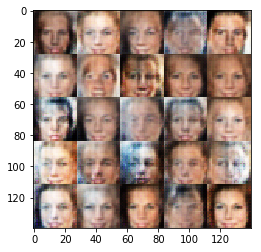


Batches:  21%|██████████████▊                                                         | 1300/6331 [02:25<09:27,  8.87batch/s]

Epoch 0/1... Batch 1310/6331... Discriminator loss: 0.7072 Generator loss: 1.1239
Epoch 0/1... Batch 1320/6331... Discriminator loss: 0.9030 Generator loss: 1.3191
Epoch 0/1... Batch 1330/6331... Discriminator loss: 0.6332 Generator loss: 1.2752
Epoch 0/1... Batch 1340/6331... Discriminator loss: 0.6149 Generator loss: 1.8901
Epoch 0/1... Batch 1350/6331... Discriminator loss: 0.6175 Generator loss: 1.3921
Epoch 0/1... Batch 1360/6331... Discriminator loss: 0.4925 Generator loss: 1.8274
Epoch 0/1... Batch 1370/6331... Discriminator loss: 0.5729 Generator loss: 1.6913
Epoch 0/1... Batch 1380/6331... Discriminator loss: 0.8239 Generator loss: 1.1046
Epoch 0/1... Batch 1390/6331... Discriminator loss: 0.6580 Generator loss: 2.0334
Epoch 0/1... Batch 1400/6331... Discriminator loss: 0.5673 Generator loss: 2.2493


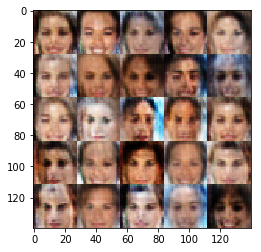


Batches:  22%|███████████████▉                                                        | 1400/6331 [02:36<09:13,  8.91batch/s]

Epoch 0/1... Batch 1410/6331... Discriminator loss: 0.6216 Generator loss: 3.3947
Epoch 0/1... Batch 1420/6331... Discriminator loss: 0.5101 Generator loss: 2.1963
Epoch 0/1... Batch 1430/6331... Discriminator loss: 0.5395 Generator loss: 1.9143
Epoch 0/1... Batch 1440/6331... Discriminator loss: 0.6097 Generator loss: 1.7751
Epoch 0/1... Batch 1450/6331... Discriminator loss: 0.5621 Generator loss: 2.5885
Epoch 0/1... Batch 1460/6331... Discriminator loss: 0.5407 Generator loss: 2.1947
Epoch 0/1... Batch 1470/6331... Discriminator loss: 0.8180 Generator loss: 1.1256
Epoch 0/1... Batch 1480/6331... Discriminator loss: 0.5482 Generator loss: 1.6092
Epoch 0/1... Batch 1490/6331... Discriminator loss: 0.5471 Generator loss: 2.0987
Epoch 0/1... Batch 1500/6331... Discriminator loss: 0.7481 Generator loss: 1.2051


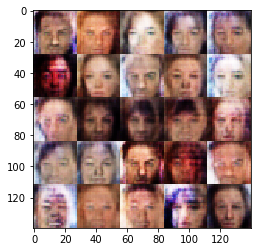


Batches:  24%|█████████████████                                                       | 1500/6331 [02:47<09:05,  8.85batch/s]

Epoch 0/1... Batch 1510/6331... Discriminator loss: 0.4649 Generator loss: 2.5153
Epoch 0/1... Batch 1520/6331... Discriminator loss: 0.5464 Generator loss: 1.7758
Epoch 0/1... Batch 1530/6331... Discriminator loss: 1.1908 Generator loss: 0.6907
Epoch 0/1... Batch 1540/6331... Discriminator loss: 0.5344 Generator loss: 2.6219
Epoch 0/1... Batch 1550/6331... Discriminator loss: 0.6072 Generator loss: 2.4072
Epoch 0/1... Batch 1560/6331... Discriminator loss: 0.6780 Generator loss: 1.1538
Epoch 0/1... Batch 1570/6331... Discriminator loss: 0.5920 Generator loss: 2.8473
Epoch 0/1... Batch 1580/6331... Discriminator loss: 0.6603 Generator loss: 2.6425
Epoch 0/1... Batch 1590/6331... Discriminator loss: 1.8473 Generator loss: 0.3095
Epoch 0/1... Batch 1600/6331... Discriminator loss: 0.5263 Generator loss: 2.4211


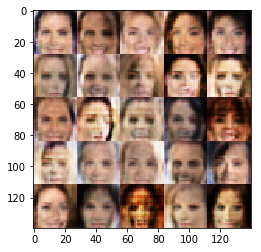


Batches:  25%|██████████████████▏                                                     | 1600/6331 [02:58<08:49,  8.94batch/s]

Epoch 0/1... Batch 1610/6331... Discriminator loss: 1.1336 Generator loss: 0.8350
Epoch 0/1... Batch 1620/6331... Discriminator loss: 0.5575 Generator loss: 1.6722
Epoch 0/1... Batch 1630/6331... Discriminator loss: 0.9562 Generator loss: 1.0163
Epoch 0/1... Batch 1640/6331... Discriminator loss: 0.8828 Generator loss: 4.4171
Epoch 0/1... Batch 1650/6331... Discriminator loss: 0.6601 Generator loss: 2.0178
Epoch 0/1... Batch 1660/6331... Discriminator loss: 0.6404 Generator loss: 1.4227
Epoch 0/1... Batch 1670/6331... Discriminator loss: 0.4499 Generator loss: 2.4842
Epoch 0/1... Batch 1680/6331... Discriminator loss: 0.8534 Generator loss: 0.9751
Epoch 0/1... Batch 1690/6331... Discriminator loss: 0.5586 Generator loss: 2.5041
Epoch 0/1... Batch 1700/6331... Discriminator loss: 0.6753 Generator loss: 2.7079


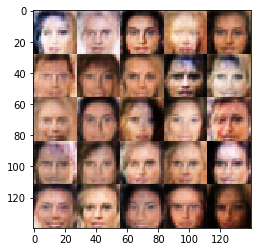


Batches:  27%|███████████████████▎                                                    | 1700/6331 [03:09<08:35,  8.99batch/s]

Epoch 0/1... Batch 1710/6331... Discriminator loss: 0.6125 Generator loss: 1.8863
Epoch 0/1... Batch 1720/6331... Discriminator loss: 0.6014 Generator loss: 2.5229
Epoch 0/1... Batch 1730/6331... Discriminator loss: 0.6426 Generator loss: 1.5084
Epoch 0/1... Batch 1740/6331... Discriminator loss: 0.6602 Generator loss: 1.3380
Epoch 0/1... Batch 1750/6331... Discriminator loss: 0.4452 Generator loss: 3.2626
Epoch 0/1... Batch 1760/6331... Discriminator loss: 0.4514 Generator loss: 2.4423
Epoch 0/1... Batch 1770/6331... Discriminator loss: 0.5325 Generator loss: 2.5908
Epoch 0/1... Batch 1780/6331... Discriminator loss: 0.5065 Generator loss: 1.6695
Epoch 0/1... Batch 1790/6331... Discriminator loss: 0.7155 Generator loss: 1.3483
Epoch 0/1... Batch 1800/6331... Discriminator loss: 0.5307 Generator loss: 3.3447


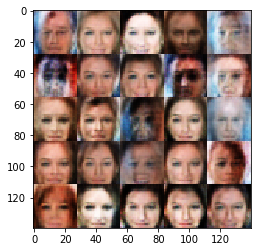


Batches:  28%|████████████████████▍                                                   | 1800/6331 [03:20<08:22,  9.01batch/s]

Epoch 0/1... Batch 1810/6331... Discriminator loss: 0.6787 Generator loss: 1.3798
Epoch 0/1... Batch 1820/6331... Discriminator loss: 0.6895 Generator loss: 1.4978
Epoch 0/1... Batch 1830/6331... Discriminator loss: 0.5628 Generator loss: 2.2714
Epoch 0/1... Batch 1840/6331... Discriminator loss: 0.6000 Generator loss: 2.0420
Epoch 0/1... Batch 1850/6331... Discriminator loss: 1.3838 Generator loss: 5.5388
Epoch 0/1... Batch 1860/6331... Discriminator loss: 0.5686 Generator loss: 2.6807
Epoch 0/1... Batch 1870/6331... Discriminator loss: 0.9564 Generator loss: 0.9394
Epoch 0/1... Batch 1880/6331... Discriminator loss: 0.5530 Generator loss: 2.7413
Epoch 0/1... Batch 1890/6331... Discriminator loss: 0.5702 Generator loss: 1.8889
Epoch 0/1... Batch 1900/6331... Discriminator loss: 1.3039 Generator loss: 4.1760


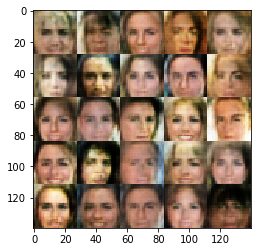


Batches:  30%|█████████████████████▌                                                  | 1900/6331 [03:31<08:11,  9.01batch/s]

Epoch 0/1... Batch 1910/6331... Discriminator loss: 0.5658 Generator loss: 2.0599
Epoch 0/1... Batch 1920/6331... Discriminator loss: 0.5328 Generator loss: 1.9947
Epoch 0/1... Batch 1930/6331... Discriminator loss: 0.5192 Generator loss: 3.3157
Epoch 0/1... Batch 1940/6331... Discriminator loss: 0.5242 Generator loss: 1.8239
Epoch 0/1... Batch 1950/6331... Discriminator loss: 0.5247 Generator loss: 2.0593
Epoch 0/1... Batch 1960/6331... Discriminator loss: 0.9709 Generator loss: 3.4520
Epoch 0/1... Batch 1970/6331... Discriminator loss: 0.4837 Generator loss: 2.7834
Epoch 0/1... Batch 1980/6331... Discriminator loss: 0.6703 Generator loss: 2.8713
Epoch 0/1... Batch 1990/6331... Discriminator loss: 0.5475 Generator loss: 2.3743
Epoch 0/1... Batch 2000/6331... Discriminator loss: 0.5245 Generator loss: 2.2753


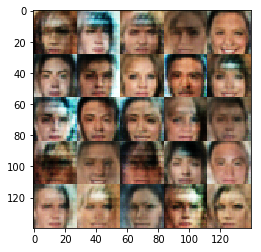


Batches:  32%|██████████████████████▋                                                 | 2000/6331 [03:43<08:03,  8.95batch/s]

Epoch 0/1... Batch 2010/6331... Discriminator loss: 0.7690 Generator loss: 1.0736
Epoch 0/1... Batch 2020/6331... Discriminator loss: 0.4565 Generator loss: 2.7547
Epoch 0/1... Batch 2030/6331... Discriminator loss: 0.5287 Generator loss: 2.3002
Epoch 0/1... Batch 2040/6331... Discriminator loss: 0.4790 Generator loss: 2.1775
Epoch 0/1... Batch 2050/6331... Discriminator loss: 0.4871 Generator loss: 2.2096
Epoch 0/1... Batch 2060/6331... Discriminator loss: 0.5112 Generator loss: 2.2475
Epoch 0/1... Batch 2070/6331... Discriminator loss: 2.9206 Generator loss: 7.5391
Epoch 0/1... Batch 2080/6331... Discriminator loss: 0.5964 Generator loss: 1.8545
Epoch 0/1... Batch 2090/6331... Discriminator loss: 0.6214 Generator loss: 1.4809
Epoch 0/1... Batch 2100/6331... Discriminator loss: 1.2219 Generator loss: 0.8041


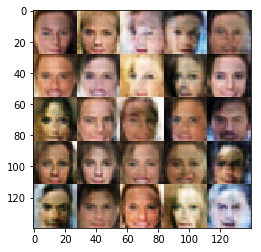


Batches:  33%|███████████████████████▉                                                | 2100/6331 [03:54<07:52,  8.95batch/s]

Epoch 0/1... Batch 2110/6331... Discriminator loss: 0.4755 Generator loss: 2.2868
Epoch 0/1... Batch 2120/6331... Discriminator loss: 0.4930 Generator loss: 2.3910
Epoch 0/1... Batch 2130/6331... Discriminator loss: 0.4492 Generator loss: 3.2276
Epoch 0/1... Batch 2140/6331... Discriminator loss: 0.5353 Generator loss: 1.8881
Epoch 0/1... Batch 2150/6331... Discriminator loss: 0.5420 Generator loss: 2.2704
Epoch 0/1... Batch 2160/6331... Discriminator loss: 0.5064 Generator loss: 2.2231
Epoch 0/1... Batch 2170/6331... Discriminator loss: 0.6061 Generator loss: 2.2398
Epoch 0/1... Batch 2180/6331... Discriminator loss: 0.5063 Generator loss: 2.0442
Epoch 0/1... Batch 2190/6331... Discriminator loss: 0.4897 Generator loss: 2.3835
Epoch 0/1... Batch 2200/6331... Discriminator loss: 0.5502 Generator loss: 1.6617


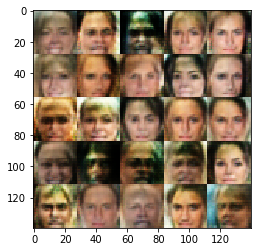


Batches:  35%|█████████████████████████                                               | 2200/6331 [04:05<07:40,  8.97batch/s]

Epoch 0/1... Batch 2210/6331... Discriminator loss: 0.6458 Generator loss: 1.3752
Epoch 0/1... Batch 2220/6331... Discriminator loss: 0.5038 Generator loss: 1.9062
Epoch 0/1... Batch 2230/6331... Discriminator loss: 0.4322 Generator loss: 2.6920
Epoch 0/1... Batch 2240/6331... Discriminator loss: 0.5143 Generator loss: 1.7953
Epoch 0/1... Batch 2250/6331... Discriminator loss: 2.9684 Generator loss: 0.0962
Epoch 0/1... Batch 2260/6331... Discriminator loss: 0.5355 Generator loss: 2.0423
Epoch 0/1... Batch 2270/6331... Discriminator loss: 0.5595 Generator loss: 1.9079
Epoch 0/1... Batch 2280/6331... Discriminator loss: 0.5850 Generator loss: 1.8071
Epoch 0/1... Batch 2290/6331... Discriminator loss: 0.4957 Generator loss: 2.7092
Epoch 0/1... Batch 2300/6331... Discriminator loss: 0.5231 Generator loss: 3.4467


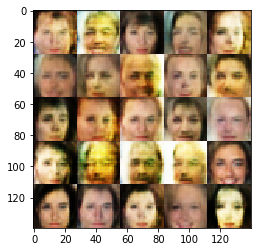


Batches:  36%|██████████████████████████▏                                             | 2300/6331 [04:16<07:27,  9.00batch/s]

Epoch 0/1... Batch 2310/6331... Discriminator loss: 0.5760 Generator loss: 2.9772
Epoch 0/1... Batch 2320/6331... Discriminator loss: 0.9694 Generator loss: 0.9074
Epoch 0/1... Batch 2330/6331... Discriminator loss: 0.8442 Generator loss: 1.4331
Epoch 0/1... Batch 2340/6331... Discriminator loss: 1.2674 Generator loss: 0.7152
Epoch 0/1... Batch 2350/6331... Discriminator loss: 0.8346 Generator loss: 1.0821
Epoch 0/1... Batch 2360/6331... Discriminator loss: 0.7859 Generator loss: 1.1911
Epoch 0/1... Batch 2370/6331... Discriminator loss: 0.4166 Generator loss: 2.7616
Epoch 0/1... Batch 2380/6331... Discriminator loss: 0.5378 Generator loss: 2.0776
Epoch 0/1... Batch 2390/6331... Discriminator loss: 0.5642 Generator loss: 1.7337
Epoch 0/1... Batch 2400/6331... Discriminator loss: 0.4147 Generator loss: 3.2746


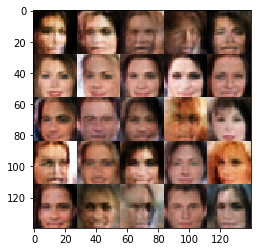


Batches:  38%|███████████████████████████▎                                            | 2400/6331 [04:27<07:17,  8.99batch/s]

Epoch 0/1... Batch 2410/6331... Discriminator loss: 0.5680 Generator loss: 1.5460
Epoch 0/1... Batch 2420/6331... Discriminator loss: 0.5405 Generator loss: 1.9908
Epoch 0/1... Batch 2430/6331... Discriminator loss: 0.5804 Generator loss: 2.7257
Epoch 0/1... Batch 2440/6331... Discriminator loss: 2.4150 Generator loss: 0.2155
Epoch 0/1... Batch 2450/6331... Discriminator loss: 0.7125 Generator loss: 1.3236
Epoch 0/1... Batch 2460/6331... Discriminator loss: 0.8943 Generator loss: 0.8545
Epoch 0/1... Batch 2470/6331... Discriminator loss: 0.5666 Generator loss: 1.7172
Epoch 0/1... Batch 2480/6331... Discriminator loss: 0.4457 Generator loss: 2.6079
Epoch 0/1... Batch 2490/6331... Discriminator loss: 0.5543 Generator loss: 3.0026
Epoch 0/1... Batch 2500/6331... Discriminator loss: 0.9006 Generator loss: 0.9196


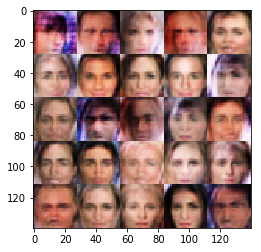


Batches:  39%|████████████████████████████▍                                           | 2500/6331 [04:39<07:09,  8.92batch/s]

Epoch 0/1... Batch 2510/6331... Discriminator loss: 0.3795 Generator loss: 3.6987
Epoch 0/1... Batch 2520/6331... Discriminator loss: 0.4893 Generator loss: 2.0270
Epoch 0/1... Batch 2530/6331... Discriminator loss: 0.3908 Generator loss: 3.5628
Epoch 0/1... Batch 2540/6331... Discriminator loss: 0.6894 Generator loss: 1.2693
Epoch 0/1... Batch 2550/6331... Discriminator loss: 0.8963 Generator loss: 1.1176
Epoch 0/1... Batch 2560/6331... Discriminator loss: 0.7155 Generator loss: 1.4426
Epoch 0/1... Batch 2570/6331... Discriminator loss: 0.5334 Generator loss: 3.0643
Epoch 0/1... Batch 2580/6331... Discriminator loss: 0.5456 Generator loss: 2.2050
Epoch 0/1... Batch 2590/6331... Discriminator loss: 0.5087 Generator loss: 2.5454
Epoch 0/1... Batch 2600/6331... Discriminator loss: 1.0295 Generator loss: 0.6544


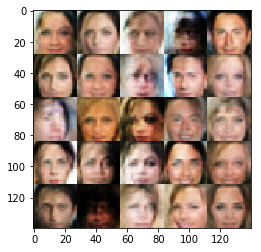


Batches:  41%|█████████████████████████████▌                                          | 2600/6331 [04:51<07:09,  8.69batch/s]

Epoch 0/1... Batch 2610/6331... Discriminator loss: 0.4998 Generator loss: 2.2711
Epoch 0/1... Batch 2620/6331... Discriminator loss: 0.4735 Generator loss: 2.6013
Epoch 0/1... Batch 2630/6331... Discriminator loss: 0.4295 Generator loss: 2.4941
Epoch 0/1... Batch 2640/6331... Discriminator loss: 0.4689 Generator loss: 3.9790
Epoch 0/1... Batch 2650/6331... Discriminator loss: 0.4154 Generator loss: 2.9049
Epoch 0/1... Batch 2660/6331... Discriminator loss: 1.0530 Generator loss: 0.7478
Epoch 0/1... Batch 2670/6331... Discriminator loss: 0.6293 Generator loss: 5.9196
Epoch 0/1... Batch 2680/6331... Discriminator loss: 0.9837 Generator loss: 0.7639
Epoch 0/1... Batch 2690/6331... Discriminator loss: 0.7198 Generator loss: 1.3352
Epoch 0/1... Batch 2700/6331... Discriminator loss: 0.4838 Generator loss: 2.1406


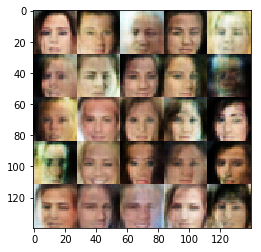


Batches:  43%|██████████████████████████████▋                                         | 2700/6331 [05:02<06:56,  8.73batch/s]

Epoch 0/1... Batch 2710/6331... Discriminator loss: 0.5301 Generator loss: 3.0388
Epoch 0/1... Batch 2720/6331... Discriminator loss: 0.4934 Generator loss: 2.1582
Epoch 0/1... Batch 2730/6331... Discriminator loss: 0.4325 Generator loss: 2.9114
Epoch 0/1... Batch 2740/6331... Discriminator loss: 0.6400 Generator loss: 1.5139
Epoch 0/1... Batch 2750/6331... Discriminator loss: 0.4412 Generator loss: 3.1549
Epoch 0/1... Batch 2760/6331... Discriminator loss: 0.6272 Generator loss: 1.5413
Epoch 0/1... Batch 2770/6331... Discriminator loss: 0.8318 Generator loss: 3.5898
Epoch 0/1... Batch 2780/6331... Discriminator loss: 0.6110 Generator loss: 2.0686
Epoch 0/1... Batch 2790/6331... Discriminator loss: 0.6730 Generator loss: 1.6391
Epoch 0/1... Batch 2800/6331... Discriminator loss: 0.4403 Generator loss: 2.5035


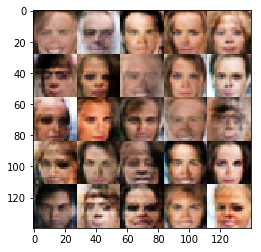


Batches:  44%|███████████████████████████████▊                                        | 2800/6331 [05:14<06:43,  8.74batch/s]

Epoch 0/1... Batch 2810/6331... Discriminator loss: 1.1811 Generator loss: 0.7594
Epoch 0/1... Batch 2820/6331... Discriminator loss: 0.7262 Generator loss: 1.7228
Epoch 0/1... Batch 2830/6331... Discriminator loss: 0.5427 Generator loss: 3.6325
Epoch 0/1... Batch 2840/6331... Discriminator loss: 0.7634 Generator loss: 1.2673
Epoch 0/1... Batch 2850/6331... Discriminator loss: 0.4867 Generator loss: 2.9884
Epoch 0/1... Batch 2860/6331... Discriminator loss: 0.9099 Generator loss: 3.7935
Epoch 0/1... Batch 2870/6331... Discriminator loss: 0.4244 Generator loss: 3.0927
Epoch 0/1... Batch 2880/6331... Discriminator loss: 0.5456 Generator loss: 2.0242
Epoch 0/1... Batch 2890/6331... Discriminator loss: 1.9532 Generator loss: 4.6061
Epoch 0/1... Batch 2900/6331... Discriminator loss: 0.5866 Generator loss: 2.2608


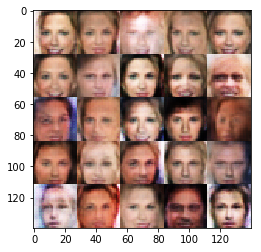


Batches:  46%|████████████████████████████████▉                                       | 2900/6331 [05:25<06:32,  8.74batch/s]

Epoch 0/1... Batch 2910/6331... Discriminator loss: 0.5445 Generator loss: 2.1742
Epoch 0/1... Batch 2920/6331... Discriminator loss: 0.4464 Generator loss: 2.4943
Epoch 0/1... Batch 2930/6331... Discriminator loss: 0.7127 Generator loss: 2.9580
Epoch 0/1... Batch 2940/6331... Discriminator loss: 0.5066 Generator loss: 2.2927
Epoch 0/1... Batch 2950/6331... Discriminator loss: 0.5206 Generator loss: 1.8351
Epoch 0/1... Batch 2960/6331... Discriminator loss: 1.1454 Generator loss: 0.7241
Epoch 0/1... Batch 2970/6331... Discriminator loss: 0.5118 Generator loss: 2.0508
Epoch 0/1... Batch 2980/6331... Discriminator loss: 0.4722 Generator loss: 2.2209
Epoch 0/1... Batch 2990/6331... Discriminator loss: 0.4701 Generator loss: 3.2375
Epoch 0/1... Batch 3000/6331... Discriminator loss: 0.5237 Generator loss: 3.1829


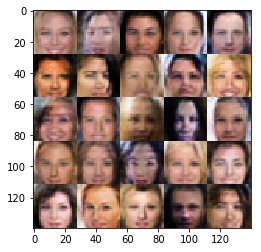


Batches:  47%|██████████████████████████████████                                      | 3000/6331 [05:36<06:19,  8.77batch/s]

Epoch 0/1... Batch 3010/6331... Discriminator loss: 0.4672 Generator loss: 3.5537
Epoch 0/1... Batch 3020/6331... Discriminator loss: 0.4458 Generator loss: 2.6358
Epoch 0/1... Batch 3030/6331... Discriminator loss: 0.4718 Generator loss: 2.2624
Epoch 0/1... Batch 3040/6331... Discriminator loss: 0.4092 Generator loss: 2.6798
Epoch 0/1... Batch 3050/6331... Discriminator loss: 0.6776 Generator loss: 1.4922
Epoch 0/1... Batch 3060/6331... Discriminator loss: 0.7670 Generator loss: 3.7071
Epoch 0/1... Batch 3070/6331... Discriminator loss: 0.5645 Generator loss: 2.0944
Epoch 0/1... Batch 3080/6331... Discriminator loss: 0.4814 Generator loss: 2.7047
Epoch 0/1... Batch 3090/6331... Discriminator loss: 0.4774 Generator loss: 1.9834
Epoch 0/1... Batch 3100/6331... Discriminator loss: 0.5853 Generator loss: 2.3614


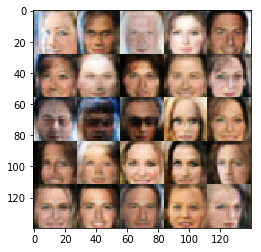


Batches:  49%|███████████████████████████████████▎                                    | 3100/6331 [05:48<06:08,  8.77batch/s]

Epoch 0/1... Batch 3110/6331... Discriminator loss: 0.4412 Generator loss: 2.3476
Epoch 0/1... Batch 3120/6331... Discriminator loss: 0.9043 Generator loss: 1.1873
Epoch 0/1... Batch 3130/6331... Discriminator loss: 0.5408 Generator loss: 2.3715
Epoch 0/1... Batch 3140/6331... Discriminator loss: 0.3648 Generator loss: 4.3196
Epoch 0/1... Batch 3150/6331... Discriminator loss: 1.1594 Generator loss: 0.8910
Epoch 0/1... Batch 3160/6331... Discriminator loss: 0.4653 Generator loss: 2.4021
Epoch 0/1... Batch 3170/6331... Discriminator loss: 0.4821 Generator loss: 2.1763
Epoch 0/1... Batch 3180/6331... Discriminator loss: 0.4123 Generator loss: 3.3786
Epoch 0/1... Batch 3190/6331... Discriminator loss: 0.6240 Generator loss: 1.4351
Epoch 0/1... Batch 3200/6331... Discriminator loss: 0.6718 Generator loss: 1.4208


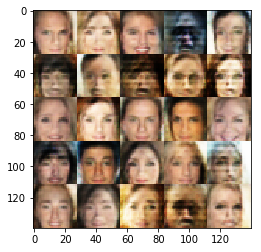


Batches:  51%|████████████████████████████████████▍                                   | 3200/6331 [05:59<05:57,  8.77batch/s]

Epoch 0/1... Batch 3210/6331... Discriminator loss: 0.6518 Generator loss: 4.1279
Epoch 0/1... Batch 3220/6331... Discriminator loss: 0.8496 Generator loss: 0.8643
Epoch 0/1... Batch 3230/6331... Discriminator loss: 0.4410 Generator loss: 3.1195
Epoch 0/1... Batch 3240/6331... Discriminator loss: 0.5315 Generator loss: 1.4394
Epoch 0/1... Batch 3250/6331... Discriminator loss: 0.4460 Generator loss: 2.5350
Epoch 0/1... Batch 3260/6331... Discriminator loss: 0.5918 Generator loss: 1.8481
Epoch 0/1... Batch 3270/6331... Discriminator loss: 0.7772 Generator loss: 1.2601
Epoch 0/1... Batch 3280/6331... Discriminator loss: 0.5964 Generator loss: 4.3790
Epoch 0/1... Batch 3290/6331... Discriminator loss: 0.5864 Generator loss: 2.2943
Epoch 0/1... Batch 3300/6331... Discriminator loss: 1.0047 Generator loss: 1.2414


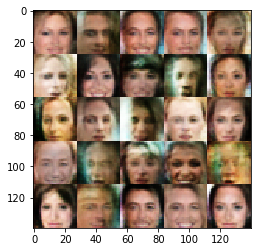


Batches:  52%|█████████████████████████████████████▌                                  | 3300/6331 [06:11<05:48,  8.71batch/s]

Epoch 0/1... Batch 3310/6331... Discriminator loss: 0.4569 Generator loss: 2.6161
Epoch 0/1... Batch 3320/6331... Discriminator loss: 0.6634 Generator loss: 1.5351
Epoch 0/1... Batch 3330/6331... Discriminator loss: 0.3983 Generator loss: 3.0626
Epoch 0/1... Batch 3340/6331... Discriminator loss: 0.5038 Generator loss: 2.2027
Epoch 0/1... Batch 3350/6331... Discriminator loss: 0.3925 Generator loss: 2.7322
Epoch 0/1... Batch 3360/6331... Discriminator loss: 0.4025 Generator loss: 3.5740
Epoch 0/1... Batch 3370/6331... Discriminator loss: 0.4054 Generator loss: 3.1892
Epoch 0/1... Batch 3380/6331... Discriminator loss: 0.4915 Generator loss: 2.1823
Epoch 0/1... Batch 3390/6331... Discriminator loss: 0.7147 Generator loss: 2.4497
Epoch 0/1... Batch 3400/6331... Discriminator loss: 0.8454 Generator loss: 1.3113


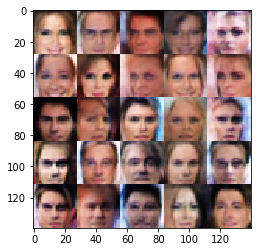


Batches:  54%|██████████████████████████████████████▋                                 | 3400/6331 [06:22<05:36,  8.71batch/s]

Epoch 0/1... Batch 3410/6331... Discriminator loss: 0.8149 Generator loss: 1.5500
Epoch 0/1... Batch 3420/6331... Discriminator loss: 0.5261 Generator loss: 2.6283
Epoch 0/1... Batch 3430/6331... Discriminator loss: 0.4680 Generator loss: 2.3871
Epoch 0/1... Batch 3440/6331... Discriminator loss: 0.8748 Generator loss: 4.3304
Epoch 0/1... Batch 3450/6331... Discriminator loss: 0.6733 Generator loss: 1.7680
Epoch 0/1... Batch 3460/6331... Discriminator loss: 0.4432 Generator loss: 2.7620
Epoch 0/1... Batch 3470/6331... Discriminator loss: 0.6245 Generator loss: 3.8196
Epoch 0/1... Batch 3480/6331... Discriminator loss: 0.9765 Generator loss: 1.2064
Epoch 0/1... Batch 3490/6331... Discriminator loss: 0.6795 Generator loss: 1.2698
Epoch 0/1... Batch 3500/6331... Discriminator loss: 0.9434 Generator loss: 1.2099


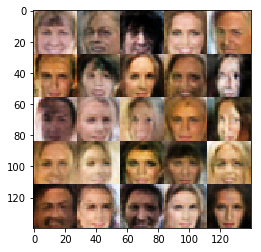


Batches:  55%|███████████████████████████████████████▊                                | 3500/6331 [06:34<05:24,  8.71batch/s]

Epoch 0/1... Batch 3510/6331... Discriminator loss: 0.4630 Generator loss: 2.2978
Epoch 0/1... Batch 3520/6331... Discriminator loss: 0.5249 Generator loss: 1.7558
Epoch 0/1... Batch 3530/6331... Discriminator loss: 0.5802 Generator loss: 2.4985
Epoch 0/1... Batch 3540/6331... Discriminator loss: 0.3810 Generator loss: 3.4608
Epoch 0/1... Batch 3550/6331... Discriminator loss: 0.5970 Generator loss: 3.1343
Epoch 0/1... Batch 3560/6331... Discriminator loss: 0.9858 Generator loss: 1.3315
Epoch 0/1... Batch 3570/6331... Discriminator loss: 0.5568 Generator loss: 1.8123
Epoch 0/1... Batch 3580/6331... Discriminator loss: 0.5816 Generator loss: 1.9236
Epoch 0/1... Batch 3590/6331... Discriminator loss: 0.4834 Generator loss: 2.5852
Epoch 0/1... Batch 3600/6331... Discriminator loss: 0.6294 Generator loss: 2.9672


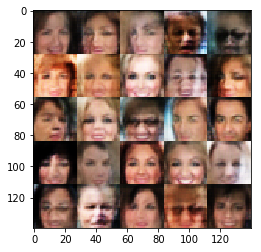


Batches:  57%|████████████████████████████████████████▉                               | 3600/6331 [06:46<05:17,  8.60batch/s]

Epoch 0/1... Batch 3610/6331... Discriminator loss: 0.8135 Generator loss: 1.0158
Epoch 0/1... Batch 3620/6331... Discriminator loss: 0.3987 Generator loss: 3.1699
Epoch 0/1... Batch 3630/6331... Discriminator loss: 0.7111 Generator loss: 1.5196
Epoch 0/1... Batch 3640/6331... Discriminator loss: 0.6345 Generator loss: 1.9016
Epoch 0/1... Batch 3650/6331... Discriminator loss: 0.4083 Generator loss: 3.0924
Epoch 0/1... Batch 3660/6331... Discriminator loss: 0.5280 Generator loss: 2.4186
Epoch 0/1... Batch 3670/6331... Discriminator loss: 0.4786 Generator loss: 3.2288
Epoch 0/1... Batch 3680/6331... Discriminator loss: 0.4538 Generator loss: 5.0234
Epoch 0/1... Batch 3690/6331... Discriminator loss: 0.6049 Generator loss: 1.7908
Epoch 0/1... Batch 3700/6331... Discriminator loss: 0.4072 Generator loss: 3.2301


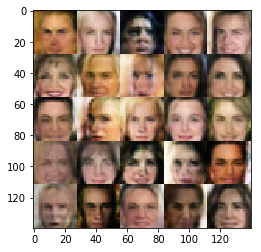


Batches:  58%|██████████████████████████████████████████                              | 3700/6331 [06:57<05:01,  8.72batch/s]

Epoch 0/1... Batch 3710/6331... Discriminator loss: 1.2802 Generator loss: 0.4505
Epoch 0/1... Batch 3720/6331... Discriminator loss: 0.4751 Generator loss: 2.3800
Epoch 0/1... Batch 3730/6331... Discriminator loss: 0.4243 Generator loss: 3.2210
Epoch 0/1... Batch 3740/6331... Discriminator loss: 0.4596 Generator loss: 2.7215
Epoch 0/1... Batch 3750/6331... Discriminator loss: 0.5725 Generator loss: 2.7937
Epoch 0/1... Batch 3760/6331... Discriminator loss: 0.4403 Generator loss: 2.9039
Epoch 0/1... Batch 3770/6331... Discriminator loss: 0.5504 Generator loss: 1.6533
Epoch 0/1... Batch 3780/6331... Discriminator loss: 0.7327 Generator loss: 1.3703
Epoch 0/1... Batch 3790/6331... Discriminator loss: 0.6739 Generator loss: 1.6105
Epoch 0/1... Batch 3800/6331... Discriminator loss: 0.8598 Generator loss: 5.2501


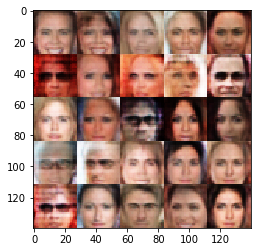


Batches:  60%|███████████████████████████████████████████▏                            | 3800/6331 [07:08<04:46,  8.83batch/s]

Epoch 0/1... Batch 3810/6331... Discriminator loss: 0.5105 Generator loss: 1.9793
Epoch 0/1... Batch 3820/6331... Discriminator loss: 0.4572 Generator loss: 3.0595
Epoch 0/1... Batch 3830/6331... Discriminator loss: 0.4042 Generator loss: 2.9228
Epoch 0/1... Batch 3840/6331... Discriminator loss: 0.4428 Generator loss: 5.2536
Epoch 0/1... Batch 3850/6331... Discriminator loss: 0.4438 Generator loss: 2.7453
Epoch 0/1... Batch 3860/6331... Discriminator loss: 0.3911 Generator loss: 3.3166
Epoch 0/1... Batch 3870/6331... Discriminator loss: 1.9085 Generator loss: 0.3574
Epoch 0/1... Batch 3880/6331... Discriminator loss: 0.8162 Generator loss: 1.0003
Epoch 0/1... Batch 3890/6331... Discriminator loss: 0.4268 Generator loss: 2.9231
Epoch 0/1... Batch 3900/6331... Discriminator loss: 0.4028 Generator loss: 3.4572


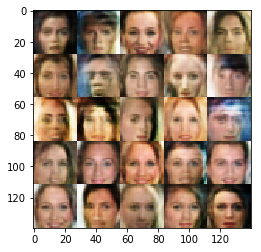


Batches:  62%|████████████████████████████████████████████▎                           | 3900/6331 [07:20<04:38,  8.73batch/s]

Epoch 0/1... Batch 3910/6331... Discriminator loss: 0.5754 Generator loss: 2.1242
Epoch 0/1... Batch 3920/6331... Discriminator loss: 0.6710 Generator loss: 1.3559
Epoch 0/1... Batch 3930/6331... Discriminator loss: 0.5555 Generator loss: 3.3275
Epoch 0/1... Batch 3940/6331... Discriminator loss: 0.4180 Generator loss: 3.7222
Epoch 0/1... Batch 3950/6331... Discriminator loss: 0.5069 Generator loss: 1.7534
Epoch 0/1... Batch 3960/6331... Discriminator loss: 0.4713 Generator loss: 2.6578
Epoch 0/1... Batch 3970/6331... Discriminator loss: 0.4133 Generator loss: 3.6204
Epoch 0/1... Batch 3980/6331... Discriminator loss: 0.4874 Generator loss: 2.6825
Epoch 0/1... Batch 3990/6331... Discriminator loss: 0.5262 Generator loss: 1.7970
Epoch 0/1... Batch 4000/6331... Discriminator loss: 0.5274 Generator loss: 3.0358


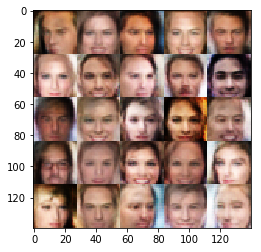


Batches:  63%|█████████████████████████████████████████████▍                          | 4000/6331 [07:31<04:29,  8.64batch/s]

Epoch 0/1... Batch 4010/6331... Discriminator loss: 0.4393 Generator loss: 2.9475
Epoch 0/1... Batch 4020/6331... Discriminator loss: 0.5882 Generator loss: 1.7268
Epoch 0/1... Batch 4030/6331... Discriminator loss: 0.4905 Generator loss: 2.1565
Epoch 0/1... Batch 4040/6331... Discriminator loss: 0.5253 Generator loss: 2.2258
Epoch 0/1... Batch 4050/6331... Discriminator loss: 0.6159 Generator loss: 1.3979
Epoch 0/1... Batch 4060/6331... Discriminator loss: 0.5934 Generator loss: 1.7102
Epoch 0/1... Batch 4070/6331... Discriminator loss: 0.5190 Generator loss: 2.5622
Epoch 0/1... Batch 4080/6331... Discriminator loss: 0.4066 Generator loss: 2.7923
Epoch 0/1... Batch 4090/6331... Discriminator loss: 0.5067 Generator loss: 2.6044
Epoch 0/1... Batch 4100/6331... Discriminator loss: 0.7758 Generator loss: 1.2995


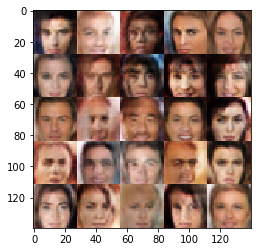


Batches:  65%|██████████████████████████████████████████████▋                         | 4100/6331 [07:43<04:16,  8.69batch/s]

Epoch 0/1... Batch 4110/6331... Discriminator loss: 0.5211 Generator loss: 3.0869
Epoch 0/1... Batch 4120/6331... Discriminator loss: 0.6973 Generator loss: 3.7637
Epoch 0/1... Batch 4130/6331... Discriminator loss: 0.5517 Generator loss: 2.0204
Epoch 0/1... Batch 4140/6331... Discriminator loss: 0.4771 Generator loss: 1.9012
Epoch 0/1... Batch 4150/6331... Discriminator loss: 0.3921 Generator loss: 3.3421
Epoch 0/1... Batch 4160/6331... Discriminator loss: 0.4260 Generator loss: 2.9028
Epoch 0/1... Batch 4170/6331... Discriminator loss: 0.4760 Generator loss: 2.1764
Epoch 0/1... Batch 4180/6331... Discriminator loss: 0.3998 Generator loss: 3.3718
Epoch 0/1... Batch 4190/6331... Discriminator loss: 0.4636 Generator loss: 3.3088
Epoch 0/1... Batch 4200/6331... Discriminator loss: 0.5123 Generator loss: 2.9918


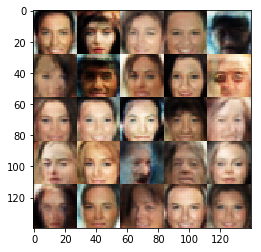


Batches:  66%|███████████████████████████████████████████████▊                        | 4200/6331 [07:54<04:03,  8.76batch/s]

Epoch 0/1... Batch 4210/6331... Discriminator loss: 0.6022 Generator loss: 1.8566
Epoch 0/1... Batch 4220/6331... Discriminator loss: 1.5916 Generator loss: 4.4128
Epoch 0/1... Batch 4230/6331... Discriminator loss: 0.6190 Generator loss: 4.0643
Epoch 0/1... Batch 4240/6331... Discriminator loss: 0.5244 Generator loss: 1.5959
Epoch 0/1... Batch 4250/6331... Discriminator loss: 0.5067 Generator loss: 2.3519
Epoch 0/1... Batch 4260/6331... Discriminator loss: 0.6743 Generator loss: 1.8843
Epoch 0/1... Batch 4270/6331... Discriminator loss: 0.5481 Generator loss: 3.5724
Epoch 0/1... Batch 4280/6331... Discriminator loss: 0.4048 Generator loss: 3.4018
Epoch 0/1... Batch 4290/6331... Discriminator loss: 0.5810 Generator loss: 1.9204
Epoch 0/1... Batch 4300/6331... Discriminator loss: 0.4274 Generator loss: 3.5489


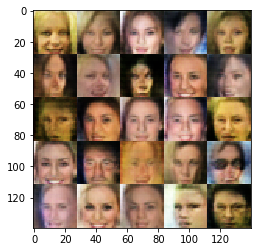


Batches:  68%|████████████████████████████████████████████████▉                       | 4300/6331 [08:05<03:52,  8.75batch/s]

Epoch 0/1... Batch 4310/6331... Discriminator loss: 0.5696 Generator loss: 1.7058
Epoch 0/1... Batch 4320/6331... Discriminator loss: 0.7202 Generator loss: 1.3476
Epoch 0/1... Batch 4330/6331... Discriminator loss: 0.4562 Generator loss: 2.3373
Epoch 0/1... Batch 4340/6331... Discriminator loss: 0.4018 Generator loss: 3.8584
Epoch 0/1... Batch 4350/6331... Discriminator loss: 0.6137 Generator loss: 1.7863
Epoch 0/1... Batch 4360/6331... Discriminator loss: 0.4506 Generator loss: 2.7284
Epoch 0/1... Batch 4370/6331... Discriminator loss: 0.5311 Generator loss: 2.8595
Epoch 0/1... Batch 4380/6331... Discriminator loss: 0.7831 Generator loss: 5.8779
Epoch 0/1... Batch 4390/6331... Discriminator loss: 0.5883 Generator loss: 1.4625
Epoch 0/1... Batch 4400/6331... Discriminator loss: 0.5048 Generator loss: 2.4325


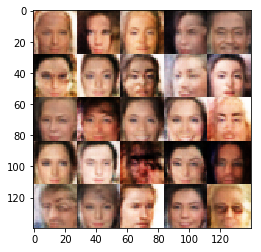


Batches:  69%|██████████████████████████████████████████████████                      | 4400/6331 [08:17<03:40,  8.74batch/s]

Epoch 0/1... Batch 4410/6331... Discriminator loss: 0.4629 Generator loss: 3.2914
Epoch 0/1... Batch 4420/6331... Discriminator loss: 0.4097 Generator loss: 2.8220
Epoch 0/1... Batch 4430/6331... Discriminator loss: 1.7637 Generator loss: 0.4773
Epoch 0/1... Batch 4440/6331... Discriminator loss: 0.4216 Generator loss: 3.4209
Epoch 0/1... Batch 4450/6331... Discriminator loss: 0.5093 Generator loss: 2.4993
Epoch 0/1... Batch 4460/6331... Discriminator loss: 0.7120 Generator loss: 2.9992
Epoch 0/1... Batch 4470/6331... Discriminator loss: 0.4119 Generator loss: 3.3146
Epoch 0/1... Batch 4480/6331... Discriminator loss: 0.4941 Generator loss: 2.8230
Epoch 0/1... Batch 4490/6331... Discriminator loss: 1.0157 Generator loss: 0.9090
Epoch 0/1... Batch 4500/6331... Discriminator loss: 0.4364 Generator loss: 2.6311


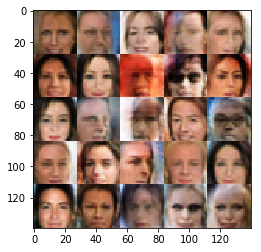


Batches:  71%|███████████████████████████████████████████████████▏                    | 4500/6331 [08:28<03:28,  8.78batch/s]

Epoch 0/1... Batch 4510/6331... Discriminator loss: 0.3868 Generator loss: 3.8331
Epoch 0/1... Batch 4520/6331... Discriminator loss: 0.6463 Generator loss: 1.4949
Epoch 0/1... Batch 4530/6331... Discriminator loss: 0.4415 Generator loss: 2.7077
Epoch 0/1... Batch 4540/6331... Discriminator loss: 0.5280 Generator loss: 1.8713
Epoch 0/1... Batch 4550/6331... Discriminator loss: 0.4150 Generator loss: 3.2248
Epoch 0/1... Batch 4560/6331... Discriminator loss: 0.7233 Generator loss: 1.4450
Epoch 0/1... Batch 4570/6331... Discriminator loss: 0.3893 Generator loss: 3.8721
Epoch 0/1... Batch 4580/6331... Discriminator loss: 0.4253 Generator loss: 3.9078
Epoch 0/1... Batch 4590/6331... Discriminator loss: 0.4152 Generator loss: 3.0572
Epoch 0/1... Batch 4600/6331... Discriminator loss: 0.3689 Generator loss: 3.4344


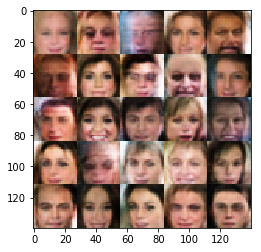


Batches:  73%|████████████████████████████████████████████████████▎                   | 4600/6331 [08:39<03:15,  8.83batch/s]

Epoch 0/1... Batch 4610/6331... Discriminator loss: 0.4326 Generator loss: 3.0930
Epoch 0/1... Batch 4620/6331... Discriminator loss: 0.8500 Generator loss: 3.8246
Epoch 0/1... Batch 4630/6331... Discriminator loss: 0.4098 Generator loss: 4.0437
Epoch 0/1... Batch 4640/6331... Discriminator loss: 0.7808 Generator loss: 1.6180
Epoch 0/1... Batch 4650/6331... Discriminator loss: 0.3632 Generator loss: 4.2546
Epoch 0/1... Batch 4660/6331... Discriminator loss: 0.5433 Generator loss: 3.9889
Epoch 0/1... Batch 4670/6331... Discriminator loss: 0.5671 Generator loss: 1.9095
Epoch 0/1... Batch 4680/6331... Discriminator loss: 0.7729 Generator loss: 3.3908
Epoch 0/1... Batch 4690/6331... Discriminator loss: 0.7660 Generator loss: 1.1242
Epoch 0/1... Batch 4700/6331... Discriminator loss: 0.4153 Generator loss: 2.5259


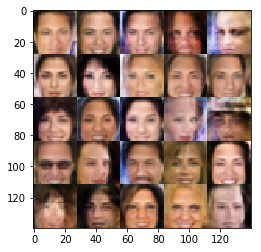


Batches:  74%|█████████████████████████████████████████████████████▍                  | 4700/6331 [08:51<03:07,  8.71batch/s]

Epoch 0/1... Batch 4710/6331... Discriminator loss: 0.7434 Generator loss: 1.7992
Epoch 0/1... Batch 4720/6331... Discriminator loss: 0.7426 Generator loss: 4.4274
Epoch 0/1... Batch 4730/6331... Discriminator loss: 0.4585 Generator loss: 2.5557
Epoch 0/1... Batch 4740/6331... Discriminator loss: 0.9903 Generator loss: 4.6113
Epoch 0/1... Batch 4750/6331... Discriminator loss: 0.5679 Generator loss: 2.3171
Epoch 0/1... Batch 4760/6331... Discriminator loss: 0.4940 Generator loss: 2.5752
Epoch 0/1... Batch 4770/6331... Discriminator loss: 0.4770 Generator loss: 3.2435
Epoch 0/1... Batch 4780/6331... Discriminator loss: 1.0648 Generator loss: 0.8293
Epoch 0/1... Batch 4790/6331... Discriminator loss: 0.4965 Generator loss: 3.2161
Epoch 0/1... Batch 4800/6331... Discriminator loss: 0.7162 Generator loss: 1.4169


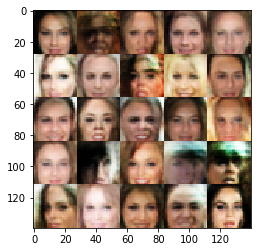


Batches:  76%|██████████████████████████████████████████████████████▌                 | 4800/6331 [09:02<02:54,  8.76batch/s]

Epoch 0/1... Batch 4810/6331... Discriminator loss: 0.5477 Generator loss: 3.5866
Epoch 0/1... Batch 4820/6331... Discriminator loss: 0.5034 Generator loss: 2.4284
Epoch 0/1... Batch 4830/6331... Discriminator loss: 0.4545 Generator loss: 3.4542
Epoch 0/1... Batch 4840/6331... Discriminator loss: 0.5801 Generator loss: 1.9258
Epoch 0/1... Batch 4850/6331... Discriminator loss: 0.4430 Generator loss: 2.4397
Epoch 0/1... Batch 4860/6331... Discriminator loss: 0.4678 Generator loss: 2.0838
Epoch 0/1... Batch 4870/6331... Discriminator loss: 0.4706 Generator loss: 2.3145
Epoch 0/1... Batch 4880/6331... Discriminator loss: 0.4901 Generator loss: 4.0459
Epoch 0/1... Batch 4890/6331... Discriminator loss: 0.4277 Generator loss: 3.0405
Epoch 0/1... Batch 4900/6331... Discriminator loss: 0.6115 Generator loss: 1.7957


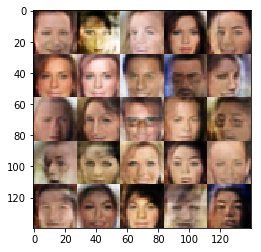


Batches:  77%|███████████████████████████████████████████████████████▋                | 4900/6331 [09:14<02:44,  8.68batch/s]

Epoch 0/1... Batch 4910/6331... Discriminator loss: 0.3998 Generator loss: 3.9752
Epoch 0/1... Batch 4920/6331... Discriminator loss: 0.4924 Generator loss: 2.0050
Epoch 0/1... Batch 4930/6331... Discriminator loss: 0.4659 Generator loss: 2.7256
Epoch 0/1... Batch 4940/6331... Discriminator loss: 0.6163 Generator loss: 4.3726
Epoch 0/1... Batch 4950/6331... Discriminator loss: 0.4623 Generator loss: 1.8898
Epoch 0/1... Batch 4960/6331... Discriminator loss: 0.4392 Generator loss: 2.0461
Epoch 0/1... Batch 4970/6331... Discriminator loss: 0.8619 Generator loss: 1.1941
Epoch 0/1... Batch 4980/6331... Discriminator loss: 0.5087 Generator loss: 2.4839
Epoch 0/1... Batch 4990/6331... Discriminator loss: 0.7723 Generator loss: 5.2325
Epoch 0/1... Batch 5000/6331... Discriminator loss: 0.5312 Generator loss: 2.3990


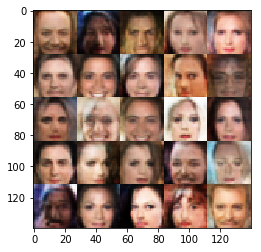


Batches:  79%|████████████████████████████████████████████████████████▊               | 5000/6331 [09:26<02:33,  8.68batch/s]

Epoch 0/1... Batch 5010/6331... Discriminator loss: 0.4591 Generator loss: 2.6404
Epoch 0/1... Batch 5020/6331... Discriminator loss: 0.5400 Generator loss: 2.2088
Epoch 0/1... Batch 5030/6331... Discriminator loss: 0.4588 Generator loss: 3.1209
Epoch 0/1... Batch 5040/6331... Discriminator loss: 0.5457 Generator loss: 3.4533
Epoch 0/1... Batch 5050/6331... Discriminator loss: 0.4492 Generator loss: 3.5868
Epoch 0/1... Batch 5060/6331... Discriminator loss: 0.3760 Generator loss: 3.1948
Epoch 0/1... Batch 5070/6331... Discriminator loss: 0.4069 Generator loss: 3.4101
Epoch 0/1... Batch 5080/6331... Discriminator loss: 0.4757 Generator loss: 3.1855
Epoch 0/1... Batch 5090/6331... Discriminator loss: 1.1264 Generator loss: 0.7359
Epoch 0/1... Batch 5100/6331... Discriminator loss: 0.5146 Generator loss: 2.5450


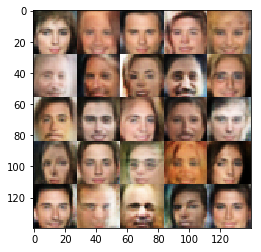


Batches:  81%|██████████████████████████████████████████████████████████              | 5100/6331 [09:38<02:23,  8.60batch/s]

Epoch 0/1... Batch 5110/6331... Discriminator loss: 0.8440 Generator loss: 1.3365
Epoch 0/1... Batch 5120/6331... Discriminator loss: 0.7791 Generator loss: 1.3854
Epoch 0/1... Batch 5130/6331... Discriminator loss: 1.1339 Generator loss: 1.0333
Epoch 0/1... Batch 5140/6331... Discriminator loss: 0.4354 Generator loss: 2.5102
Epoch 0/1... Batch 5150/6331... Discriminator loss: 0.5174 Generator loss: 2.2556
Epoch 0/1... Batch 5160/6331... Discriminator loss: 0.4572 Generator loss: 2.8760
Epoch 0/1... Batch 5170/6331... Discriminator loss: 0.4042 Generator loss: 2.4617
Epoch 0/1... Batch 5180/6331... Discriminator loss: 0.6200 Generator loss: 1.7209
Epoch 0/1... Batch 5190/6331... Discriminator loss: 0.4242 Generator loss: 2.5071
Epoch 0/1... Batch 5200/6331... Discriminator loss: 0.5343 Generator loss: 2.0782


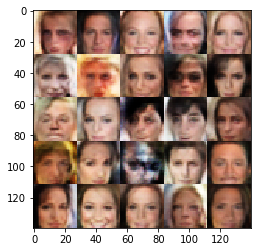


Batches:  82%|███████████████████████████████████████████████████████████▏            | 5200/6331 [09:49<02:10,  8.64batch/s]

Epoch 0/1... Batch 5210/6331... Discriminator loss: 0.3851 Generator loss: 3.2382
Epoch 0/1... Batch 5220/6331... Discriminator loss: 0.4116 Generator loss: 3.8860
Epoch 0/1... Batch 5230/6331... Discriminator loss: 0.7731 Generator loss: 1.0278
Epoch 0/1... Batch 5240/6331... Discriminator loss: 0.4976 Generator loss: 3.9840
Epoch 0/1... Batch 5250/6331... Discriminator loss: 0.8864 Generator loss: 0.7973
Epoch 0/1... Batch 5260/6331... Discriminator loss: 0.6629 Generator loss: 1.1338
Epoch 0/1... Batch 5270/6331... Discriminator loss: 0.4176 Generator loss: 2.6070
Epoch 0/1... Batch 5280/6331... Discriminator loss: 0.4770 Generator loss: 3.3676
Epoch 0/1... Batch 5290/6331... Discriminator loss: 1.0416 Generator loss: 0.8747
Epoch 0/1... Batch 5300/6331... Discriminator loss: 0.4395 Generator loss: 3.2381


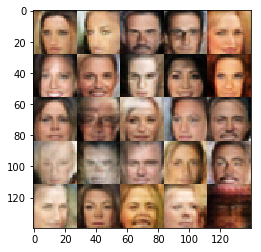


Batches:  84%|████████████████████████████████████████████████████████████▎           | 5300/6331 [10:00<01:59,  8.66batch/s]

Epoch 0/1... Batch 5310/6331... Discriminator loss: 0.8784 Generator loss: 1.9796
Epoch 0/1... Batch 5320/6331... Discriminator loss: 0.4611 Generator loss: 2.7603
Epoch 0/1... Batch 5330/6331... Discriminator loss: 0.5583 Generator loss: 1.7947
Epoch 0/1... Batch 5340/6331... Discriminator loss: 0.6925 Generator loss: 1.2273
Epoch 0/1... Batch 5350/6331... Discriminator loss: 1.1215 Generator loss: 5.2510
Epoch 0/1... Batch 5360/6331... Discriminator loss: 0.4111 Generator loss: 2.2989
Epoch 0/1... Batch 5370/6331... Discriminator loss: 0.6598 Generator loss: 4.3362
Epoch 0/1... Batch 5380/6331... Discriminator loss: 0.4473 Generator loss: 3.1144
Epoch 0/1... Batch 5390/6331... Discriminator loss: 0.5091 Generator loss: 2.7969
Epoch 0/1... Batch 5400/6331... Discriminator loss: 0.4797 Generator loss: 2.3310


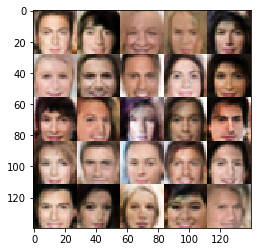


Batches:  85%|█████████████████████████████████████████████████████████████▍          | 5400/6331 [10:12<01:46,  8.71batch/s]

Epoch 0/1... Batch 5410/6331... Discriminator loss: 0.4231 Generator loss: 3.3266
Epoch 0/1... Batch 5420/6331... Discriminator loss: 0.3902 Generator loss: 3.5130
Epoch 0/1... Batch 5430/6331... Discriminator loss: 0.9594 Generator loss: 5.0926
Epoch 0/1... Batch 5440/6331... Discriminator loss: 0.9609 Generator loss: 0.9371
Epoch 0/1... Batch 5450/6331... Discriminator loss: 0.5093 Generator loss: 2.4107
Epoch 0/1... Batch 5460/6331... Discriminator loss: 1.2281 Generator loss: 4.3015
Epoch 0/1... Batch 5470/6331... Discriminator loss: 0.5114 Generator loss: 2.4567
Epoch 0/1... Batch 5480/6331... Discriminator loss: 0.4713 Generator loss: 2.2453
Epoch 0/1... Batch 5490/6331... Discriminator loss: 0.3859 Generator loss: 2.8212
Epoch 0/1... Batch 5500/6331... Discriminator loss: 0.5026 Generator loss: 2.6071


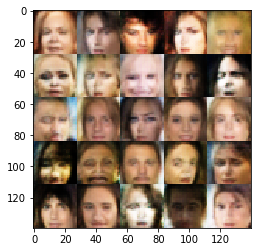


Batches:  87%|██████████████████████████████████████████████████████████████▌         | 5500/6331 [10:23<01:35,  8.74batch/s]

Epoch 0/1... Batch 5510/6331... Discriminator loss: 0.4400 Generator loss: 3.2065
Epoch 0/1... Batch 5520/6331... Discriminator loss: 0.4336 Generator loss: 2.8544
Epoch 0/1... Batch 5530/6331... Discriminator loss: 0.5132 Generator loss: 2.6983
Epoch 0/1... Batch 5540/6331... Discriminator loss: 0.4078 Generator loss: 2.9558
Epoch 0/1... Batch 5550/6331... Discriminator loss: 0.4082 Generator loss: 3.4791
Epoch 0/1... Batch 5560/6331... Discriminator loss: 0.6284 Generator loss: 3.6119
Epoch 0/1... Batch 5570/6331... Discriminator loss: 0.3889 Generator loss: 3.5914
Epoch 0/1... Batch 5580/6331... Discriminator loss: 0.4795 Generator loss: 2.8698
Epoch 0/1... Batch 5590/6331... Discriminator loss: 1.0362 Generator loss: 0.6876
Epoch 0/1... Batch 5600/6331... Discriminator loss: 0.3735 Generator loss: 3.3662


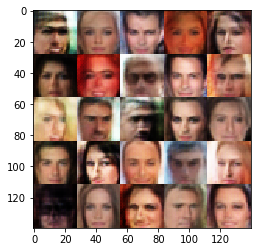


Batches:  88%|███████████████████████████████████████████████████████████████▋        | 5600/6331 [10:35<01:23,  8.76batch/s]

Epoch 0/1... Batch 5610/6331... Discriminator loss: 0.6643 Generator loss: 1.5621
Epoch 0/1... Batch 5620/6331... Discriminator loss: 0.7157 Generator loss: 1.5660
Epoch 0/1... Batch 5630/6331... Discriminator loss: 0.4830 Generator loss: 2.4932
Epoch 0/1... Batch 5640/6331... Discriminator loss: 0.4241 Generator loss: 3.5278
Epoch 0/1... Batch 5650/6331... Discriminator loss: 0.4363 Generator loss: 3.0154
Epoch 0/1... Batch 5660/6331... Discriminator loss: 0.4422 Generator loss: 2.7717
Epoch 0/1... Batch 5670/6331... Discriminator loss: 0.3668 Generator loss: 4.2487
Epoch 0/1... Batch 5680/6331... Discriminator loss: 0.4948 Generator loss: 3.1452
Epoch 0/1... Batch 5690/6331... Discriminator loss: 0.4304 Generator loss: 2.9747
Epoch 0/1... Batch 5700/6331... Discriminator loss: 0.6161 Generator loss: 1.9780


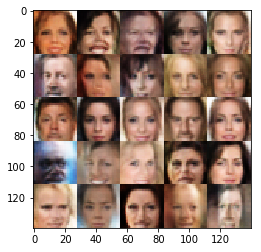


Batches:  90%|████████████████████████████████████████████████████████████████▊       | 5700/6331 [10:47<01:13,  8.62batch/s]

Epoch 0/1... Batch 5710/6331... Discriminator loss: 0.4025 Generator loss: 2.9069
Epoch 0/1... Batch 5720/6331... Discriminator loss: 0.4263 Generator loss: 3.0010
Epoch 0/1... Batch 5730/6331... Discriminator loss: 0.3935 Generator loss: 2.9431
Epoch 0/1... Batch 5740/6331... Discriminator loss: 0.6533 Generator loss: 1.9249
Epoch 0/1... Batch 5750/6331... Discriminator loss: 1.0151 Generator loss: 0.8693
Epoch 0/1... Batch 5760/6331... Discriminator loss: 0.4511 Generator loss: 3.3857
Epoch 0/1... Batch 5770/6331... Discriminator loss: 0.4085 Generator loss: 2.6449
Epoch 0/1... Batch 5780/6331... Discriminator loss: 0.3827 Generator loss: 4.0749
Epoch 0/1... Batch 5790/6331... Discriminator loss: 0.6059 Generator loss: 1.6818
Epoch 0/1... Batch 5800/6331... Discriminator loss: 1.0707 Generator loss: 0.9249


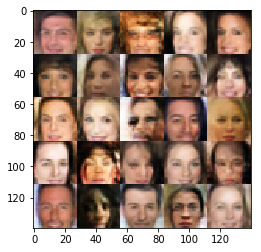


Batches:  92%|█████████████████████████████████████████████████████████████████▉      | 5800/6331 [10:58<01:01,  8.62batch/s]

Epoch 0/1... Batch 5810/6331... Discriminator loss: 0.4644 Generator loss: 2.9928
Epoch 0/1... Batch 5820/6331... Discriminator loss: 0.5367 Generator loss: 2.0173
Epoch 0/1... Batch 5830/6331... Discriminator loss: 0.6243 Generator loss: 1.9423
Epoch 0/1... Batch 5840/6331... Discriminator loss: 0.5061 Generator loss: 1.8756
Epoch 0/1... Batch 5850/6331... Discriminator loss: 0.5379 Generator loss: 2.8289
Epoch 0/1... Batch 5860/6331... Discriminator loss: 0.3763 Generator loss: 3.4258
Epoch 0/1... Batch 5870/6331... Discriminator loss: 0.4650 Generator loss: 3.5797
Epoch 0/1... Batch 5880/6331... Discriminator loss: 0.5159 Generator loss: 3.1079
Epoch 0/1... Batch 5890/6331... Discriminator loss: 0.4356 Generator loss: 3.5951
Epoch 0/1... Batch 5900/6331... Discriminator loss: 0.4190 Generator loss: 2.4703


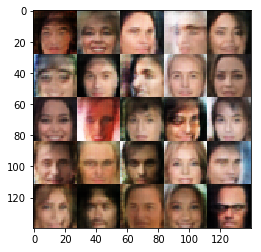


Batches:  93%|███████████████████████████████████████████████████████████████████     | 5900/6331 [11:10<00:49,  8.67batch/s]

Epoch 0/1... Batch 5910/6331... Discriminator loss: 0.4585 Generator loss: 3.6820
Epoch 0/1... Batch 5920/6331... Discriminator loss: 0.4059 Generator loss: 2.9092
Epoch 0/1... Batch 5930/6331... Discriminator loss: 0.4254 Generator loss: 4.0284
Epoch 0/1... Batch 5940/6331... Discriminator loss: 0.3640 Generator loss: 4.4309
Epoch 0/1... Batch 5950/6331... Discriminator loss: 0.4054 Generator loss: 3.8635
Epoch 0/1... Batch 5960/6331... Discriminator loss: 0.4039 Generator loss: 3.2841
Epoch 0/1... Batch 5970/6331... Discriminator loss: 0.8384 Generator loss: 0.9953
Epoch 0/1... Batch 5980/6331... Discriminator loss: 0.4390 Generator loss: 2.9727
Epoch 0/1... Batch 5990/6331... Discriminator loss: 0.7775 Generator loss: 4.4866
Epoch 0/1... Batch 6000/6331... Discriminator loss: 0.8524 Generator loss: 1.2075


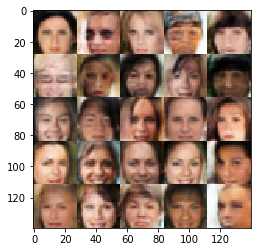


Batches:  95%|████████████████████████████████████████████████████████████████████▏   | 6000/6331 [11:21<00:37,  8.72batch/s]

Epoch 0/1... Batch 6010/6331... Discriminator loss: 0.4361 Generator loss: 3.2160
Epoch 0/1... Batch 6020/6331... Discriminator loss: 0.5762 Generator loss: 2.9023
Epoch 0/1... Batch 6030/6331... Discriminator loss: 0.4055 Generator loss: 3.1968
Epoch 0/1... Batch 6040/6331... Discriminator loss: 0.6100 Generator loss: 4.5020
Epoch 0/1... Batch 6050/6331... Discriminator loss: 0.5568 Generator loss: 1.2203
Epoch 0/1... Batch 6060/6331... Discriminator loss: 0.3625 Generator loss: 3.3773
Epoch 0/1... Batch 6070/6331... Discriminator loss: 0.3578 Generator loss: 4.2650
Epoch 0/1... Batch 6080/6331... Discriminator loss: 0.4002 Generator loss: 3.6133
Epoch 0/1... Batch 6090/6331... Discriminator loss: 0.4920 Generator loss: 2.3930
Epoch 0/1... Batch 6100/6331... Discriminator loss: 0.5943 Generator loss: 3.5053


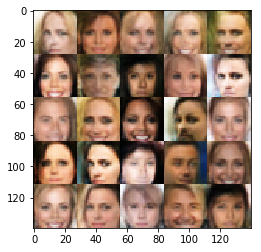


Batches:  96%|█████████████████████████████████████████████████████████████████████▎  | 6100/6331 [11:32<00:26,  8.73batch/s]

Epoch 0/1... Batch 6110/6331... Discriminator loss: 0.5464 Generator loss: 3.5500
Epoch 0/1... Batch 6120/6331... Discriminator loss: 0.6557 Generator loss: 4.7683
Epoch 0/1... Batch 6130/6331... Discriminator loss: 0.4537 Generator loss: 3.4716
Epoch 0/1... Batch 6140/6331... Discriminator loss: 0.4493 Generator loss: 2.4948
Epoch 0/1... Batch 6150/6331... Discriminator loss: 0.3796 Generator loss: 3.5770
Epoch 0/1... Batch 6160/6331... Discriminator loss: 0.3767 Generator loss: 3.3824
Epoch 0/1... Batch 6170/6331... Discriminator loss: 0.4506 Generator loss: 2.1545
Epoch 0/1... Batch 6180/6331... Discriminator loss: 0.3783 Generator loss: 3.1642
Epoch 0/1... Batch 6190/6331... Discriminator loss: 0.3596 Generator loss: 4.1828
Epoch 0/1... Batch 6200/6331... Discriminator loss: 0.7115 Generator loss: 1.8006


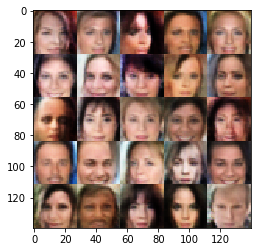


Batches:  98%|██████████████████████████████████████████████████████████████████████▌ | 6200/6331 [11:44<00:15,  8.70batch/s]

Epoch 0/1... Batch 6210/6331... Discriminator loss: 0.5586 Generator loss: 2.3713
Epoch 0/1... Batch 6220/6331... Discriminator loss: 0.4286 Generator loss: 3.1744
Epoch 0/1... Batch 6230/6331... Discriminator loss: 0.3520 Generator loss: 4.5758
Epoch 0/1... Batch 6240/6331... Discriminator loss: 0.5850 Generator loss: 2.1589
Epoch 0/1... Batch 6250/6331... Discriminator loss: 0.5179 Generator loss: 3.6628
Epoch 0/1... Batch 6260/6331... Discriminator loss: 0.5605 Generator loss: 2.1163
Epoch 0/1... Batch 6270/6331... Discriminator loss: 0.8593 Generator loss: 1.4004
Epoch 0/1... Batch 6280/6331... Discriminator loss: 0.4054 Generator loss: 3.6021
Epoch 0/1... Batch 6290/6331... Discriminator loss: 0.9416 Generator loss: 0.7954
Epoch 0/1... Batch 6300/6331... Discriminator loss: 0.4297 Generator loss: 2.6208


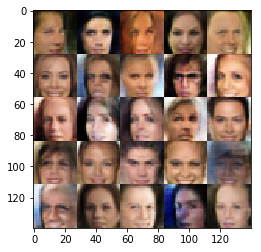


Batches: 100%|███████████████████████████████████████████████████████████████████████▋| 6300/6331 [11:56<00:03,  8.66batch/s]

Epoch 0/1... Batch 6310/6331... Discriminator loss: 0.4134 Generator loss: 3.9130
Epoch 0/1... Batch 6320/6331... Discriminator loss: 0.4594 Generator loss: 2.6797
Epoch 0/1... Batch 6330/6331... Discriminator loss: 0.4561 Generator loss: 2.5558



Epochs: 100%|██████████████████████████████████████████████████████████████████████████████| 1/1 [11:59<00:00, 719.33s/epoch]


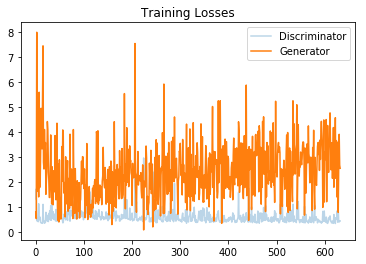

In [38]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5
alpha = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode, alpha)

# current test

Batches:   0%|                                                                                   | 0/3165 [00:00<?, ?batch/s]

Epoch 0/2... Batch 10/3165... Discriminator loss: 0.6451 Generator loss: 1.8679
Epoch 0/2... Batch 20/3165... Discriminator loss: 0.4525 Generator loss: 4.5850
Epoch 0/2... Batch 30/3165... Discriminator loss: 1.7000 Generator loss: 10.8970
Epoch 0/2... Batch 40/3165... Discriminator loss: 0.4110 Generator loss: 2.9985
Epoch 0/2... Batch 50/3165... Discriminator loss: 0.4503 Generator loss: 5.2205
Epoch 0/2... Batch 60/3165... Discriminator loss: 0.7560 Generator loss: 2.5708
Epoch 0/2... Batch 70/3165... Discriminator loss: 0.5309 Generator loss: 2.7253
Epoch 0/2... Batch 80/3165... Discriminator loss: 0.4610 Generator loss: 3.4677
Epoch 0/2... Batch 90/3165... Discriminator loss: 0.4788 Generator loss: 5.8537
Epoch 0/2... Batch 100/3165... Discriminator loss: 0.4116 Generator loss: 2.9406


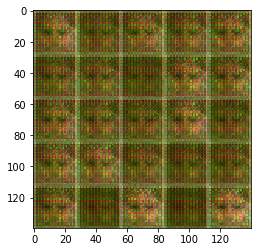


Batches:   3%|██▎                                                                      | 100/3165 [00:18<09:39,  5.29batch/s]

Epoch 0/2... Batch 110/3165... Discriminator loss: 0.4178 Generator loss: 4.0965
Epoch 0/2... Batch 120/3165... Discriminator loss: 0.6207 Generator loss: 1.9719
Epoch 0/2... Batch 130/3165... Discriminator loss: 0.4043 Generator loss: 3.6209
Epoch 0/2... Batch 140/3165... Discriminator loss: 0.4756 Generator loss: 2.3263
Epoch 0/2... Batch 150/3165... Discriminator loss: 0.3989 Generator loss: 3.1194
Epoch 0/2... Batch 160/3165... Discriminator loss: 0.3794 Generator loss: 3.5397
Epoch 0/2... Batch 170/3165... Discriminator loss: 0.3764 Generator loss: 3.5525
Epoch 0/2... Batch 180/3165... Discriminator loss: 0.4121 Generator loss: 2.8591
Epoch 0/2... Batch 190/3165... Discriminator loss: 0.4060 Generator loss: 3.3742
Epoch 0/2... Batch 200/3165... Discriminator loss: 0.9119 Generator loss: 0.9370


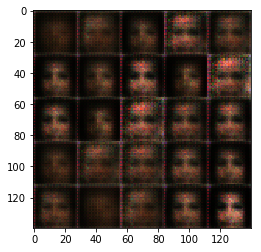


Batches:   6%|████▌                                                                    | 200/3165 [00:38<09:30,  5.20batch/s]

Epoch 0/2... Batch 210/3165... Discriminator loss: 0.8636 Generator loss: 1.9672
Epoch 0/2... Batch 220/3165... Discriminator loss: 0.7459 Generator loss: 4.0737
Epoch 0/2... Batch 230/3165... Discriminator loss: 0.6424 Generator loss: 2.7084
Epoch 0/2... Batch 240/3165... Discriminator loss: 0.5302 Generator loss: 2.9018
Epoch 0/2... Batch 250/3165... Discriminator loss: 0.4138 Generator loss: 3.3246
Epoch 0/2... Batch 260/3165... Discriminator loss: 0.7644 Generator loss: 4.7760
Epoch 0/2... Batch 270/3165... Discriminator loss: 0.5616 Generator loss: 2.5498
Epoch 0/2... Batch 280/3165... Discriminator loss: 0.5121 Generator loss: 2.2716
Epoch 0/2... Batch 290/3165... Discriminator loss: 0.7432 Generator loss: 1.3852
Epoch 0/2... Batch 300/3165... Discriminator loss: 0.6048 Generator loss: 1.7151


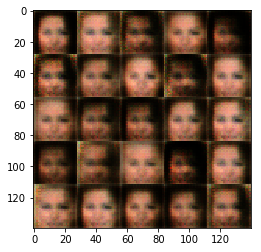


Batches:   9%|██████▉                                                                  | 300/3165 [00:57<09:09,  5.21batch/s]

Epoch 0/2... Batch 310/3165... Discriminator loss: 0.6184 Generator loss: 1.9989
Epoch 0/2... Batch 320/3165... Discriminator loss: 0.5247 Generator loss: 2.3164
Epoch 0/2... Batch 330/3165... Discriminator loss: 0.6748 Generator loss: 2.7706
Epoch 0/2... Batch 340/3165... Discriminator loss: 0.6260 Generator loss: 1.5448
Epoch 0/2... Batch 350/3165... Discriminator loss: 0.8027 Generator loss: 1.0598
Epoch 0/2... Batch 360/3165... Discriminator loss: 0.8336 Generator loss: 3.7580
Epoch 0/2... Batch 370/3165... Discriminator loss: 0.8745 Generator loss: 1.0297
Epoch 0/2... Batch 380/3165... Discriminator loss: 1.2566 Generator loss: 4.3919
Epoch 0/2... Batch 390/3165... Discriminator loss: 0.5792 Generator loss: 2.1669
Epoch 0/2... Batch 400/3165... Discriminator loss: 0.7744 Generator loss: 1.8511


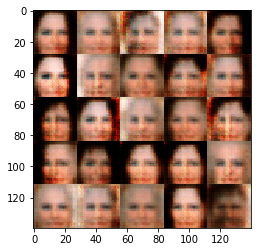


Batches:  13%|█████████▏                                                               | 400/3165 [01:17<08:57,  5.14batch/s]

Epoch 0/2... Batch 410/3165... Discriminator loss: 0.5289 Generator loss: 1.9975
Epoch 0/2... Batch 420/3165... Discriminator loss: 0.8773 Generator loss: 1.3746
Epoch 0/2... Batch 430/3165... Discriminator loss: 0.6110 Generator loss: 2.4996
Epoch 0/2... Batch 440/3165... Discriminator loss: 0.6753 Generator loss: 2.6721
Epoch 0/2... Batch 450/3165... Discriminator loss: 0.7203 Generator loss: 2.4728
Epoch 0/2... Batch 460/3165... Discriminator loss: 0.5042 Generator loss: 2.0376
Epoch 0/2... Batch 470/3165... Discriminator loss: 2.2803 Generator loss: 0.2824
Epoch 0/2... Batch 480/3165... Discriminator loss: 1.4635 Generator loss: 0.4620
Epoch 0/2... Batch 490/3165... Discriminator loss: 0.8521 Generator loss: 2.8178
Epoch 0/2... Batch 500/3165... Discriminator loss: 0.9038 Generator loss: 0.9372


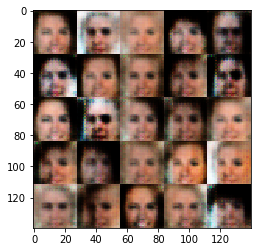


Batches:  16%|███████████▌                                                             | 500/3165 [01:37<08:41,  5.11batch/s]

Epoch 0/2... Batch 510/3165... Discriminator loss: 0.5536 Generator loss: 2.2645
Epoch 0/2... Batch 520/3165... Discriminator loss: 0.5247 Generator loss: 2.1124
Epoch 0/2... Batch 530/3165... Discriminator loss: 1.2298 Generator loss: 5.8745
Epoch 0/2... Batch 540/3165... Discriminator loss: 0.5645 Generator loss: 2.2557
Epoch 0/2... Batch 550/3165... Discriminator loss: 0.4932 Generator loss: 2.5913
Epoch 0/2... Batch 560/3165... Discriminator loss: 0.8700 Generator loss: 1.0335
Epoch 0/2... Batch 570/3165... Discriminator loss: 0.6700 Generator loss: 2.6324
Epoch 0/2... Batch 580/3165... Discriminator loss: 0.6218 Generator loss: 1.6430
Epoch 0/2... Batch 590/3165... Discriminator loss: 0.4688 Generator loss: 2.8963
Epoch 0/2... Batch 600/3165... Discriminator loss: 0.6882 Generator loss: 1.7654


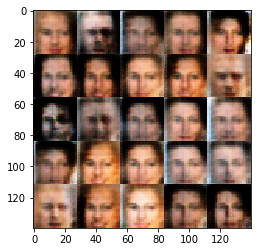


Batches:  19%|█████████████▊                                                           | 600/3165 [01:57<08:20,  5.12batch/s]

Epoch 0/2... Batch 610/3165... Discriminator loss: 0.7778 Generator loss: 2.3860
Epoch 0/2... Batch 620/3165... Discriminator loss: 0.5808 Generator loss: 2.7105
Epoch 0/2... Batch 630/3165... Discriminator loss: 0.6015 Generator loss: 2.7080
Epoch 0/2... Batch 640/3165... Discriminator loss: 0.7896 Generator loss: 1.4716
Epoch 0/2... Batch 650/3165... Discriminator loss: 0.6075 Generator loss: 2.1825
Epoch 0/2... Batch 660/3165... Discriminator loss: 1.1610 Generator loss: 0.6308
Epoch 0/2... Batch 670/3165... Discriminator loss: 0.5828 Generator loss: 2.2330
Epoch 0/2... Batch 680/3165... Discriminator loss: 0.7742 Generator loss: 3.6606
Epoch 0/2... Batch 690/3165... Discriminator loss: 0.9482 Generator loss: 0.9103
Epoch 0/2... Batch 700/3165... Discriminator loss: 0.7390 Generator loss: 1.5549


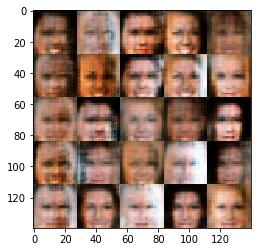


Batches:  22%|████████████████▏                                                        | 700/3165 [02:16<07:57,  5.16batch/s]

Epoch 0/2... Batch 710/3165... Discriminator loss: 0.9527 Generator loss: 0.9506
Epoch 0/2... Batch 720/3165... Discriminator loss: 0.5866 Generator loss: 1.9789
Epoch 0/2... Batch 730/3165... Discriminator loss: 0.9600 Generator loss: 0.8626
Epoch 0/2... Batch 740/3165... Discriminator loss: 0.7325 Generator loss: 1.4352
Epoch 0/2... Batch 750/3165... Discriminator loss: 0.7223 Generator loss: 2.9284
Epoch 0/2... Batch 760/3165... Discriminator loss: 0.7090 Generator loss: 2.2397
Epoch 0/2... Batch 770/3165... Discriminator loss: 0.6567 Generator loss: 1.8530
Epoch 0/2... Batch 780/3165... Discriminator loss: 0.9902 Generator loss: 1.0465
Epoch 0/2... Batch 790/3165... Discriminator loss: 1.3915 Generator loss: 0.4487
Epoch 0/2... Batch 800/3165... Discriminator loss: 0.6813 Generator loss: 1.5501


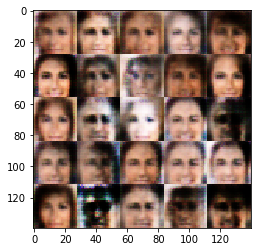


Batches:  25%|██████████████████▍                                                      | 800/3165 [02:35<07:40,  5.13batch/s]

Epoch 0/2... Batch 810/3165... Discriminator loss: 0.7662 Generator loss: 1.1680
Epoch 0/2... Batch 820/3165... Discriminator loss: 0.9728 Generator loss: 1.0642
Epoch 0/2... Batch 830/3165... Discriminator loss: 1.6499 Generator loss: 0.4146
Epoch 0/2... Batch 840/3165... Discriminator loss: 0.6722 Generator loss: 1.7569
Epoch 0/2... Batch 850/3165... Discriminator loss: 1.0048 Generator loss: 0.9195
Epoch 0/2... Batch 860/3165... Discriminator loss: 0.6022 Generator loss: 1.8497
Epoch 0/2... Batch 870/3165... Discriminator loss: 0.8547 Generator loss: 2.8785
Epoch 0/2... Batch 880/3165... Discriminator loss: 0.7065 Generator loss: 2.1130
Epoch 0/2... Batch 890/3165... Discriminator loss: 1.2443 Generator loss: 5.1392
Epoch 0/2... Batch 900/3165... Discriminator loss: 0.9919 Generator loss: 0.8122


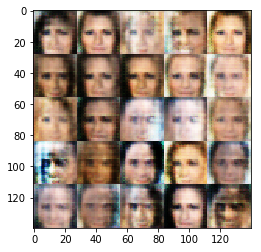


Batches:  28%|████████████████████▊                                                    | 900/3165 [02:54<07:17,  5.18batch/s]

Epoch 0/2... Batch 910/3165... Discriminator loss: 0.9804 Generator loss: 0.9298
Epoch 0/2... Batch 920/3165... Discriminator loss: 0.6859 Generator loss: 2.8906
Epoch 0/2... Batch 930/3165... Discriminator loss: 0.7274 Generator loss: 2.1148
Epoch 0/2... Batch 940/3165... Discriminator loss: 0.6652 Generator loss: 1.7227
Epoch 0/2... Batch 950/3165... Discriminator loss: 0.5991 Generator loss: 2.0470
Epoch 0/2... Batch 960/3165... Discriminator loss: 0.9446 Generator loss: 0.8290
Epoch 0/2... Batch 970/3165... Discriminator loss: 0.6359 Generator loss: 1.5868
Epoch 0/2... Batch 980/3165... Discriminator loss: 1.0600 Generator loss: 0.8966
Epoch 0/2... Batch 990/3165... Discriminator loss: 0.6076 Generator loss: 1.8868
Epoch 0/2... Batch 1000/3165... Discriminator loss: 0.8187 Generator loss: 3.5306


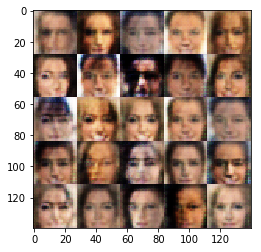


Batches:  32%|██████████████████████▋                                                 | 1000/3165 [03:13<06:56,  5.20batch/s]

Epoch 0/2... Batch 1010/3165... Discriminator loss: 0.5870 Generator loss: 1.9730
Epoch 0/2... Batch 1020/3165... Discriminator loss: 0.6559 Generator loss: 1.6370
Epoch 0/2... Batch 1030/3165... Discriminator loss: 1.1103 Generator loss: 0.7957
Epoch 0/2... Batch 1040/3165... Discriminator loss: 0.5945 Generator loss: 1.8807
Epoch 0/2... Batch 1050/3165... Discriminator loss: 0.6873 Generator loss: 1.5691
Epoch 0/2... Batch 1060/3165... Discriminator loss: 0.6626 Generator loss: 1.6338
Epoch 0/2... Batch 1070/3165... Discriminator loss: 0.6047 Generator loss: 1.9920
Epoch 0/2... Batch 1080/3165... Discriminator loss: 0.5658 Generator loss: 1.6903
Epoch 0/2... Batch 1090/3165... Discriminator loss: 0.6292 Generator loss: 1.5891
Epoch 0/2... Batch 1100/3165... Discriminator loss: 0.5590 Generator loss: 1.9203


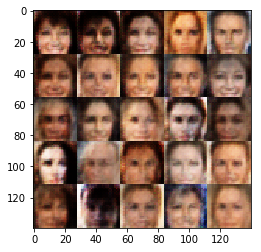


Batches:  35%|█████████████████████████                                               | 1100/3165 [03:33<06:37,  5.19batch/s]

Epoch 0/2... Batch 1110/3165... Discriminator loss: 0.7027 Generator loss: 2.4639
Epoch 0/2... Batch 1120/3165... Discriminator loss: 0.4670 Generator loss: 2.8695
Epoch 0/2... Batch 1130/3165... Discriminator loss: 0.6292 Generator loss: 2.0842
Epoch 0/2... Batch 1140/3165... Discriminator loss: 0.6380 Generator loss: 1.6142
Epoch 0/2... Batch 1150/3165... Discriminator loss: 0.5222 Generator loss: 2.8141
Epoch 0/2... Batch 1160/3165... Discriminator loss: 0.8537 Generator loss: 3.7746
Epoch 0/2... Batch 1170/3165... Discriminator loss: 1.2411 Generator loss: 0.6722
Epoch 0/2... Batch 1180/3165... Discriminator loss: 0.5276 Generator loss: 3.0339
Epoch 0/2... Batch 1190/3165... Discriminator loss: 1.0022 Generator loss: 0.8210
Epoch 0/2... Batch 1200/3165... Discriminator loss: 0.4933 Generator loss: 2.5048


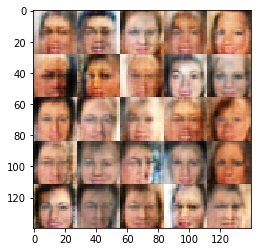


Batches:  38%|███████████████████████████▎                                            | 1200/3165 [03:54<06:28,  5.06batch/s]

Epoch 0/2... Batch 1210/3165... Discriminator loss: 0.6704 Generator loss: 1.9442
Epoch 0/2... Batch 1220/3165... Discriminator loss: 1.0178 Generator loss: 0.9247
Epoch 0/2... Batch 1230/3165... Discriminator loss: 0.7142 Generator loss: 1.6184
Epoch 0/2... Batch 1240/3165... Discriminator loss: 0.5879 Generator loss: 1.8247
Epoch 0/2... Batch 1250/3165... Discriminator loss: 0.6486 Generator loss: 1.4438
Epoch 0/2... Batch 1260/3165... Discriminator loss: 0.6133 Generator loss: 1.6533
Epoch 0/2... Batch 1270/3165... Discriminator loss: 0.7121 Generator loss: 1.7292
Epoch 0/2... Batch 1280/3165... Discriminator loss: 0.6082 Generator loss: 3.1893
Epoch 0/2... Batch 1290/3165... Discriminator loss: 0.7018 Generator loss: 1.5534
Epoch 0/2... Batch 1300/3165... Discriminator loss: 0.7582 Generator loss: 1.5210


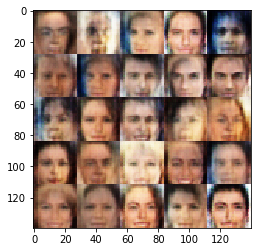


Batches:  41%|█████████████████████████████▌                                          | 1300/3165 [04:14<06:13,  5.00batch/s]

Epoch 0/2... Batch 1310/3165... Discriminator loss: 0.6712 Generator loss: 1.5426
Epoch 0/2... Batch 1320/3165... Discriminator loss: 0.5247 Generator loss: 2.1056
Epoch 0/2... Batch 1330/3165... Discriminator loss: 0.6104 Generator loss: 1.8543
Epoch 0/2... Batch 1340/3165... Discriminator loss: 0.6939 Generator loss: 1.2228
Epoch 0/2... Batch 1350/3165... Discriminator loss: 0.5859 Generator loss: 1.7268
Epoch 0/2... Batch 1360/3165... Discriminator loss: 0.7867 Generator loss: 1.0454
Epoch 0/2... Batch 1370/3165... Discriminator loss: 0.7864 Generator loss: 3.0411
Epoch 0/2... Batch 1380/3165... Discriminator loss: 1.0575 Generator loss: 3.3637
Epoch 0/2... Batch 1390/3165... Discriminator loss: 0.4016 Generator loss: 2.9340
Epoch 0/2... Batch 1400/3165... Discriminator loss: 0.5657 Generator loss: 2.5131


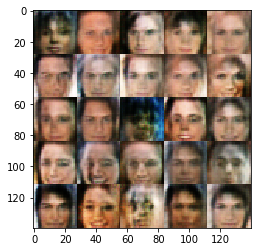


Batches:  44%|███████████████████████████████▊                                        | 1400/3165 [04:36<06:02,  4.86batch/s]

Epoch 0/2... Batch 1410/3165... Discriminator loss: 0.5373 Generator loss: 1.9123
Epoch 0/2... Batch 1420/3165... Discriminator loss: 0.6801 Generator loss: 2.7687
Epoch 0/2... Batch 1430/3165... Discriminator loss: 2.0603 Generator loss: 0.3155
Epoch 0/2... Batch 1440/3165... Discriminator loss: 0.6741 Generator loss: 1.4573
Epoch 0/2... Batch 1450/3165... Discriminator loss: 0.6368 Generator loss: 1.5435
Epoch 0/2... Batch 1460/3165... Discriminator loss: 0.6690 Generator loss: 2.2079
Epoch 0/2... Batch 1470/3165... Discriminator loss: 0.6348 Generator loss: 1.5385
Epoch 0/2... Batch 1480/3165... Discriminator loss: 0.8962 Generator loss: 0.8484
Epoch 0/2... Batch 1490/3165... Discriminator loss: 0.6143 Generator loss: 1.8736
Epoch 0/2... Batch 1500/3165... Discriminator loss: 0.6569 Generator loss: 1.5320


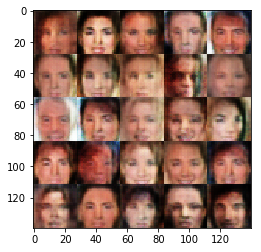


Batches:  47%|██████████████████████████████████                                      | 1500/3165 [04:59<05:53,  4.72batch/s]

Epoch 0/2... Batch 1510/3165... Discriminator loss: 0.5662 Generator loss: 1.7351
Epoch 0/2... Batch 1520/3165... Discriminator loss: 1.0841 Generator loss: 0.8712
Epoch 0/2... Batch 1530/3165... Discriminator loss: 0.4670 Generator loss: 2.7031
Epoch 0/2... Batch 1540/3165... Discriminator loss: 0.5712 Generator loss: 1.9490
Epoch 0/2... Batch 1550/3165... Discriminator loss: 0.5559 Generator loss: 2.0439
Epoch 0/2... Batch 1560/3165... Discriminator loss: 0.5453 Generator loss: 2.1548
Epoch 0/2... Batch 1570/3165... Discriminator loss: 0.6506 Generator loss: 1.6023
Epoch 0/2... Batch 1580/3165... Discriminator loss: 0.4474 Generator loss: 2.5808
Epoch 0/2... Batch 1590/3165... Discriminator loss: 1.0969 Generator loss: 0.6249
Epoch 0/2... Batch 1600/3165... Discriminator loss: 0.8193 Generator loss: 1.1330


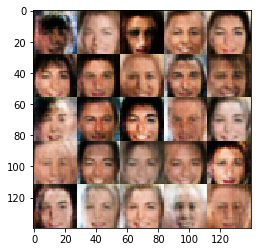


Batches:  51%|████████████████████████████████████▍                                   | 1600/3165 [05:21<05:34,  4.68batch/s]

Epoch 0/2... Batch 1610/3165... Discriminator loss: 0.6107 Generator loss: 1.8814
Epoch 0/2... Batch 1620/3165... Discriminator loss: 0.9544 Generator loss: 0.8404
Epoch 0/2... Batch 1630/3165... Discriminator loss: 0.5350 Generator loss: 2.5034
Epoch 0/2... Batch 1640/3165... Discriminator loss: 0.7822 Generator loss: 1.2975
Epoch 0/2... Batch 1650/3165... Discriminator loss: 0.7750 Generator loss: 1.3388
Epoch 0/2... Batch 1660/3165... Discriminator loss: 0.7915 Generator loss: 1.1594
Epoch 0/2... Batch 1670/3165... Discriminator loss: 0.6442 Generator loss: 1.7595
Epoch 0/2... Batch 1680/3165... Discriminator loss: 0.6153 Generator loss: 1.7565
Epoch 0/2... Batch 1690/3165... Discriminator loss: 0.6314 Generator loss: 1.6374
Epoch 0/2... Batch 1700/3165... Discriminator loss: 0.5207 Generator loss: 2.4532


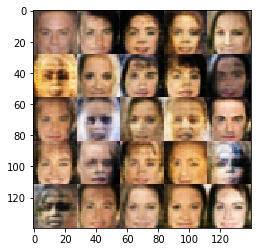


Batches:  54%|██████████████████████████████████████▋                                 | 1700/3165 [05:40<05:05,  4.80batch/s]

Epoch 0/2... Batch 1710/3165... Discriminator loss: 0.8021 Generator loss: 3.4550
Epoch 0/2... Batch 1720/3165... Discriminator loss: 0.8262 Generator loss: 3.1464
Epoch 0/2... Batch 1730/3165... Discriminator loss: 0.7970 Generator loss: 4.0103
Epoch 0/2... Batch 1740/3165... Discriminator loss: 0.6020 Generator loss: 1.7759
Epoch 0/2... Batch 1750/3165... Discriminator loss: 0.4876 Generator loss: 2.2597
Epoch 0/2... Batch 1760/3165... Discriminator loss: 0.6159 Generator loss: 1.5184
Epoch 0/2... Batch 1770/3165... Discriminator loss: 0.5441 Generator loss: 2.9056
Epoch 0/2... Batch 1780/3165... Discriminator loss: 0.4946 Generator loss: 2.2091
Epoch 0/2... Batch 1790/3165... Discriminator loss: 0.4805 Generator loss: 2.2264
Epoch 0/2... Batch 1800/3165... Discriminator loss: 0.7297 Generator loss: 1.1950


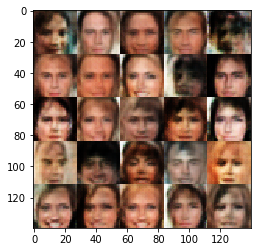


Batches:  57%|████████████████████████████████████████▉                               | 1800/3165 [06:00<04:38,  4.90batch/s]

Epoch 0/2... Batch 1810/3165... Discriminator loss: 0.6080 Generator loss: 1.9010
Epoch 0/2... Batch 1820/3165... Discriminator loss: 1.2912 Generator loss: 0.5796
Epoch 0/2... Batch 1830/3165... Discriminator loss: 0.5670 Generator loss: 2.2430
Epoch 0/2... Batch 1840/3165... Discriminator loss: 0.8495 Generator loss: 0.9510
Epoch 0/2... Batch 1850/3165... Discriminator loss: 0.4998 Generator loss: 2.2220
Epoch 0/2... Batch 1860/3165... Discriminator loss: 0.4789 Generator loss: 3.9775
Epoch 0/2... Batch 1870/3165... Discriminator loss: 0.7274 Generator loss: 2.7034
Epoch 0/2... Batch 1880/3165... Discriminator loss: 0.4788 Generator loss: 2.4862
Epoch 0/2... Batch 1890/3165... Discriminator loss: 0.7055 Generator loss: 1.2527
Epoch 0/2... Batch 1900/3165... Discriminator loss: 0.5589 Generator loss: 1.9079


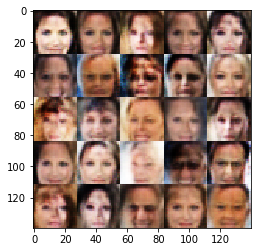


Batches:  60%|███████████████████████████████████████████▏                            | 1900/3165 [06:19<04:14,  4.97batch/s]

Epoch 0/2... Batch 1910/3165... Discriminator loss: 0.5884 Generator loss: 2.3785
Epoch 0/2... Batch 1920/3165... Discriminator loss: 0.5174 Generator loss: 2.3924
Epoch 0/2... Batch 1930/3165... Discriminator loss: 0.6767 Generator loss: 1.4354
Epoch 0/2... Batch 1940/3165... Discriminator loss: 1.3409 Generator loss: 2.1872
Epoch 0/2... Batch 1950/3165... Discriminator loss: 0.6986 Generator loss: 1.4680
Epoch 0/2... Batch 1960/3165... Discriminator loss: 1.2068 Generator loss: 3.5571
Epoch 0/2... Batch 1970/3165... Discriminator loss: 0.6006 Generator loss: 1.7084
Epoch 0/2... Batch 1980/3165... Discriminator loss: 0.6446 Generator loss: 1.3780
Epoch 0/2... Batch 1990/3165... Discriminator loss: 0.4671 Generator loss: 2.1882
Epoch 0/2... Batch 2000/3165... Discriminator loss: 0.5057 Generator loss: 3.8814


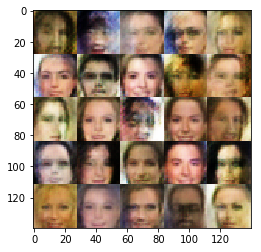


Batches:  63%|█████████████████████████████████████████████▍                          | 2000/3165 [06:39<03:54,  4.96batch/s]

Epoch 0/2... Batch 2010/3165... Discriminator loss: 0.6755 Generator loss: 1.4045
Epoch 0/2... Batch 2020/3165... Discriminator loss: 0.5664 Generator loss: 1.8923
Epoch 0/2... Batch 2030/3165... Discriminator loss: 0.5197 Generator loss: 2.7107
Epoch 0/2... Batch 2040/3165... Discriminator loss: 0.5285 Generator loss: 2.0762
Epoch 0/2... Batch 2050/3165... Discriminator loss: 0.4525 Generator loss: 2.6736
Epoch 0/2... Batch 2060/3165... Discriminator loss: 0.4867 Generator loss: 3.1950
Epoch 0/2... Batch 2070/3165... Discriminator loss: 0.6885 Generator loss: 1.5550
Epoch 0/2... Batch 2080/3165... Discriminator loss: 1.0634 Generator loss: 0.6673
Epoch 0/2... Batch 2090/3165... Discriminator loss: 1.0964 Generator loss: 0.9351
Epoch 0/2... Batch 2100/3165... Discriminator loss: 0.5670 Generator loss: 1.9332


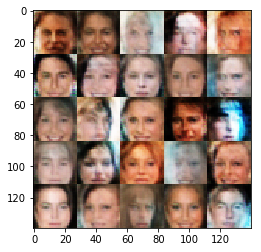


Batches:  66%|███████████████████████████████████████████████▊                        | 2100/3165 [06:59<03:32,  5.01batch/s]

Epoch 0/2... Batch 2110/3165... Discriminator loss: 0.5226 Generator loss: 2.2163
Epoch 0/2... Batch 2120/3165... Discriminator loss: 0.6773 Generator loss: 1.5523
Epoch 0/2... Batch 2130/3165... Discriminator loss: 0.4417 Generator loss: 2.7033
Epoch 0/2... Batch 2140/3165... Discriminator loss: 0.6031 Generator loss: 1.3789
Epoch 0/2... Batch 2150/3165... Discriminator loss: 0.5135 Generator loss: 1.9779
Epoch 0/2... Batch 2160/3165... Discriminator loss: 0.6348 Generator loss: 1.5863
Epoch 0/2... Batch 2170/3165... Discriminator loss: 0.6469 Generator loss: 1.4920
Epoch 0/2... Batch 2180/3165... Discriminator loss: 0.6326 Generator loss: 1.7698
Epoch 0/2... Batch 2190/3165... Discriminator loss: 1.3108 Generator loss: 1.9643
Epoch 0/2... Batch 2200/3165... Discriminator loss: 0.6279 Generator loss: 1.9390


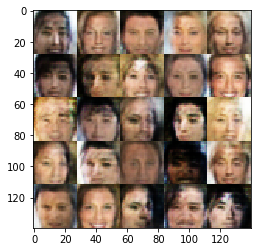


Batches:  70%|██████████████████████████████████████████████████                      | 2200/3165 [07:18<03:11,  5.04batch/s]

Epoch 0/2... Batch 2210/3165... Discriminator loss: 0.7585 Generator loss: 1.5632
Epoch 0/2... Batch 2220/3165... Discriminator loss: 0.4642 Generator loss: 2.3191
Epoch 0/2... Batch 2230/3165... Discriminator loss: 0.6622 Generator loss: 1.2614
Epoch 0/2... Batch 2240/3165... Discriminator loss: 0.5680 Generator loss: 1.7478
Epoch 0/2... Batch 2250/3165... Discriminator loss: 0.6382 Generator loss: 2.9186
Epoch 0/2... Batch 2260/3165... Discriminator loss: 0.5193 Generator loss: 3.0887
Epoch 0/2... Batch 2270/3165... Discriminator loss: 0.4479 Generator loss: 3.3582
Epoch 0/2... Batch 2280/3165... Discriminator loss: 0.4430 Generator loss: 2.6635
Epoch 0/2... Batch 2290/3165... Discriminator loss: 0.4642 Generator loss: 2.1754
Epoch 0/2... Batch 2300/3165... Discriminator loss: 0.4415 Generator loss: 2.6231


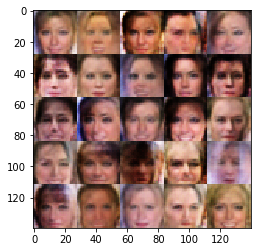


Batches:  73%|████████████████████████████████████████████████████▎                   | 2300/3165 [07:38<02:50,  5.08batch/s]

Epoch 0/2... Batch 2310/3165... Discriminator loss: 0.6383 Generator loss: 1.5686
Epoch 0/2... Batch 2320/3165... Discriminator loss: 1.1513 Generator loss: 3.3501
Epoch 0/2... Batch 2330/3165... Discriminator loss: 0.6529 Generator loss: 2.0571
Epoch 0/2... Batch 2340/3165... Discriminator loss: 0.6498 Generator loss: 1.5233
Epoch 0/2... Batch 2350/3165... Discriminator loss: 0.4799 Generator loss: 2.1372
Epoch 0/2... Batch 2360/3165... Discriminator loss: 0.5393 Generator loss: 2.0081
Epoch 0/2... Batch 2370/3165... Discriminator loss: 0.6318 Generator loss: 1.6879
Epoch 0/2... Batch 2380/3165... Discriminator loss: 0.4619 Generator loss: 2.9450
Epoch 0/2... Batch 2390/3165... Discriminator loss: 0.5153 Generator loss: 1.9588
Epoch 0/2... Batch 2400/3165... Discriminator loss: 0.4739 Generator loss: 2.3372


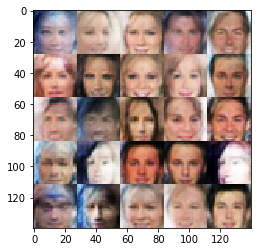


Batches:  76%|██████████████████████████████████████████████████████▌                 | 2400/3165 [07:57<02:29,  5.10batch/s]

Epoch 0/2... Batch 2410/3165... Discriminator loss: 0.4841 Generator loss: 2.5461
Epoch 0/2... Batch 2420/3165... Discriminator loss: 0.5280 Generator loss: 3.5154
Epoch 0/2... Batch 2430/3165... Discriminator loss: 0.5487 Generator loss: 2.1641
Epoch 0/2... Batch 2440/3165... Discriminator loss: 0.7365 Generator loss: 1.1785
Epoch 0/2... Batch 2450/3165... Discriminator loss: 0.8558 Generator loss: 3.7440
Epoch 0/2... Batch 2460/3165... Discriminator loss: 1.3455 Generator loss: 0.5134
Epoch 0/2... Batch 2470/3165... Discriminator loss: 0.5396 Generator loss: 2.1393
Epoch 0/2... Batch 2480/3165... Discriminator loss: 0.4605 Generator loss: 2.5499
Epoch 0/2... Batch 2490/3165... Discriminator loss: 0.5216 Generator loss: 2.2510
Epoch 0/2... Batch 2500/3165... Discriminator loss: 0.5973 Generator loss: 1.6461


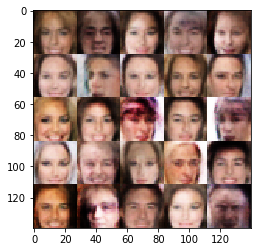


Batches:  79%|████████████████████████████████████████████████████████▊               | 2500/3165 [08:17<02:10,  5.11batch/s]

Epoch 0/2... Batch 2510/3165... Discriminator loss: 0.4272 Generator loss: 2.7204
Epoch 0/2... Batch 2520/3165... Discriminator loss: 0.8920 Generator loss: 1.0680
Epoch 0/2... Batch 2530/3165... Discriminator loss: 0.5170 Generator loss: 4.4174
Epoch 0/2... Batch 2540/3165... Discriminator loss: 0.4796 Generator loss: 2.5531
Epoch 0/2... Batch 2550/3165... Discriminator loss: 0.6020 Generator loss: 1.8694
Epoch 0/2... Batch 2560/3165... Discriminator loss: 0.4472 Generator loss: 2.7172
Epoch 0/2... Batch 2570/3165... Discriminator loss: 1.7346 Generator loss: 5.6108
Epoch 0/2... Batch 2580/3165... Discriminator loss: 0.5272 Generator loss: 2.3783
Epoch 0/2... Batch 2590/3165... Discriminator loss: 0.5290 Generator loss: 2.0838
Epoch 0/2... Batch 2600/3165... Discriminator loss: 0.8165 Generator loss: 1.1961


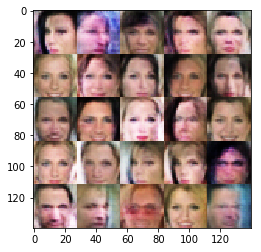


Batches:  82%|███████████████████████████████████████████████████████████▏            | 2600/3165 [08:37<01:52,  5.03batch/s]

Epoch 0/2... Batch 2610/3165... Discriminator loss: 0.4939 Generator loss: 2.4663
Epoch 0/2... Batch 2620/3165... Discriminator loss: 0.8002 Generator loss: 1.3199
Epoch 0/2... Batch 2630/3165... Discriminator loss: 0.4303 Generator loss: 2.8872
Epoch 0/2... Batch 2640/3165... Discriminator loss: 1.5249 Generator loss: 4.1709
Epoch 0/2... Batch 2650/3165... Discriminator loss: 0.5457 Generator loss: 2.3508
Epoch 0/2... Batch 2660/3165... Discriminator loss: 0.5569 Generator loss: 1.8009
Epoch 0/2... Batch 2670/3165... Discriminator loss: 0.6474 Generator loss: 1.6291
Epoch 0/2... Batch 2680/3165... Discriminator loss: 0.4929 Generator loss: 2.4547
Epoch 0/2... Batch 2690/3165... Discriminator loss: 0.9465 Generator loss: 1.2612
Epoch 0/2... Batch 2700/3165... Discriminator loss: 0.4187 Generator loss: 3.1468


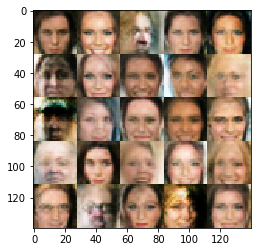


Batches:  85%|█████████████████████████████████████████████████████████████▍          | 2700/3165 [08:57<01:32,  5.01batch/s]

Epoch 0/2... Batch 2710/3165... Discriminator loss: 0.5693 Generator loss: 2.1557
Epoch 0/2... Batch 2720/3165... Discriminator loss: 0.7868 Generator loss: 1.0563
Epoch 0/2... Batch 2730/3165... Discriminator loss: 0.7913 Generator loss: 1.3213
Epoch 0/2... Batch 2740/3165... Discriminator loss: 0.4747 Generator loss: 2.3218
Epoch 0/2... Batch 2750/3165... Discriminator loss: 1.1305 Generator loss: 0.8569
Epoch 0/2... Batch 2760/3165... Discriminator loss: 0.4620 Generator loss: 2.3692
Epoch 0/2... Batch 2770/3165... Discriminator loss: 0.5181 Generator loss: 1.8285
Epoch 0/2... Batch 2780/3165... Discriminator loss: 0.4829 Generator loss: 2.1994
Epoch 0/2... Batch 2790/3165... Discriminator loss: 0.4834 Generator loss: 1.6762
Epoch 0/2... Batch 2800/3165... Discriminator loss: 0.4719 Generator loss: 3.2221


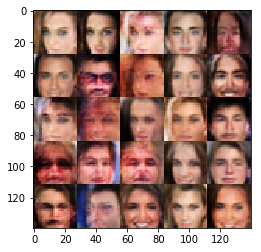


Batches:  88%|███████████████████████████████████████████████████████████████▋        | 2800/3165 [09:17<01:12,  5.06batch/s]

Epoch 0/2... Batch 2810/3165... Discriminator loss: 0.5145 Generator loss: 2.3052
Epoch 0/2... Batch 2820/3165... Discriminator loss: 0.3921 Generator loss: 2.7154
Epoch 0/2... Batch 2830/3165... Discriminator loss: 0.6241 Generator loss: 1.5157
Epoch 0/2... Batch 2840/3165... Discriminator loss: 0.4357 Generator loss: 2.4970
Epoch 0/2... Batch 2850/3165... Discriminator loss: 0.6762 Generator loss: 1.3811
Epoch 0/2... Batch 2860/3165... Discriminator loss: 0.4617 Generator loss: 2.6556
Epoch 0/2... Batch 2870/3165... Discriminator loss: 0.4656 Generator loss: 2.7481
Epoch 0/2... Batch 2880/3165... Discriminator loss: 0.4677 Generator loss: 3.9088
Epoch 0/2... Batch 2890/3165... Discriminator loss: 0.5111 Generator loss: 1.9179
Epoch 0/2... Batch 2900/3165... Discriminator loss: 0.4946 Generator loss: 2.2250


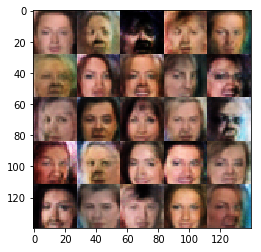


Batches:  92%|█████████████████████████████████████████████████████████████████▉      | 2900/3165 [09:36<00:52,  5.07batch/s]

Epoch 0/2... Batch 2910/3165... Discriminator loss: 0.5015 Generator loss: 1.9463
Epoch 0/2... Batch 2920/3165... Discriminator loss: 0.6384 Generator loss: 3.0928
Epoch 0/2... Batch 2930/3165... Discriminator loss: 1.3177 Generator loss: 0.7240
Epoch 0/2... Batch 2940/3165... Discriminator loss: 0.6268 Generator loss: 1.6945
Epoch 0/2... Batch 2950/3165... Discriminator loss: 0.5105 Generator loss: 1.9397
Epoch 0/2... Batch 2960/3165... Discriminator loss: 0.6370 Generator loss: 1.6537
Epoch 0/2... Batch 2970/3165... Discriminator loss: 0.6727 Generator loss: 1.2022
Epoch 0/2... Batch 2980/3165... Discriminator loss: 0.5790 Generator loss: 1.5727
Epoch 0/2... Batch 2990/3165... Discriminator loss: 0.8563 Generator loss: 1.1280
Epoch 0/2... Batch 3000/3165... Discriminator loss: 0.5311 Generator loss: 1.8585


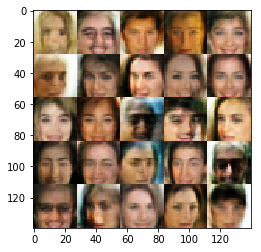


Batches:  95%|████████████████████████████████████████████████████████████████████▏   | 3000/3165 [09:56<00:32,  5.08batch/s]

Epoch 0/2... Batch 3010/3165... Discriminator loss: 0.5608 Generator loss: 2.7023
Epoch 0/2... Batch 3020/3165... Discriminator loss: 0.6097 Generator loss: 1.6532
Epoch 0/2... Batch 3030/3165... Discriminator loss: 0.5451 Generator loss: 2.9465
Epoch 0/2... Batch 3040/3165... Discriminator loss: 0.5413 Generator loss: 2.0721
Epoch 0/2... Batch 3050/3165... Discriminator loss: 0.4948 Generator loss: 2.6856
Epoch 0/2... Batch 3060/3165... Discriminator loss: 0.4624 Generator loss: 2.4946
Epoch 0/2... Batch 3070/3165... Discriminator loss: 0.4519 Generator loss: 2.5340
Epoch 0/2... Batch 3080/3165... Discriminator loss: 0.5751 Generator loss: 2.2305
Epoch 0/2... Batch 3090/3165... Discriminator loss: 0.5533 Generator loss: 2.9518
Epoch 0/2... Batch 3100/3165... Discriminator loss: 0.9407 Generator loss: 1.2001


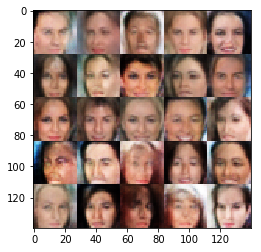


Batches:  98%|██████████████████████████████████████████████████████████████████████▌ | 3100/3165 [10:16<00:12,  5.02batch/s]

Epoch 0/2... Batch 3110/3165... Discriminator loss: 1.0487 Generator loss: 0.7450
Epoch 0/2... Batch 3120/3165... Discriminator loss: 0.4117 Generator loss: 3.2900
Epoch 0/2... Batch 3130/3165... Discriminator loss: 0.3996 Generator loss: 2.7297
Epoch 0/2... Batch 3140/3165... Discriminator loss: 0.4357 Generator loss: 2.6042
Epoch 0/2... Batch 3150/3165... Discriminator loss: 0.6804 Generator loss: 1.3900
Epoch 0/2... Batch 3160/3165... Discriminator loss: 1.3182 Generator loss: 0.5359



Batches:   0%|                                                                                   | 0/3165 [00:00<?, ?batch/s]

Epoch 1/2... Batch 5/3165... Discriminator loss: 0.4681 Generator loss: 2.0984
Epoch 1/2... Batch 15/3165... Discriminator loss: 0.6749 Generator loss: 3.1989
Epoch 1/2... Batch 25/3165... Discriminator loss: 0.3733 Generator loss: 3.6014
Epoch 1/2... Batch 35/3165... Discriminator loss: 0.4575 Generator loss: 3.0492


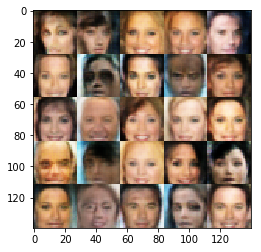

Epoch 1/2... Batch 45/3165... Discriminator loss: 0.4696 Generator loss: 2.3447
Epoch 1/2... Batch 55/3165... Discriminator loss: 0.5897 Generator loss: 1.7744
Epoch 1/2... Batch 65/3165... Discriminator loss: 0.7086 Generator loss: 1.5260
Epoch 1/2... Batch 75/3165... Discriminator loss: 0.5581 Generator loss: 2.2166
Epoch 1/2... Batch 85/3165... Discriminator loss: 0.9646 Generator loss: 0.9937
Epoch 1/2... Batch 95/3165... Discriminator loss: 0.5361 Generator loss: 2.4018



Batches:   3%|██▎                                                                      | 100/3165 [00:18<09:20,  5.47batch/s]

Epoch 1/2... Batch 105/3165... Discriminator loss: 0.6584 Generator loss: 1.3907
Epoch 1/2... Batch 115/3165... Discriminator loss: 0.4774 Generator loss: 2.1827
Epoch 1/2... Batch 125/3165... Discriminator loss: 0.4625 Generator loss: 2.1303
Epoch 1/2... Batch 135/3165... Discriminator loss: 0.5972 Generator loss: 1.6045


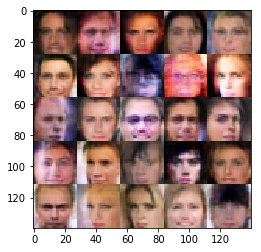

Epoch 1/2... Batch 145/3165... Discriminator loss: 0.7534 Generator loss: 4.7881
Epoch 1/2... Batch 155/3165... Discriminator loss: 0.7930 Generator loss: 1.1874
Epoch 1/2... Batch 165/3165... Discriminator loss: 0.4354 Generator loss: 3.1973
Epoch 1/2... Batch 175/3165... Discriminator loss: 0.4898 Generator loss: 1.9275
Epoch 1/2... Batch 185/3165... Discriminator loss: 0.4613 Generator loss: 2.5090
Epoch 1/2... Batch 195/3165... Discriminator loss: 0.4388 Generator loss: 2.7649



Batches:   6%|████▌                                                                    | 200/3165 [00:36<08:58,  5.51batch/s]

Epoch 1/2... Batch 205/3165... Discriminator loss: 1.5666 Generator loss: 6.5857
Epoch 1/2... Batch 215/3165... Discriminator loss: 0.5016 Generator loss: 2.0189
Epoch 1/2... Batch 225/3165... Discriminator loss: 0.4571 Generator loss: 2.4555
Epoch 1/2... Batch 235/3165... Discriminator loss: 0.5571 Generator loss: 1.6847


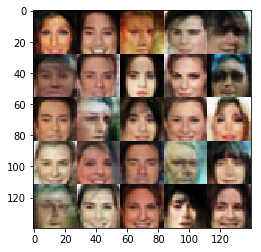

Epoch 1/2... Batch 245/3165... Discriminator loss: 0.4864 Generator loss: 2.0436
Epoch 1/2... Batch 255/3165... Discriminator loss: 0.4666 Generator loss: 2.5585
Epoch 1/2... Batch 265/3165... Discriminator loss: 0.5334 Generator loss: 3.2909
Epoch 1/2... Batch 275/3165... Discriminator loss: 0.5294 Generator loss: 1.8973
Epoch 1/2... Batch 285/3165... Discriminator loss: 0.5206 Generator loss: 2.0102
Epoch 1/2... Batch 295/3165... Discriminator loss: 1.0067 Generator loss: 1.1290



Batches:   9%|██████▉                                                                  | 300/3165 [00:53<08:37,  5.54batch/s]

Epoch 1/2... Batch 305/3165... Discriminator loss: 0.4066 Generator loss: 2.9923
Epoch 1/2... Batch 315/3165... Discriminator loss: 0.4649 Generator loss: 2.6912
Epoch 1/2... Batch 325/3165... Discriminator loss: 0.5932 Generator loss: 3.6892
Epoch 1/2... Batch 335/3165... Discriminator loss: 0.4820 Generator loss: 4.8668


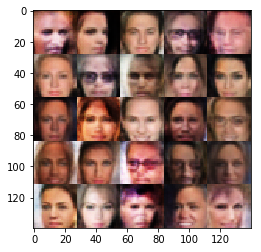

Epoch 1/2... Batch 345/3165... Discriminator loss: 0.4526 Generator loss: 2.8462
Epoch 1/2... Batch 355/3165... Discriminator loss: 0.5087 Generator loss: 1.9913
Epoch 1/2... Batch 365/3165... Discriminator loss: 0.8246 Generator loss: 1.0891
Epoch 1/2... Batch 375/3165... Discriminator loss: 0.5581 Generator loss: 1.5841
Epoch 1/2... Batch 385/3165... Discriminator loss: 0.4705 Generator loss: 2.4733
Epoch 1/2... Batch 395/3165... Discriminator loss: 0.4456 Generator loss: 2.6054



Batches:  13%|█████████▏                                                               | 400/3165 [01:11<08:11,  5.63batch/s]

Epoch 1/2... Batch 405/3165... Discriminator loss: 0.4606 Generator loss: 2.6784
Epoch 1/2... Batch 415/3165... Discriminator loss: 0.4117 Generator loss: 2.8590
Epoch 1/2... Batch 425/3165... Discriminator loss: 0.5202 Generator loss: 2.0046
Epoch 1/2... Batch 435/3165... Discriminator loss: 0.4083 Generator loss: 2.6049


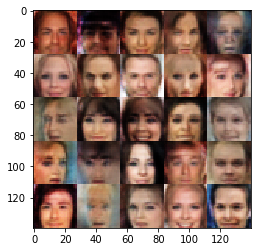

Epoch 1/2... Batch 445/3165... Discriminator loss: 0.6369 Generator loss: 1.6404
Epoch 1/2... Batch 455/3165... Discriminator loss: 0.3811 Generator loss: 3.2557
Epoch 1/2... Batch 465/3165... Discriminator loss: 0.5689 Generator loss: 1.7035
Epoch 1/2... Batch 475/3165... Discriminator loss: 0.7529 Generator loss: 1.0759
Epoch 1/2... Batch 485/3165... Discriminator loss: 0.4308 Generator loss: 3.2970
Epoch 1/2... Batch 495/3165... Discriminator loss: 0.4526 Generator loss: 2.5977



Batches:  16%|███████████▌                                                             | 500/3165 [01:28<07:51,  5.65batch/s]

Epoch 1/2... Batch 505/3165... Discriminator loss: 0.4593 Generator loss: 2.5821
Epoch 1/2... Batch 515/3165... Discriminator loss: 0.5732 Generator loss: 3.4012
Epoch 1/2... Batch 525/3165... Discriminator loss: 0.4529 Generator loss: 3.2554
Epoch 1/2... Batch 535/3165... Discriminator loss: 0.4724 Generator loss: 2.2822


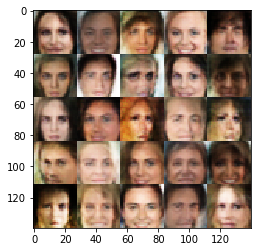

Epoch 1/2... Batch 545/3165... Discriminator loss: 0.4098 Generator loss: 2.8021
Epoch 1/2... Batch 555/3165... Discriminator loss: 0.4156 Generator loss: 2.9326
Epoch 1/2... Batch 565/3165... Discriminator loss: 0.7399 Generator loss: 1.8213
Epoch 1/2... Batch 575/3165... Discriminator loss: 0.6872 Generator loss: 1.3499
Epoch 1/2... Batch 585/3165... Discriminator loss: 0.4663 Generator loss: 2.8162
Epoch 1/2... Batch 595/3165... Discriminator loss: 0.5977 Generator loss: 1.6244



Batches:  19%|█████████████▊                                                           | 600/3165 [01:46<07:34,  5.64batch/s]

Epoch 1/2... Batch 605/3165... Discriminator loss: 0.4192 Generator loss: 2.5565
Epoch 1/2... Batch 615/3165... Discriminator loss: 0.4577 Generator loss: 2.2398
Epoch 1/2... Batch 625/3165... Discriminator loss: 0.6330 Generator loss: 1.6475
Epoch 1/2... Batch 635/3165... Discriminator loss: 0.4997 Generator loss: 2.4219


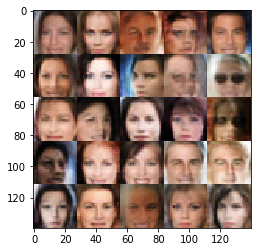

Epoch 1/2... Batch 645/3165... Discriminator loss: 0.4489 Generator loss: 3.8995
Epoch 1/2... Batch 655/3165... Discriminator loss: 0.6893 Generator loss: 1.3879
Epoch 1/2... Batch 665/3165... Discriminator loss: 0.4589 Generator loss: 2.9041
Epoch 1/2... Batch 675/3165... Discriminator loss: 0.4062 Generator loss: 3.2038
Epoch 1/2... Batch 685/3165... Discriminator loss: 0.9966 Generator loss: 6.7706
Epoch 1/2... Batch 695/3165... Discriminator loss: 0.5750 Generator loss: 1.8825



Batches:  22%|████████████████▏                                                        | 700/3165 [02:05<07:24,  5.55batch/s]

Epoch 1/2... Batch 705/3165... Discriminator loss: 1.3475 Generator loss: 0.4299
Epoch 1/2... Batch 715/3165... Discriminator loss: 1.0216 Generator loss: 1.0266
Epoch 1/2... Batch 725/3165... Discriminator loss: 1.2098 Generator loss: 0.9721
Epoch 1/2... Batch 735/3165... Discriminator loss: 0.4561 Generator loss: 2.1215


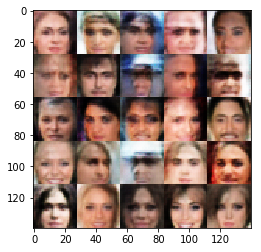

Epoch 1/2... Batch 745/3165... Discriminator loss: 0.4632 Generator loss: 2.1565
Epoch 1/2... Batch 755/3165... Discriminator loss: 0.5476 Generator loss: 1.9779
Epoch 1/2... Batch 765/3165... Discriminator loss: 0.4252 Generator loss: 2.8266
Epoch 1/2... Batch 775/3165... Discriminator loss: 0.4693 Generator loss: 3.8556
Epoch 1/2... Batch 785/3165... Discriminator loss: 1.5656 Generator loss: 0.5531
Epoch 1/2... Batch 795/3165... Discriminator loss: 0.9186 Generator loss: 4.1957



Batches:  25%|██████████████████▍                                                      | 800/3165 [02:22<07:00,  5.63batch/s]

Epoch 1/2... Batch 805/3165... Discriminator loss: 0.6619 Generator loss: 1.5135
Epoch 1/2... Batch 815/3165... Discriminator loss: 0.5048 Generator loss: 2.9591
Epoch 1/2... Batch 825/3165... Discriminator loss: 0.5523 Generator loss: 1.9581
Epoch 1/2... Batch 835/3165... Discriminator loss: 0.5166 Generator loss: 2.0334


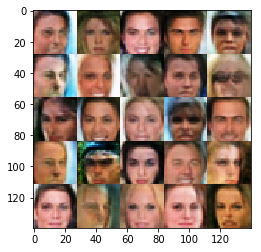

Epoch 1/2... Batch 845/3165... Discriminator loss: 0.5892 Generator loss: 4.2211
Epoch 1/2... Batch 855/3165... Discriminator loss: 0.5444 Generator loss: 2.1272
Epoch 1/2... Batch 865/3165... Discriminator loss: 0.5171 Generator loss: 1.4213
Epoch 1/2... Batch 875/3165... Discriminator loss: 0.3781 Generator loss: 3.8979
Epoch 1/2... Batch 885/3165... Discriminator loss: 0.6582 Generator loss: 1.5838
Epoch 1/2... Batch 895/3165... Discriminator loss: 0.4638 Generator loss: 2.7232



Batches:  28%|████████████████████▊                                                    | 900/3165 [02:40<06:43,  5.62batch/s]

Epoch 1/2... Batch 905/3165... Discriminator loss: 0.7253 Generator loss: 5.6376
Epoch 1/2... Batch 915/3165... Discriminator loss: 0.4630 Generator loss: 2.5972
Epoch 1/2... Batch 925/3165... Discriminator loss: 0.8301 Generator loss: 1.7824
Epoch 1/2... Batch 935/3165... Discriminator loss: 0.5436 Generator loss: 1.5344


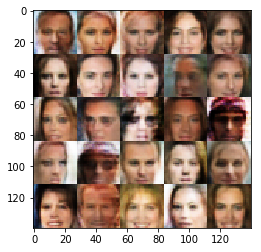

Epoch 1/2... Batch 945/3165... Discriminator loss: 0.5733 Generator loss: 2.1456
Epoch 1/2... Batch 955/3165... Discriminator loss: 0.7241 Generator loss: 1.5701
Epoch 1/2... Batch 965/3165... Discriminator loss: 0.7549 Generator loss: 1.4545
Epoch 1/2... Batch 975/3165... Discriminator loss: 0.4263 Generator loss: 2.6847
Epoch 1/2... Batch 985/3165... Discriminator loss: 1.5009 Generator loss: 0.4544
Epoch 1/2... Batch 995/3165... Discriminator loss: 0.5216 Generator loss: 2.2014



Batches:  32%|██████████████████████▋                                                 | 1000/3165 [02:57<06:24,  5.64batch/s]

Epoch 1/2... Batch 1005/3165... Discriminator loss: 0.7615 Generator loss: 1.0778
Epoch 1/2... Batch 1015/3165... Discriminator loss: 0.6813 Generator loss: 1.4990
Epoch 1/2... Batch 1025/3165... Discriminator loss: 0.5222 Generator loss: 2.0530
Epoch 1/2... Batch 1035/3165... Discriminator loss: 0.7053 Generator loss: 1.6281


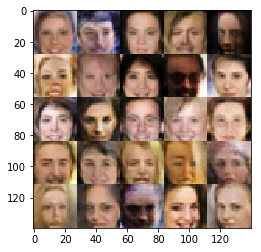

Epoch 1/2... Batch 1045/3165... Discriminator loss: 0.4487 Generator loss: 2.8909
Epoch 1/2... Batch 1055/3165... Discriminator loss: 0.3924 Generator loss: 3.6636
Epoch 1/2... Batch 1065/3165... Discriminator loss: 0.4388 Generator loss: 2.7584
Epoch 1/2... Batch 1075/3165... Discriminator loss: 1.4148 Generator loss: 0.5030
Epoch 1/2... Batch 1085/3165... Discriminator loss: 0.4930 Generator loss: 1.8391
Epoch 1/2... Batch 1095/3165... Discriminator loss: 1.4681 Generator loss: 0.4795



Batches:  35%|█████████████████████████                                               | 1100/3165 [03:15<06:08,  5.60batch/s]

Epoch 1/2... Batch 1105/3165... Discriminator loss: 0.5682 Generator loss: 2.1319
Epoch 1/2... Batch 1115/3165... Discriminator loss: 1.1335 Generator loss: 5.1658
Epoch 1/2... Batch 1125/3165... Discriminator loss: 0.6151 Generator loss: 2.1796
Epoch 1/2... Batch 1135/3165... Discriminator loss: 0.4502 Generator loss: 2.7023


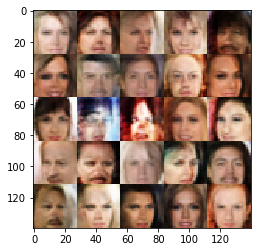

Epoch 1/2... Batch 1145/3165... Discriminator loss: 0.4354 Generator loss: 2.7965
Epoch 1/2... Batch 1155/3165... Discriminator loss: 0.6943 Generator loss: 1.5751
Epoch 1/2... Batch 1165/3165... Discriminator loss: 0.6385 Generator loss: 1.3164
Epoch 1/2... Batch 1175/3165... Discriminator loss: 0.5190 Generator loss: 2.8480
Epoch 1/2... Batch 1185/3165... Discriminator loss: 0.4237 Generator loss: 3.0372
Epoch 1/2... Batch 1195/3165... Discriminator loss: 0.6549 Generator loss: 2.1818



Batches:  38%|███████████████████████████▎                                            | 1200/3165 [03:33<05:48,  5.63batch/s]

Epoch 1/2... Batch 1205/3165... Discriminator loss: 0.4193 Generator loss: 3.2338
Epoch 1/2... Batch 1215/3165... Discriminator loss: 0.6508 Generator loss: 4.8797
Epoch 1/2... Batch 1225/3165... Discriminator loss: 0.4645 Generator loss: 3.1407
Epoch 1/2... Batch 1235/3165... Discriminator loss: 0.4361 Generator loss: 2.2262


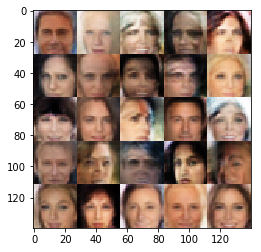

Epoch 1/2... Batch 1245/3165... Discriminator loss: 0.4908 Generator loss: 2.1219
Epoch 1/2... Batch 1255/3165... Discriminator loss: 0.4149 Generator loss: 3.0814
Epoch 1/2... Batch 1265/3165... Discriminator loss: 0.4521 Generator loss: 2.1955
Epoch 1/2... Batch 1275/3165... Discriminator loss: 0.7070 Generator loss: 1.6125
Epoch 1/2... Batch 1285/3165... Discriminator loss: 0.4113 Generator loss: 2.5236
Epoch 1/2... Batch 1295/3165... Discriminator loss: 0.4789 Generator loss: 1.9611



Batches:  41%|█████████████████████████████▌                                          | 1300/3165 [03:51<05:32,  5.61batch/s]

Epoch 1/2... Batch 1305/3165... Discriminator loss: 0.5163 Generator loss: 2.9825
Epoch 1/2... Batch 1315/3165... Discriminator loss: 0.4487 Generator loss: 2.5895
Epoch 1/2... Batch 1325/3165... Discriminator loss: 0.4483 Generator loss: 2.1721
Epoch 1/2... Batch 1335/3165... Discriminator loss: 0.5143 Generator loss: 2.8175


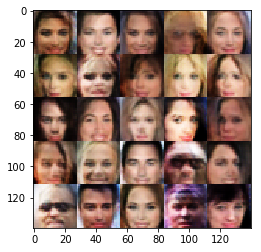

Epoch 1/2... Batch 1345/3165... Discriminator loss: 0.5868 Generator loss: 1.6859
Epoch 1/2... Batch 1355/3165... Discriminator loss: 0.4653 Generator loss: 2.0444
Epoch 1/2... Batch 1365/3165... Discriminator loss: 0.5342 Generator loss: 4.6140
Epoch 1/2... Batch 1375/3165... Discriminator loss: 0.4396 Generator loss: 2.1939
Epoch 1/2... Batch 1385/3165... Discriminator loss: 0.7563 Generator loss: 2.7619
Epoch 1/2... Batch 1395/3165... Discriminator loss: 0.4801 Generator loss: 1.7903



Batches:  44%|███████████████████████████████▊                                        | 1400/3165 [04:09<05:15,  5.59batch/s]

Epoch 1/2... Batch 1405/3165... Discriminator loss: 0.6749 Generator loss: 1.5098
Epoch 1/2... Batch 1415/3165... Discriminator loss: 0.4645 Generator loss: 3.4431
Epoch 1/2... Batch 1425/3165... Discriminator loss: 0.3724 Generator loss: 3.0092
Epoch 1/2... Batch 1435/3165... Discriminator loss: 0.4793 Generator loss: 2.1849


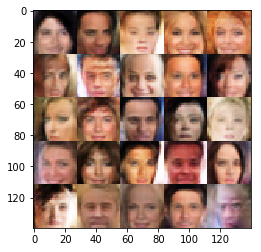

Epoch 1/2... Batch 1445/3165... Discriminator loss: 1.3686 Generator loss: 0.4697
Epoch 1/2... Batch 1455/3165... Discriminator loss: 0.6138 Generator loss: 4.1702
Epoch 1/2... Batch 1465/3165... Discriminator loss: 1.2311 Generator loss: 5.5586
Epoch 1/2... Batch 1475/3165... Discriminator loss: 0.4158 Generator loss: 3.3235
Epoch 1/2... Batch 1485/3165... Discriminator loss: 0.4839 Generator loss: 2.9715
Epoch 1/2... Batch 1495/3165... Discriminator loss: 0.4022 Generator loss: 3.5801



Batches:  47%|██████████████████████████████████                                      | 1500/3165 [04:26<04:56,  5.62batch/s]

Epoch 1/2... Batch 1505/3165... Discriminator loss: 0.4638 Generator loss: 3.4167
Epoch 1/2... Batch 1515/3165... Discriminator loss: 0.4087 Generator loss: 3.5669
Epoch 1/2... Batch 1525/3165... Discriminator loss: 1.0721 Generator loss: 6.9194
Epoch 1/2... Batch 1535/3165... Discriminator loss: 0.4867 Generator loss: 2.4135


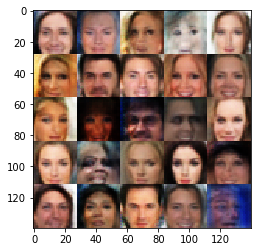

Epoch 1/2... Batch 1545/3165... Discriminator loss: 0.4419 Generator loss: 2.9019
Epoch 1/2... Batch 1555/3165... Discriminator loss: 0.3737 Generator loss: 3.2277
Epoch 1/2... Batch 1565/3165... Discriminator loss: 0.3936 Generator loss: 4.3108
Epoch 1/2... Batch 1575/3165... Discriminator loss: 0.3692 Generator loss: 3.9623
Epoch 1/2... Batch 1585/3165... Discriminator loss: 0.4074 Generator loss: 3.0113
Epoch 1/2... Batch 1595/3165... Discriminator loss: 0.4304 Generator loss: 2.8274



Batches:  51%|████████████████████████████████████▍                                   | 1600/3165 [04:44<04:37,  5.64batch/s]

Epoch 1/2... Batch 1605/3165... Discriminator loss: 0.4478 Generator loss: 2.8333
Epoch 1/2... Batch 1615/3165... Discriminator loss: 0.4959 Generator loss: 3.6066
Epoch 1/2... Batch 1625/3165... Discriminator loss: 0.5346 Generator loss: 2.2189
Epoch 1/2... Batch 1635/3165... Discriminator loss: 0.4586 Generator loss: 2.3163


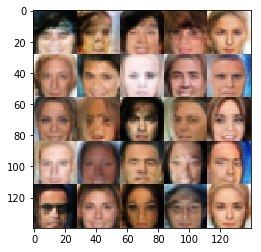

Epoch 1/2... Batch 1645/3165... Discriminator loss: 0.4907 Generator loss: 2.3175
Epoch 1/2... Batch 1655/3165... Discriminator loss: 0.6324 Generator loss: 1.5517
Epoch 1/2... Batch 1665/3165... Discriminator loss: 0.5924 Generator loss: 1.7399
Epoch 1/2... Batch 1675/3165... Discriminator loss: 0.9122 Generator loss: 1.5663
Epoch 1/2... Batch 1685/3165... Discriminator loss: 0.4366 Generator loss: 3.1697
Epoch 1/2... Batch 1695/3165... Discriminator loss: 0.6819 Generator loss: 1.8394



Batches:  54%|██████████████████████████████████████▋                                 | 1700/3165 [05:02<04:18,  5.66batch/s]

Epoch 1/2... Batch 1705/3165... Discriminator loss: 0.4033 Generator loss: 3.2079
Epoch 1/2... Batch 1715/3165... Discriminator loss: 0.6012 Generator loss: 1.9910
Epoch 1/2... Batch 1725/3165... Discriminator loss: 0.4063 Generator loss: 2.3533
Epoch 1/2... Batch 1735/3165... Discriminator loss: 0.4179 Generator loss: 2.4668


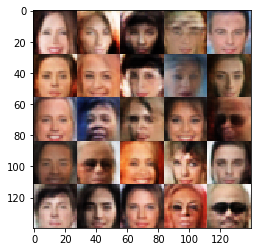

Epoch 1/2... Batch 1745/3165... Discriminator loss: 0.5342 Generator loss: 1.6153
Epoch 1/2... Batch 1755/3165... Discriminator loss: 0.5175 Generator loss: 1.7809
Epoch 1/2... Batch 1765/3165... Discriminator loss: 0.3924 Generator loss: 3.7587
Epoch 1/2... Batch 1775/3165... Discriminator loss: 0.6349 Generator loss: 2.0265
Epoch 1/2... Batch 1785/3165... Discriminator loss: 0.6419 Generator loss: 2.0612
Epoch 1/2... Batch 1795/3165... Discriminator loss: 0.3984 Generator loss: 3.4539



Batches:  57%|████████████████████████████████████████▉                               | 1800/3165 [05:19<04:00,  5.67batch/s]

Epoch 1/2... Batch 1805/3165... Discriminator loss: 0.3699 Generator loss: 4.2756
Epoch 1/2... Batch 1815/3165... Discriminator loss: 0.3772 Generator loss: 4.2094
Epoch 1/2... Batch 1825/3165... Discriminator loss: 0.3820 Generator loss: 4.0377
Epoch 1/2... Batch 1835/3165... Discriminator loss: 0.4218 Generator loss: 2.5789


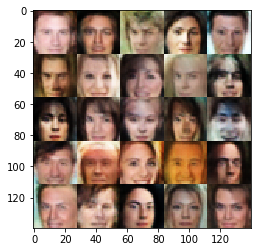

Epoch 1/2... Batch 1845/3165... Discriminator loss: 0.4340 Generator loss: 3.8615
Epoch 1/2... Batch 1855/3165... Discriminator loss: 0.4091 Generator loss: 3.7539
Epoch 1/2... Batch 1865/3165... Discriminator loss: 0.6246 Generator loss: 1.0412
Epoch 1/2... Batch 1875/3165... Discriminator loss: 0.4535 Generator loss: 1.9313
Epoch 1/2... Batch 1885/3165... Discriminator loss: 0.4030 Generator loss: 4.2883
Epoch 1/2... Batch 1895/3165... Discriminator loss: 0.6541 Generator loss: 4.4978



Batches:  60%|███████████████████████████████████████████▏                            | 1900/3165 [05:37<03:42,  5.68batch/s]

Epoch 1/2... Batch 1905/3165... Discriminator loss: 0.6710 Generator loss: 1.6544
Epoch 1/2... Batch 1915/3165... Discriminator loss: 0.5563 Generator loss: 2.7735
Epoch 1/2... Batch 1925/3165... Discriminator loss: 0.4937 Generator loss: 2.2358
Epoch 1/2... Batch 1935/3165... Discriminator loss: 0.4702 Generator loss: 2.2441


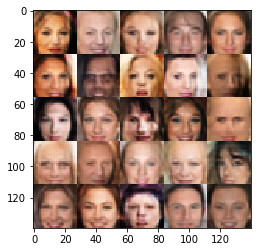

Epoch 1/2... Batch 1945/3165... Discriminator loss: 0.4239 Generator loss: 2.8646
Epoch 1/2... Batch 1955/3165... Discriminator loss: 0.3967 Generator loss: 3.1189
Epoch 1/2... Batch 1965/3165... Discriminator loss: 0.5420 Generator loss: 2.0491
Epoch 1/2... Batch 1975/3165... Discriminator loss: 0.4870 Generator loss: 2.1914
Epoch 1/2... Batch 1985/3165... Discriminator loss: 0.4344 Generator loss: 3.5296
Epoch 1/2... Batch 1995/3165... Discriminator loss: 0.5935 Generator loss: 1.9872



Batches:  63%|█████████████████████████████████████████████▍                          | 2000/3165 [05:55<03:26,  5.64batch/s]

Epoch 1/2... Batch 2005/3165... Discriminator loss: 0.6351 Generator loss: 1.6930
Epoch 1/2... Batch 2015/3165... Discriminator loss: 0.5228 Generator loss: 2.2523
Epoch 1/2... Batch 2025/3165... Discriminator loss: 0.4871 Generator loss: 2.5661
Epoch 1/2... Batch 2035/3165... Discriminator loss: 0.4830 Generator loss: 1.9260


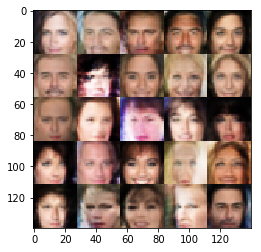

Epoch 1/2... Batch 2045/3165... Discriminator loss: 0.5269 Generator loss: 2.5188
Epoch 1/2... Batch 2055/3165... Discriminator loss: 0.4416 Generator loss: 2.7109
Epoch 1/2... Batch 2065/3165... Discriminator loss: 0.4472 Generator loss: 2.9086
Epoch 1/2... Batch 2075/3165... Discriminator loss: 0.4416 Generator loss: 3.9211
Epoch 1/2... Batch 2085/3165... Discriminator loss: 0.4762 Generator loss: 3.5784
Epoch 1/2... Batch 2095/3165... Discriminator loss: 1.7257 Generator loss: 0.5172



Batches:  66%|███████████████████████████████████████████████▊                        | 2100/3165 [06:13<03:09,  5.63batch/s]

Epoch 1/2... Batch 2105/3165... Discriminator loss: 0.4800 Generator loss: 3.0443
Epoch 1/2... Batch 2115/3165... Discriminator loss: 0.4841 Generator loss: 2.0759
Epoch 1/2... Batch 2125/3165... Discriminator loss: 0.4312 Generator loss: 4.1371
Epoch 1/2... Batch 2135/3165... Discriminator loss: 0.4567 Generator loss: 2.4393


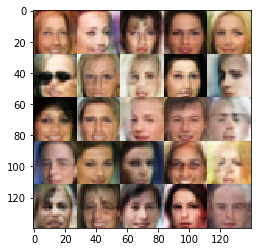

Epoch 1/2... Batch 2145/3165... Discriminator loss: 0.4329 Generator loss: 2.4284
Epoch 1/2... Batch 2155/3165... Discriminator loss: 0.4286 Generator loss: 3.3131
Epoch 1/2... Batch 2165/3165... Discriminator loss: 0.4820 Generator loss: 2.4622
Epoch 1/2... Batch 2175/3165... Discriminator loss: 0.6187 Generator loss: 1.9477
Epoch 1/2... Batch 2185/3165... Discriminator loss: 0.5938 Generator loss: 4.6996
Epoch 1/2... Batch 2195/3165... Discriminator loss: 0.4299 Generator loss: 3.0836



Batches:  70%|██████████████████████████████████████████████████                      | 2200/3165 [06:30<02:50,  5.65batch/s]

Epoch 1/2... Batch 2205/3165... Discriminator loss: 0.4463 Generator loss: 3.9124
Epoch 1/2... Batch 2215/3165... Discriminator loss: 0.5150 Generator loss: 2.6779
Epoch 1/2... Batch 2225/3165... Discriminator loss: 0.3951 Generator loss: 4.0752
Epoch 1/2... Batch 2235/3165... Discriminator loss: 0.3623 Generator loss: 4.7171


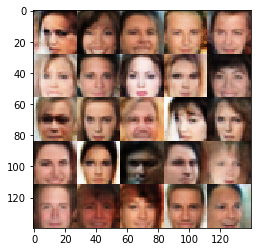

Epoch 1/2... Batch 2245/3165... Discriminator loss: 0.6818 Generator loss: 1.3292
Epoch 1/2... Batch 2255/3165... Discriminator loss: 0.3981 Generator loss: 4.2103
Epoch 1/2... Batch 2265/3165... Discriminator loss: 0.3681 Generator loss: 3.6479
Epoch 1/2... Batch 2275/3165... Discriminator loss: 0.4857 Generator loss: 2.8067
Epoch 1/2... Batch 2285/3165... Discriminator loss: 0.7159 Generator loss: 7.3883
Epoch 1/2... Batch 2295/3165... Discriminator loss: 0.6981 Generator loss: 1.4948



Batches:  73%|████████████████████████████████████████████████████▎                   | 2300/3165 [06:48<02:33,  5.64batch/s]

Epoch 1/2... Batch 2305/3165... Discriminator loss: 0.4176 Generator loss: 3.6675
Epoch 1/2... Batch 2315/3165... Discriminator loss: 0.4253 Generator loss: 3.6568
Epoch 1/2... Batch 2325/3165... Discriminator loss: 0.3533 Generator loss: 5.1396
Epoch 1/2... Batch 2335/3165... Discriminator loss: 0.6148 Generator loss: 5.2728


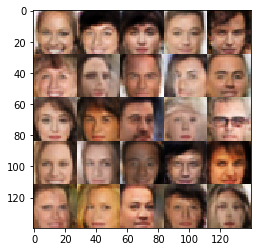

Epoch 1/2... Batch 2345/3165... Discriminator loss: 0.3732 Generator loss: 3.8537
Epoch 1/2... Batch 2355/3165... Discriminator loss: 0.3821 Generator loss: 3.4934
Epoch 1/2... Batch 2365/3165... Discriminator loss: 0.4809 Generator loss: 2.5594
Epoch 1/2... Batch 2375/3165... Discriminator loss: 0.4629 Generator loss: 2.0585
Epoch 1/2... Batch 2385/3165... Discriminator loss: 0.7112 Generator loss: 1.4811
Epoch 1/2... Batch 2395/3165... Discriminator loss: 0.3982 Generator loss: 3.6476



Batches:  76%|██████████████████████████████████████████████████████▌                 | 2400/3165 [07:05<02:15,  5.66batch/s]

Epoch 1/2... Batch 2405/3165... Discriminator loss: 0.3826 Generator loss: 3.2987
Epoch 1/2... Batch 2415/3165... Discriminator loss: 0.3929 Generator loss: 3.5883
Epoch 1/2... Batch 2425/3165... Discriminator loss: 0.4055 Generator loss: 2.9885
Epoch 1/2... Batch 2435/3165... Discriminator loss: 0.4128 Generator loss: 2.9587


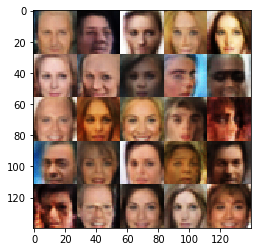

Epoch 1/2... Batch 2445/3165... Discriminator loss: 0.5406 Generator loss: 6.5446
Epoch 1/2... Batch 2455/3165... Discriminator loss: 1.0068 Generator loss: 5.2452
Epoch 1/2... Batch 2465/3165... Discriminator loss: 0.4273 Generator loss: 3.2979
Epoch 1/2... Batch 2475/3165... Discriminator loss: 0.4287 Generator loss: 2.3618
Epoch 1/2... Batch 2485/3165... Discriminator loss: 0.9285 Generator loss: 6.3724
Epoch 1/2... Batch 2495/3165... Discriminator loss: 0.6664 Generator loss: 1.8498



Batches:  79%|████████████████████████████████████████████████████████▊               | 2500/3165 [07:23<01:57,  5.66batch/s]

Epoch 1/2... Batch 2505/3165... Discriminator loss: 0.4625 Generator loss: 2.8808
Epoch 1/2... Batch 2515/3165... Discriminator loss: 0.6007 Generator loss: 2.9393
Epoch 1/2... Batch 2525/3165... Discriminator loss: 0.4858 Generator loss: 4.7602
Epoch 1/2... Batch 2535/3165... Discriminator loss: 0.3575 Generator loss: 3.6823


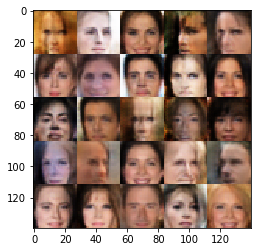

Epoch 1/2... Batch 2545/3165... Discriminator loss: 0.6231 Generator loss: 5.0284
Epoch 1/2... Batch 2555/3165... Discriminator loss: 0.4027 Generator loss: 2.8170
Epoch 1/2... Batch 2565/3165... Discriminator loss: 0.4131 Generator loss: 2.6381
Epoch 1/2... Batch 2575/3165... Discriminator loss: 0.5935 Generator loss: 2.2755
Epoch 1/2... Batch 2585/3165... Discriminator loss: 0.4020 Generator loss: 2.6294
Epoch 1/2... Batch 2595/3165... Discriminator loss: 0.8837 Generator loss: 6.0650



Batches:  82%|███████████████████████████████████████████████████████████▏            | 2600/3165 [07:41<01:39,  5.65batch/s]

Epoch 1/2... Batch 2605/3165... Discriminator loss: 0.4351 Generator loss: 2.4079
Epoch 1/2... Batch 2615/3165... Discriminator loss: 0.4557 Generator loss: 2.9949
Epoch 1/2... Batch 2625/3165... Discriminator loss: 0.4498 Generator loss: 2.6486
Epoch 1/2... Batch 2635/3165... Discriminator loss: 0.4463 Generator loss: 3.4394


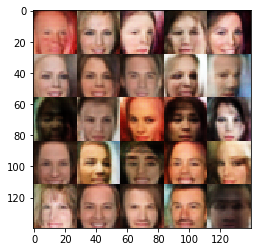

Epoch 1/2... Batch 2645/3165... Discriminator loss: 0.4595 Generator loss: 2.9111
Epoch 1/2... Batch 2655/3165... Discriminator loss: 0.4915 Generator loss: 3.2417
Epoch 1/2... Batch 2665/3165... Discriminator loss: 0.4150 Generator loss: 3.7608
Epoch 1/2... Batch 2675/3165... Discriminator loss: 0.4292 Generator loss: 2.1579
Epoch 1/2... Batch 2685/3165... Discriminator loss: 0.4729 Generator loss: 2.4147
Epoch 1/2... Batch 2695/3165... Discriminator loss: 0.6827 Generator loss: 1.6771



Batches:  85%|█████████████████████████████████████████████████████████████▍          | 2700/3165 [08:00<01:24,  5.52batch/s]

Epoch 1/2... Batch 2705/3165... Discriminator loss: 0.3690 Generator loss: 4.1353
Epoch 1/2... Batch 2715/3165... Discriminator loss: 0.3395 Generator loss: 4.7480
Epoch 1/2... Batch 2725/3165... Discriminator loss: 0.6032 Generator loss: 2.2899
Epoch 1/2... Batch 2735/3165... Discriminator loss: 0.4405 Generator loss: 2.3708


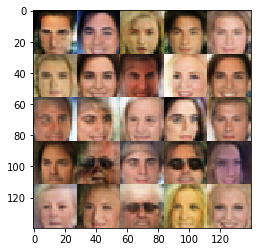

Epoch 1/2... Batch 2745/3165... Discriminator loss: 0.4442 Generator loss: 2.7241
Epoch 1/2... Batch 2755/3165... Discriminator loss: 0.3809 Generator loss: 3.4849
Epoch 1/2... Batch 2765/3165... Discriminator loss: 0.9601 Generator loss: 5.4829
Epoch 1/2... Batch 2775/3165... Discriminator loss: 0.4617 Generator loss: 3.7664
Epoch 1/2... Batch 2785/3165... Discriminator loss: 0.5195 Generator loss: 2.3194
Epoch 1/2... Batch 2795/3165... Discriminator loss: 0.5637 Generator loss: 1.6176



Batches:  88%|███████████████████████████████████████████████████████████████▋        | 2800/3165 [08:18<01:05,  5.54batch/s]

Epoch 1/2... Batch 2805/3165... Discriminator loss: 0.4048 Generator loss: 3.2701
Epoch 1/2... Batch 2815/3165... Discriminator loss: 0.7194 Generator loss: 1.5790
Epoch 1/2... Batch 2825/3165... Discriminator loss: 0.4812 Generator loss: 2.7703
Epoch 1/2... Batch 2835/3165... Discriminator loss: 0.5475 Generator loss: 1.9717


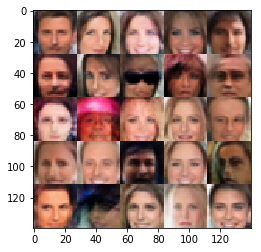

Epoch 1/2... Batch 2845/3165... Discriminator loss: 0.3990 Generator loss: 2.5667
Epoch 1/2... Batch 2855/3165... Discriminator loss: 0.4207 Generator loss: 2.6819
Epoch 1/2... Batch 2865/3165... Discriminator loss: 0.4284 Generator loss: 2.9049
Epoch 1/2... Batch 2875/3165... Discriminator loss: 0.4057 Generator loss: 3.6379
Epoch 1/2... Batch 2885/3165... Discriminator loss: 0.3854 Generator loss: 3.6111
Epoch 1/2... Batch 2895/3165... Discriminator loss: 0.4466 Generator loss: 4.5899



Batches:  92%|█████████████████████████████████████████████████████████████████▉      | 2900/3165 [08:36<00:47,  5.56batch/s]

Epoch 1/2... Batch 2905/3165... Discriminator loss: 0.4168 Generator loss: 2.8238
Epoch 1/2... Batch 2915/3165... Discriminator loss: 0.3935 Generator loss: 3.9212
Epoch 1/2... Batch 2925/3165... Discriminator loss: 0.5742 Generator loss: 1.7620
Epoch 1/2... Batch 2935/3165... Discriminator loss: 0.4813 Generator loss: 4.2770


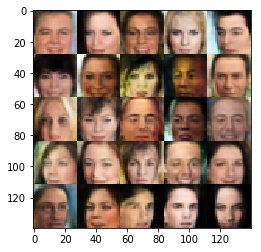

Epoch 1/2... Batch 2945/3165... Discriminator loss: 0.8427 Generator loss: 4.7610
Epoch 1/2... Batch 2955/3165... Discriminator loss: 0.4728 Generator loss: 2.5888
Epoch 1/2... Batch 2965/3165... Discriminator loss: 0.5147 Generator loss: 2.1757
Epoch 1/2... Batch 2975/3165... Discriminator loss: 0.7158 Generator loss: 1.2901
Epoch 1/2... Batch 2985/3165... Discriminator loss: 0.5350 Generator loss: 2.1791
Epoch 1/2... Batch 2995/3165... Discriminator loss: 0.5777 Generator loss: 1.6440



Batches:  95%|████████████████████████████████████████████████████████████████████▏   | 3000/3165 [08:54<00:29,  5.56batch/s]

Epoch 1/2... Batch 3005/3165... Discriminator loss: 0.6683 Generator loss: 5.0400
Epoch 1/2... Batch 3015/3165... Discriminator loss: 0.3881 Generator loss: 3.1925
Epoch 1/2... Batch 3025/3165... Discriminator loss: 0.5123 Generator loss: 3.0866
Epoch 1/2... Batch 3035/3165... Discriminator loss: 0.3609 Generator loss: 4.0109


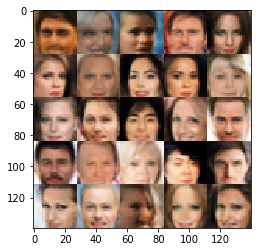

Epoch 1/2... Batch 3045/3165... Discriminator loss: 0.3844 Generator loss: 3.2912
Epoch 1/2... Batch 3055/3165... Discriminator loss: 0.5223 Generator loss: 2.1193
Epoch 1/2... Batch 3065/3165... Discriminator loss: 0.4088 Generator loss: 5.1246
Epoch 1/2... Batch 3075/3165... Discriminator loss: 0.7286 Generator loss: 7.4722
Epoch 1/2... Batch 3085/3165... Discriminator loss: 0.4260 Generator loss: 2.8279
Epoch 1/2... Batch 3095/3165... Discriminator loss: 0.4417 Generator loss: 4.3844



Batches:  98%|██████████████████████████████████████████████████████████████████████▌ | 3100/3165 [09:11<00:11,  5.58batch/s]

Epoch 1/2... Batch 3105/3165... Discriminator loss: 0.4467 Generator loss: 3.6955
Epoch 1/2... Batch 3115/3165... Discriminator loss: 0.4368 Generator loss: 3.8710
Epoch 1/2... Batch 3125/3165... Discriminator loss: 0.3679 Generator loss: 3.9654
Epoch 1/2... Batch 3135/3165... Discriminator loss: 0.5848 Generator loss: 3.3203


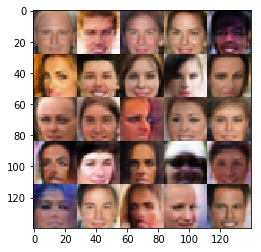

Epoch 1/2... Batch 3145/3165... Discriminator loss: 0.4030 Generator loss: 3.2939
Epoch 1/2... Batch 3155/3165... Discriminator loss: 0.3968 Generator loss: 4.4071
Epoch 1/2... Batch 3165/3165... Discriminator loss: 0.3992 Generator loss: 2.9496



Epochs: 100%|██████████████████████████████████████████████████████████████████████████████| 2/2 [19:55<00:00, 611.55s/epoch]


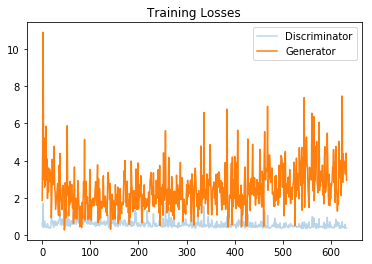

In [27]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5
alpha = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode, alpha)

In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5
alpha = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode, alpha)

In [ ]:
batch_size = 32
z_dim = 200
learning_rate = 0.002
beta1 = 0.3 # learning doesn't seem as fast, faces generated seem blemished
alpha = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode, alpha)

In [ ]:
batch_size = 32
z_dim = 200
learning_rate = 0.01 # too high
beta1 = 0.5
alpha = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode, alpha)

In [ ]:
batch_size = 32
z_dim = 200
learning_rate = 0.004 # too high
beta1 = 0.5
alpha = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode, alpha)

In [18]:
z_dim = 200
beta1 = 0.5

Generating faces from saved checkpoint: checkpoints\generator_bs32_zd200_lr0.002_b0.3.ckpt


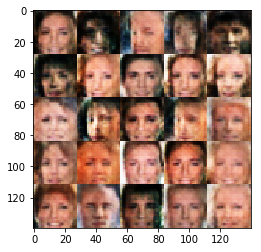

In [68]:
generate_faces()

Generating faces from saved checkpoint: checkpoints\generator_bs32_zd200_lr0.002_b0.3.ckpt


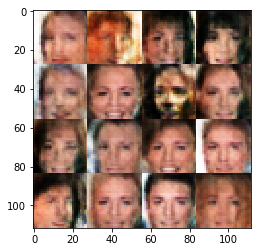

In [71]:
generate_faces(show_n_images=16)

Generating faces from saved checkpoint: checkpoints\generator_bs32_zd200_lr0.002_b0.3_ep1.ckpt


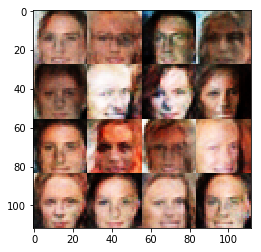

In [103]:
generate_faces(z_dim=200, show_n_images=16)

Generating faces from saved checkpoint: checkpoints\generator_bs32_zd100_lr0.0002_b0.5_ep1.ckpt


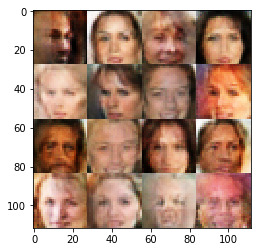

In [40]:
generate_faces(show_n_images=16)

Generating faces from saved checkpoint: checkpoints\generator_bs32_zd100_lr0.0002_b0.5_ep1.ckpt


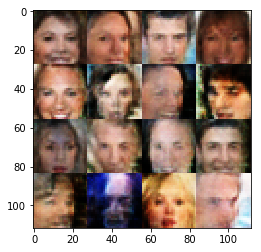

In [28]:
generate_faces(show_n_images=16)

Generating faces from saved checkpoint: checkpoints\generator_bs64_zd100_lr0.0002_b0.5_ep5.ckpt


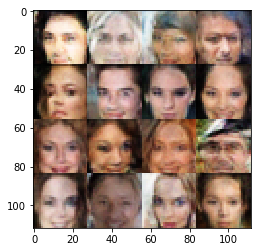

In [26]:
generate_faces(show_n_images=16)

Generating faces from saved checkpoint: checkpoints\generator_bs32_zd200_lr0.002_b0.5.ckpt


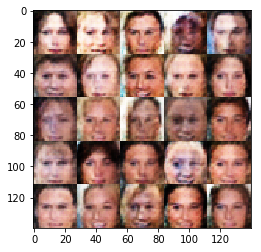

In [36]:
generate_faces('checkpoints\generator_bs32_zd200_lr0.002_b0.5.ckpt')

Generating faces from saved checkpoint: checkpoints\generator_bs32_zd200_lr0.002_b0.5.ckpt


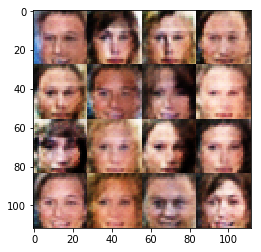

In [76]:
generate_faces('checkpoints\generator_bs32_zd200_lr0.002_b0.5.ckpt', show_n_images=16)

Generating faces from saved checkpoint: checkpoints\generator_bs64_zd100_lr0.0002_b0.5.ckpt


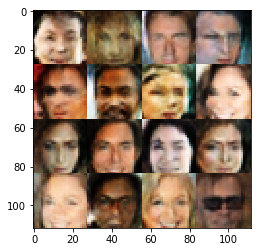

In [28]:
generate_faces(show_n_images=16)

Generating faces from saved checkpoint: checkpoints\generator_bs32_zd100_lr0.0002_b0.5_ep1.ckpt


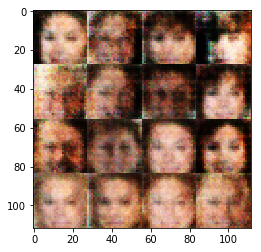

In [25]:
# with generator init_stddev=0.01 and discriminator init_stddev=0.1
generate_faces(show_n_images=16)

Generating faces from saved checkpoint: checkpoints\generator_bs32_zd100_lr0.0002_b0.5_ep1.ckpt


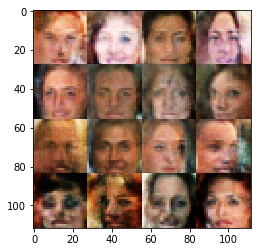

In [32]:
# with generator init_stddev=0.1 and discriminator init_stddev=0.01
generate_faces(show_n_images=16)

Generating faces from saved checkpoint: checkpoints\generator_bs32_zd100_lr0.0002_b0.5_ep1.ckpt


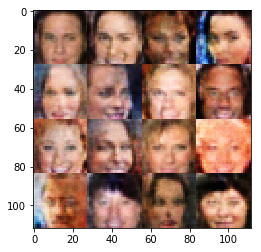

In [50]:
# with generator init_stddev=0.1 and discriminator init_stddev=0.1
generate_faces(show_n_images=16)

Generating faces from saved checkpoint: checkpoints\generator_bs32_zd100_lr0.0002_b0.5_ep1.ckpt


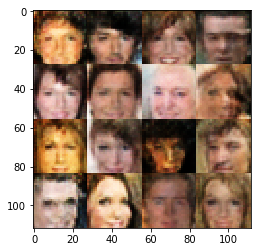

In [40]:
# with generator init_stddev=None and discriminator init_stddev=None
generate_faces(show_n_images=16)

Generating faces from saved checkpoint: checkpoints\generator_bs64_zd100_lr0.0002_b0.5_ep5.ckpt


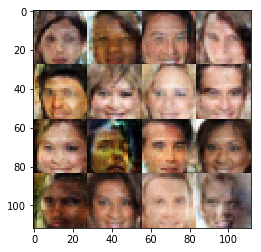

In [98]:
# with generator init_stddev=None and discriminator init_stddev=None, epochs=5
# More epochs doesn't seem quite stable
generate_faces(show_n_images=16)

Generating faces from saved checkpoint: checkpoints\generator_bs64_zd100_lr0.0002_b0.5_ep5.ckpt


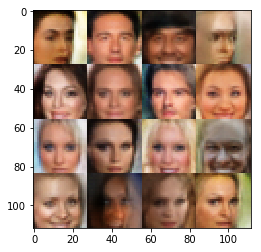

In [26]:
# with generator init_stddev=None and discriminator init_stddev=None, epochs=5, dropout 0.5
# Dropout helps a lot with results with more epochs
generate_faces(show_n_images=16)

Generating faces from saved checkpoint: checkpoints\generator_bs64_zd100_lr0.0002_b0.5_ep2.ckpt


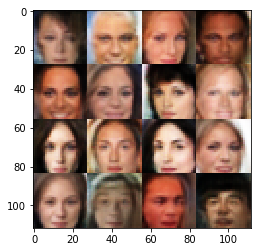

In [28]:
# with generator init_stddev=None and discriminator init_stddev=None, epochs=2, dropout 0.5
# Dropout helps a lot with results with more epochs. Results from just 2 epochs look good.
generate_faces(show_n_images=16)

Generating faces from saved checkpoint: checkpoints\generator_bs64_zd100_lr0.0002_b0.5_ep2.ckpt


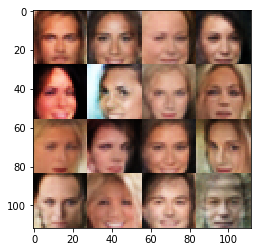

In [37]:
# with generator init_stddev=None and discriminator init_stddev=None, epochs=2, dropout 0.5
# Dropout helps a lot with results with more epochs. Results from just 2 epochs look good.
generate_faces(show_n_images=16)

Generating faces from saved checkpoint: checkpoints\generator_bs32_zd100_lr0.0002_b0.5_ep1.ckpt


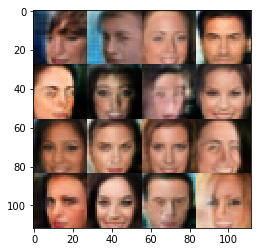

In [41]:
# with generator init_stddev=None and discriminator init_stddev=None, epochs=1, dropout 0.5
# Dropout helps a lot with results. Results from just 1 epoch look good.
generate_faces(show_n_images=16)

Generating faces from saved checkpoint: checkpoints\generator_bs32_zd100_lr0.0002_b0.5_ep1.ckpt


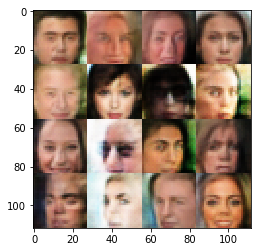

In [42]:
# with generator init_stddev=None and discriminator init_stddev=None, epochs=1, dropout 0.5
# Dropout helps a lot with results. Results from just 1 epoch look good.
generate_faces(show_n_images=16)

Generating faces from saved checkpoint: checkpoints\generator_bs32_zd100_lr0.0002_b0.5_ep1.ckpt


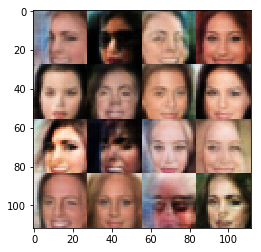

In [43]:
# with generator init_stddev=None and discriminator init_stddev=None, epochs=1, dropout 0.5
# Dropout helps a lot with results. Results from just 1 epoch look good.
generate_faces(show_n_images=16)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.